<a href="https://colab.research.google.com/github/ronan777/BayseAnimation/blob/master/GetH11_DelayAmpLocate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q condacolab
import condacolab
condacolab.install()
!conda install obspy
from obspy.clients.fdsn import Client
from obspy import UTCDateTime
from obspy import read_inventory
from obspy import read
import obspy.core.stream as st
import obspy.signal.cross_correlation as cc
import obspy.signal.filter as flt
import obspy.signal.trigger as trg
import obspy.signal.freqattributes as frq
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import scipy.optimize as opt
import math
import gc


✨🍰✨ Everything looks OK!
Channels:
 - conda-forge
Platform: linux-64
Solving environment: \ | / - done


==> WARNING: A newer version of conda exists. <==
    current version: 23.11.0
    latest version: 24.7.1

Please update conda by running

    $ conda update -n base -c conda-forge conda



# All requested packages already installed.



10800.0
(-1.9386950000000207, 0.49834692578129824) (-1.3987489999999372, -1.4550044492706635)


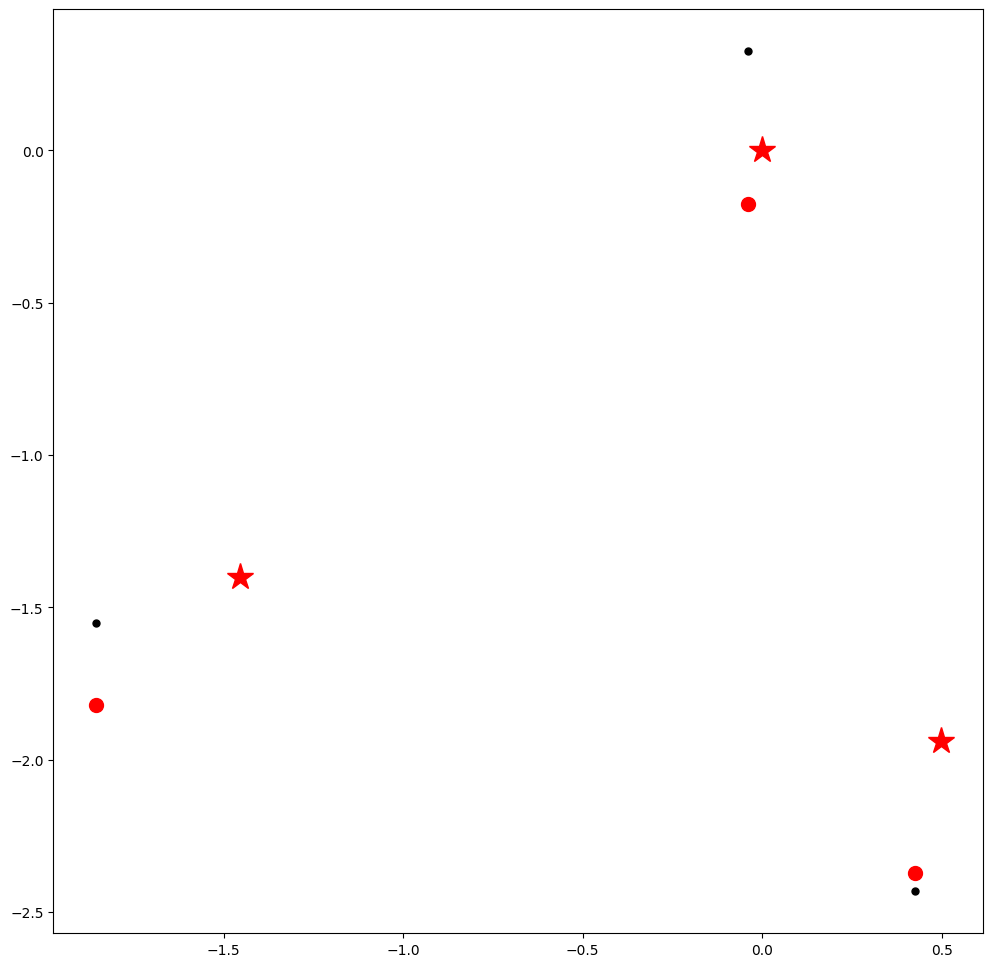

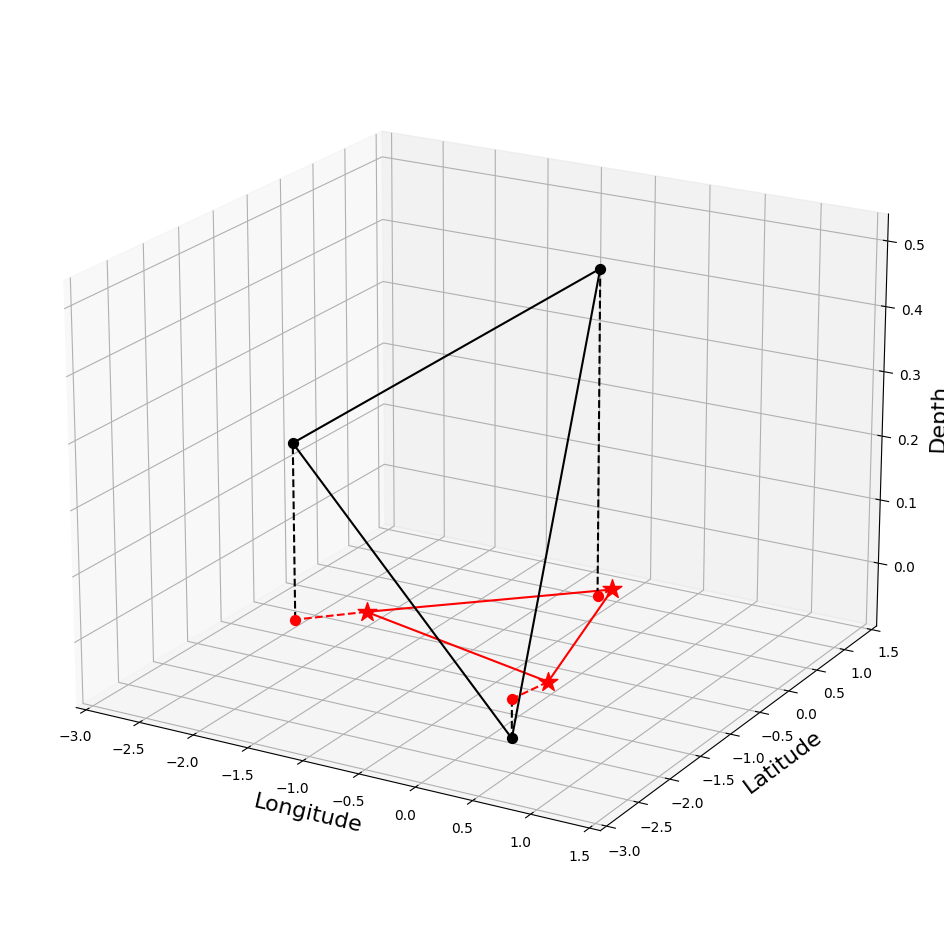

In [63]:
##
# Parameter initialization
#
#timestring="2024-02-21 01:00:00"
#timestring="2024-02-20 23:00:00"
#timestring="2024-02-20 21:00:00"
#timestring="2024-02-20 19:00:00"
#timestring="2024-02-20 17:00:00"
#timestring="2024-02-20 15:00:00"
#timestring="2024-02-20 14:00:00"
#timestring="2024-02-20 12:00:00"
#timestring="2024-02-20 10:00:00"
#timestring="2024-02-20 09:00:00"
#timestring="2024-02-20 07:00:00"
#timestring="2024-02-20 07:30:00"
#timestring="2024-02-20 05:30:00"
#timestring="2024-02-20 05:00:00"
#timestring="2024-02-20 03:00:00"
#timestring="2024-02-20 01:00:00"
#timestring="2024-02-20 02:00:00"
#timestring="2024-02-20 02:20:00"
#timestring="2024-02-20 02:22:00"
#timestring="2024-02-20 02:30:00"
#timestring="2024-02-19 23:00:00"
timestring="2024-02-19 21:00:00"
#timestring="2024-02-19 19:00:00"
#timestring="2024-02-19 18:20:00"
timestring0="2024-02-19 18:00:00"
starttime=UTCDateTime(timestring)
starttime0=UTCDateTime(timestring0)
firsttime=starttime-starttime0
print(firsttime)
Interval = 36000
#Interval = 900
#Interval = 3600
#Interval = 7200
#Interval = 1800
#Interval = 9600
path="/content/drive/MyDrive/MSEED/"
hvel = 1.48
depth = -0.739
coord_correction = True
#
#
#
# Map of the triplet
#
#
#
h11s1=(18.50827,166.700272)
h11s2=(18.49082,166.705002)
h11s3=(18.49568,166.686462)
kmdeg=111.1
x2=(kmdeg*(h11s2[0]-h11s1[0]),kmdeg*(h11s2[1]-h11s1[1])*math.cos(np.pi*18.5/180))
x3=(kmdeg*(h11s3[0]-h11s1[0]),kmdeg*(h11s3[1]-h11s1[1])*math.cos(np.pi*18.5/180))
print(x2,x3)
S1 = (0., 0., 0.)
S2 = (x2[1], x2[0], 0.)
S3 = (x3[1], x3[0], 0.)
Delta_S = np.load(path+"Delta_S"+"_"+timestring+"_"+str(Interval)+".npy")

fig, ax = plt.subplots(figsize=(12, 12), )
plt.plot([0],[0],'r*', markersize=20)
plt.plot([x2[1]],[x2[0]],'r*', markersize=20)
plt.plot([x3[1]],[x3[0]],'r*', markersize=20)
plt.plot([0],[0],'r-')
if (coord_correction):
# plt.plot([Delta_S[1]]+Delta_S[0],[Delta_S[2]]+Delta_S[3],'r.', markersize=20)
  plt.plot([x3[1]]+Delta_S[6],[x3[0]]+Delta_S[7],'r.', markersize=20)
  plt.plot([x2[1]]+Delta_S[3],[x2[0]]+Delta_S[4],'r.', markersize=20)
  plt.plot(Delta_S[0],Delta_S[1],'r.', markersize=20)
  plt.plot([x3[1]]+Delta_S[6],[x3[0]]+Delta_S[7]+Delta_S[8],'ko', markersize=5)
  plt.plot([x2[1]]+Delta_S[3],[x2[0]]+Delta_S[4]+Delta_S[5],'ko', markersize=5)
  plt.plot(Delta_S[0],Delta_S[1]+Delta_S[2],'ko', markersize=5)
  ax = plt.figure(figsize=(12, 12)).add_subplot(projection='3d')
  t1x=(S1[0],S2[0],S3[0], S1[0])
  t1y=(S1[1],S2[1],S3[1], S1[1])
  t1z=(S1[2],S2[2],S3[2], S1[2])
  ax.plot(t1x,t1y,t1z,'r-')
  t2x=(S1[0]+Delta_S[0],S2[0]+Delta_S[3],S3[0]+Delta_S[6], S1[0]+Delta_S[0])
  t2y=(S1[1]+Delta_S[1],S2[1]+Delta_S[4],S3[1]+Delta_S[7], S1[1]+Delta_S[1])
  t2z=(S1[2]+Delta_S[2],S2[2]+Delta_S[5],S3[2]+Delta_S[8], S1[2]+Delta_S[2])
  ax.plot(t2x,t2y,t2z,'k-')
  l1x = (S1[0],S1[0]+Delta_S[0])
  l1y = (S1[1],S1[1]+Delta_S[1])
  l1z = (0.,0.)
  ax.plot(l1x,l1y,l1z,'r--')
  l1x = (S2[0],S2[0]+Delta_S[3])
  l1y = (S2[1],S2[1]+Delta_S[4])
  l1z = (0.,0.)
  ax.plot(l1x,l1y,l1z,'r--')
  l1x = (S3[0],S3[0]+Delta_S[6])
  l1y = (S3[1],S3[1]+Delta_S[7])
  l1z = (0.,0.)
  ax.plot(l1x,l1y,l1z,'r--')
  l1x = (S1[0]+Delta_S[0],S1[0]+Delta_S[0])
  l1y = (S1[1]+Delta_S[1],S1[1]+Delta_S[1])
  l1z = (0.,Delta_S[2])
  ax.plot(l1x,l1y,l1z,'k--')
  l1x = (S2[0]+Delta_S[3],S2[0]+Delta_S[3])
  l1y = (S2[1]+Delta_S[4],S2[1]+Delta_S[4])
  l1z = (0.,Delta_S[5])
  ax.plot(l1x,l1y,l1z,'k--')
  l1x = (S3[0]+Delta_S[6],S3[0]+Delta_S[6])
  l1y = (S3[1]+Delta_S[7],S3[1]+Delta_S[7])
  l1z = (0.,Delta_S[8])
  ax.plot(l1x,l1y,l1z,'k--')
  siz = ([200])
  ax.scatter(S1[0], S1[1], S1[2], c='r', marker='*', s=siz)
  ax.scatter(S2[0], S2[1], S2[2], c='r', marker='*', s=siz)
  ax.scatter(S3[0], S3[1], S3[2], c='r', marker='*', s=siz)
  ax.scatter(Delta_S[0], Delta_S[1], 0.,c='r',marker='.', s=siz)
  ax.scatter(S2[0]+Delta_S[3], S2[1]+Delta_S[4], 0.,c='r',marker='.', s=siz)
  ax.scatter(S3[0]+Delta_S[6], S3[1]+Delta_S[7], 0.,c='r',marker='.', s=siz)
  ax.scatter(Delta_S[0], Delta_S[1],Delta_S[2],c='k',marker='.', s=siz)
  ax.scatter(S2[0]+Delta_S[3], S2[1]+Delta_S[4],Delta_S[5],c='k',marker='.', s=siz)
  ax.scatter(S3[0]+Delta_S[6], S3[1]+Delta_S[7],Delta_S[8],c='k',marker='.', s=siz)
  elev = 20.
  azim = 300.
  roll = 0.
  ax.view_init(elev, azim, roll)
#plt.xticks(fontsize=16)
#plt.yticks(fontsize=16)
ax.set_xlabel("Longitude", size = 16)
ax.set_ylabel("Latitude", size = 16)
ax.set_zlabel("Depth", size = 16)
ticks = np.arange(-3.,1.5,0.5)
#ax.set_xticks(ticks)
#ax.set_yticks(size = 20)
#ax.set_zticks(size = 20)
#plt.ylabel('Latitude', size=20)
#plt.xlabel('Longitude', size=20)
#plt.zlabel('Depth', size=20)
#plt.annotate('H11S1',xy=(0,0),xytext=(0,0.1),fontsize=20)
#plt.annotate('H11S2',xy=(x2[1],x2[0]),xytext=(x2[1],x2[0]+0.1),fontsize=20)
#plt.annotate('H11S3',xy=(x3[1],x3[0]),xytext=(x3[1],x3[0]+0.1),fontsize=20)
plt.xlim([-3,1.5])
plt.ylim([-3,1.5])
plt.show()
#
#
# Define functions to be used by several modules.
#
def Norm(A):
  return math.sqrt(A[0]*A[0]+A[1]*A[1]+A[2]*A[2])

def Diff(A,B):
  return (A[0]-B[0], A[1]-B[1],A[2]-B[2])

def Delays12_13 (S1,S2,S3,x,hvel):
#  print(S1,S2,S3,x)
  dt12 = (Norm(Diff(S2,x))-Norm(Diff(S1,x)))/hvel
  dt13 = (Norm(Diff(S3,x))-Norm(Diff(S1,x)))/hvel
  return dt12,dt13
#
# Theoretical amplitude ratios given current point and
#  three hydrophone coordinates
#
def AmpRatios (S1,S2,S3,x):

  r12 = Norm(Diff(S2,x))/Norm(Diff(S1,x))
  r13 = Norm(Diff(S3,x))/Norm(Diff(S1,x))
  return r12,r13

def Dist(d12,d13,a12,a13):
  D1 = d12*hvel/(a12-1.)
  D2 = D1+hvel*d12
  D3 = D1+hvel*d13
  return D1,D2,D3
#
#
#
def CompDt(d, vert, wvel):
  '''
	Computes two time differences given two input vectors giving the triad geometry in East-North coordinate system.
	The vectors are (sta2-sta1) and (st3-sta1), where sta1, sta2, and sta3 are the hydrophone elements
	of the triad.
	The time differences are the difference in propagation time of an acoustic wave in the water
  given a velocity of wvel km/s. This time difference is computed using the dot product of the diretion of
  propagation with each vector, divided by the velocity. The direction of the plane wave is given by the azimuth d,
  and the vertical angle vert.

                        d1
	sta1 	O----------------->O sta2
	        |
	     d2 |
	        |
		v
	sta3    O

	For instance if sta2 is one kilometer to the east of sta1, and sta3 is 0.5 kilometers to the south of sta1,
	the first vector is (1.,0), and the second vector is (0.,-0.5)

	Input:
		d1: first vector (tuple with two floats)
		d2: second vector (tuple with two floats)
		d:  direction in radian from East. Counterclockwise is positive.
	Output:
		dt1, dt2: tuple containing the two time differences
  '''
#
#
#
  vertrad = np.pi*float(vert)/180.
  dot = -1.*S2[0]*math.sin(d)*math.cos(vertrad)-S2[1]*math.cos(d)*math.cos(vertrad)+S2[2]*math.sin(vertrad)
  dt1 = dot/wvel
  dot = -1.*S3[0]*math.sin(d)*math.cos(vertrad)-S3[1]*math.cos(d)*math.cos(vertrad)+S3[2]*math.sin(vertrad)
  dt2 = dot/wvel
  return dt1, dt2
#
# Find optimum location given delays, amplitude ratios, velocity
#
def MinRes (d12,d13,a12,a13,wdepth,delay_only,amp_only):
  if (delay_only and amp_only):
     exit(1)
  verbose = False
  resmin = 9999999999999999999999999999999.
  if (verbose):
    print(d12, d13, a12, a13)
  x_opt = 0.
  y_opt = 0.
  z_opt = wdepth
  norm = (Norm(Diff(S2,S1))+Norm(Diff(S3,S1))+Norm(Diff(S3,S2)))/hvel/3
  #
  # Find first point
  #
  N = 0
  ndepths = 1
  nx=400
  xprev = 0
  yprev = 0
  resmap = np.zeros((nx,nx))
  for ix in range(nx) :
    xh = xprev+(ix-nx/2)*0.025
    for iy in range(nx) :
      yh = yprev+(iy-nx/2)*0.025
      for d in range(ndepths) :
        tdepth = wdepth+d*0.025
#        print(xh,yh,tdepth)
#
# Calculate theoretical delays 12 and 13 using straight rays
#
        x = (xh, yh, tdepth)
        dt12,dt13 = Delays12_13 (S1,S2,S3,x,hvel)
        at12, at13 = AmpRatios (S1,S2,S3,x)
#         print(dt12,dt13)
#
#
        if (delay_only):
          res = math.sqrt((d12-dt12)*(d12-dt12)+(d13-dt13)*(d13-dt13))
        elif (amp_only):
          res = math.sqrt((a12-at12)*(a12-at12)+(a13-at13)*(a13-at13))
        else :
          res = math.sqrt((a12-at12)*(a12-at12)+(a13-at13)*(a13-at13)+
           ((d12-dt12)*(d12-dt12)+(d13-dt13)*(d13-dt13)))
        N += 1
#        print(N, res)
        resmap[iy,ix] = res
        if (res < resmin):
#          print(N, res)
          resmin = res
          x_opt = xh
          y_opt = yh
          z_opt = tdepth
#         print(dt12,dt13)
      yh += 0.025
    xh += 0.025
#
#
  return resmin, x_opt, y_opt, z_opt, resmap
#
def MinResInc (d12,d13,a12,a13,xprev,yprev,dprev,delay_only,amp_only):
  if (delay_only and amp_only):
     exit(1)
  verbose = False
  resmin = 9999999999999999999999999999999.
  if(verbose):
    print("delays",d12,d13)
    print("amp ratios", a12,a13)
  x_opt = 0.
  y_opt = 0.
  z_opt = dprev
  if (verbose):
    print("previous depth",dprev)
  norm = (Norm(Diff(S2,S1))+Norm(Diff(S3,S1))+Norm(Diff(S3,S2)))/hvel/3
  #
  # Find next minimum in a cube centered on previous print
  #
  N = 0
  xh = xprev
  nx = 100
  ndepth = 1
  resmap = np.zeros((nx,nx))
  for ix in range(nx) :
    xh = xprev+(ix-nx/2)*0.025
    yh = yprev
    for iy in range(nx) :
      yh = yprev+(iy-nx/2)*0.025
      for d in range(ndepth) :
        tdepth = dprev+d*0.025
#        print(xh,yh,tdepth)
        x = (xh, yh, tdepth)
        dt12,dt13 = Delays12_13 (S1,S2,S3,x,hvel)
        at12, at13 = AmpRatios (S1,S2,S3,x)
#        print(dt12,dt13)
#
        if (delay_only):
          res = math.sqrt((d12-dt12)*(d12-dt12)+(d13-dt13)*(d13-dt13))
        elif (amp_only):
          res = math.sqrt((a12-at12)*(a12-at12)+(a13-at13)*(a13-at13))
        else :
          res = math.sqrt((a12-at12)*(a12-at12)+(a13-at13)*(a13-at13)+
           ((d12-dt12)*(d12-dt12)+(d13-dt13)*(d13-dt13))/norm/norm)
        N += 1
#        print(N, res)
        resmap[iy,ix] = res
        if (res < resmin):
#          print(N, res)
          resmin = res
          dt12_opt = dt12
          dt13_opt = dt13
          at12_opt = at12
          at13_opt = at13
          x_opt = xh
          y_opt = yh
          z_opt = tdepth
#          print(dt12,dt13,at12,at13)
#
#
#
  if (verbose):
    print("T delays",dt12_opt,dt13_opt)
    print("T amp ratios",at12_opt,at13_opt)
  return resmin, x_opt, y_opt, z_opt, resmap



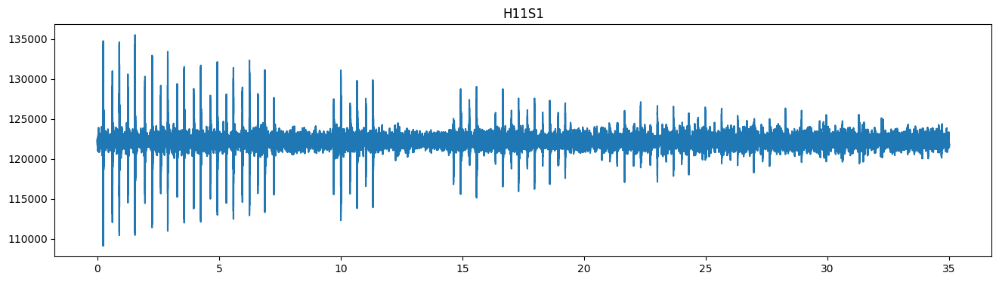

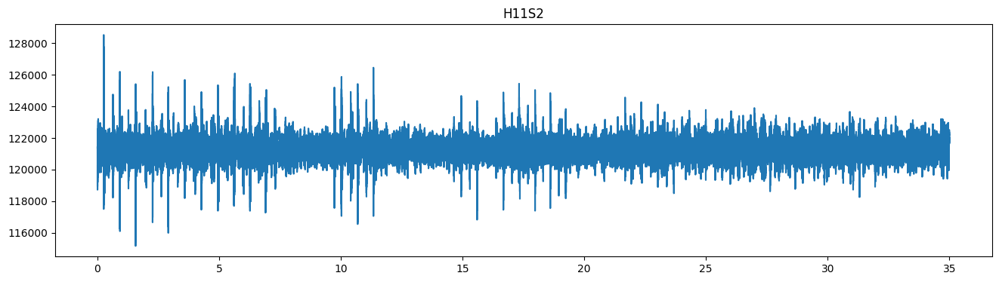

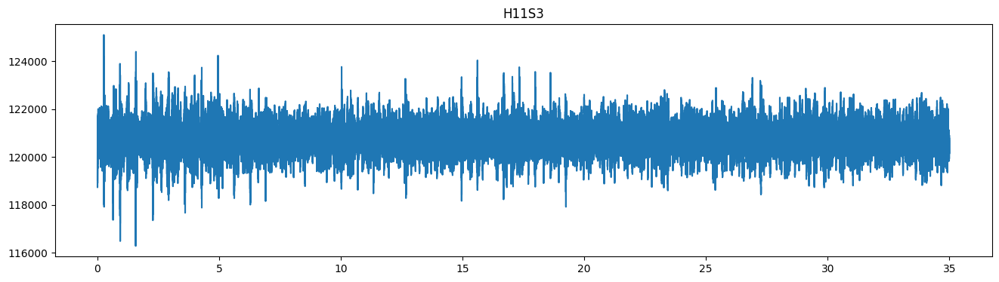

In [41]:
#
# Read all three waveforms, save to disk, and plot waveforms
#
#
#
#
# Get epoch time from UTCDateTime
# Get two hours of data
#
dT = 10
ndT = dT*250+1
#
mseedfileS2="H11S2_"+timestring+"_"+str(Interval)+".mseed"
mseedfileS3="H11S3_"+timestring+"_"+str(Interval)+".mseed"
mseedfileS1="H11S1_"+timestring+"_"+str(Interval)+".mseed"
plotdelay="delays_"+timestring+"_"+str(Interval)+".png"
plotdistance="dist_"+timestring+"_"+str(Interval)+".png"
plotdistance_cor="cor_dist_"+timestring+"_"+str(Interval)+".png"
n10=0
#
#
client = Client("IRIS")
w2 = client.get_waveforms("IM","H11S2","*","EDH",starttime,starttime+Interval,attach_response=False)
w2.write(path+mseedfileS2,format="MSEED")
w3 = client.get_waveforms("IM","H11S3","*","EDH",starttime,starttime+Interval,attach_response=False)
w3.write(path+mseedfileS3,format="MSEED")
w1 = client.get_waveforms("IM","H11S1","*","EDH",starttime,starttime+Interval,attach_response=False)
w1.write(path+mseedfileS1,format="MSEED")
ndT = Interval*250
tseg=np.empty(ndT)
nt=0
while nt < ndT :
  tseg[nt] = nt/250./60.
  nt+=1
endt = len(w1[0].data)
if (endt > ndT) :
   endt = ndT
fig, ax = plt.subplots(figsize=(16, 4), )
plt.plot(tseg[0:endt-1], w1[0].data[0:endt-1])
plt.title("H11S1")
plt.show()
fig, ax = plt.subplots(figsize=(16, 4), )
plt.plot(tseg[0:endt-1], w2[0].data[0:endt-1])
#plt.plot(w2[0])
plt.title("H11S2")
plt.show()
fig, ax = plt.subplots(figsize=(16, 4), )
plt.plot(tseg[0:endt-1], w3[0].data[0:endt-1])
#plt.plot(w3[0])
plt.title("H11S3")
plt.show()


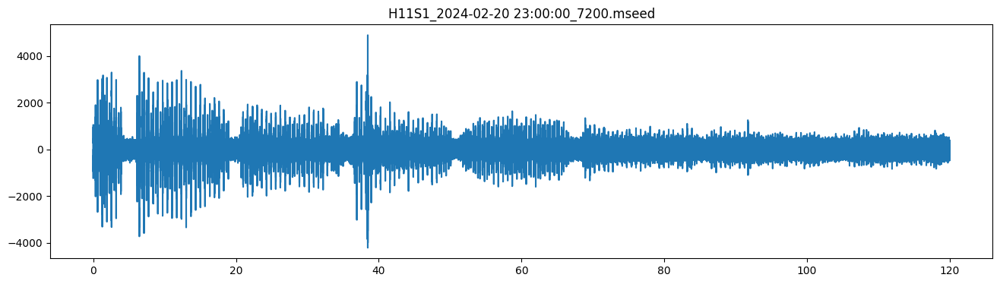

In [87]:
#
#  Read from disk and plot waveforms - Optional filtering
#
mseedfileS2="H11S1_"+timestring+"_"+str(Interval)+".mseed"
st1 = read(path+mseedfileS2)

fig, ax = plt.subplots(figsize=(16, 4), )
ndT = len(st1[0].data)
tseg=np.empty(ndT)
nt=0
dt=250
while nt < ndT :
  tseg[nt] = nt/250./60.
  nt+=1
w1 = flt.bandpass(st1.detrend(type='linear')[0].data, 5, 50, dt)
plt.plot(tseg, w1)
plt.title(mseedfileS2)
plt.show()

-113.35611032971714 68.01379973689585


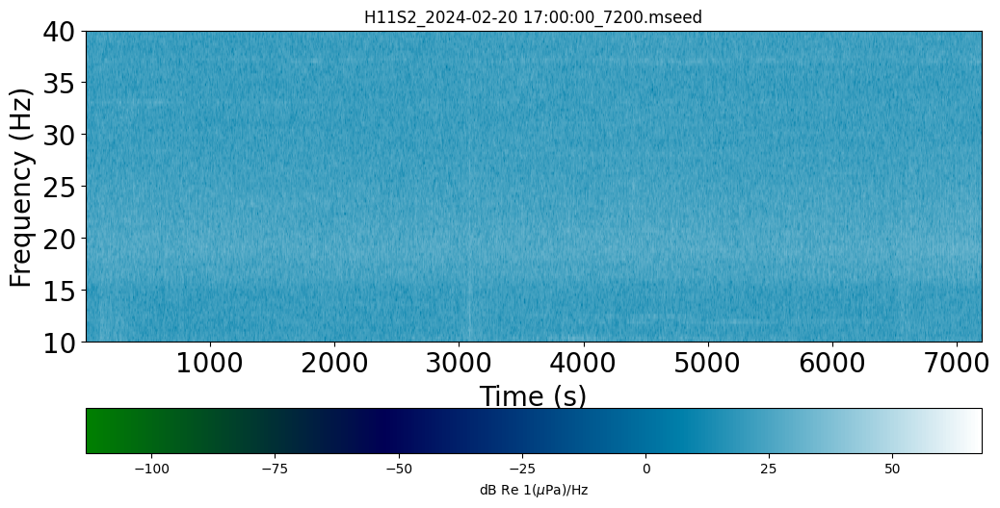

In [73]:
#
#  Read from disk and plot a spectrogram
#
mseedfileS2="H11S2_"+timestring+"_"+str(Interval)+".mseed"
st1 = read(path+mseedfileS2)
fig, ax = plt.subplots(figsize=(12, 6), )
#cmap = (mpl.colors.ListedColormap(['white', 'grey', 'cyan', 'yellow'])
#        .with_extremes(under='yellow', over='magenta'))
#bounds = [0, 50, 60, 65, 68]
#norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
spec, freq, times, im = plt.specgram(st1[0].data, Fs=250., scale='dB',detrend = 'linear', cmap='ocean', NFFT=1024, noverlap=512)
plt.ylim([10,40])
#plt.xlim([5400,7200])
plt.title(mseedfileS2)
print(10*math.log10(spec.min()),10*math.log10(spec.max()))
#
#
#
#plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='ocean'),label="dB Re 1Pa/Hz", orientation="horizontal", spacing='proportional')
plt.colorbar(label="dB Re 1($\u03BC$Pa)/Hz", orientation="horizontal")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel('Frequency (Hz)', fontsize=20)
plt.xlabel('Time (s)', fontsize=20)
plt.show()

[1. 1.]
1 Trace(s) in Stream:
IM.H11S2..EDH | 2024-02-20T23:00:00.003000Z - 2024-02-21T00:59:59.999000Z | 250.0 Hz, 1800000 samples


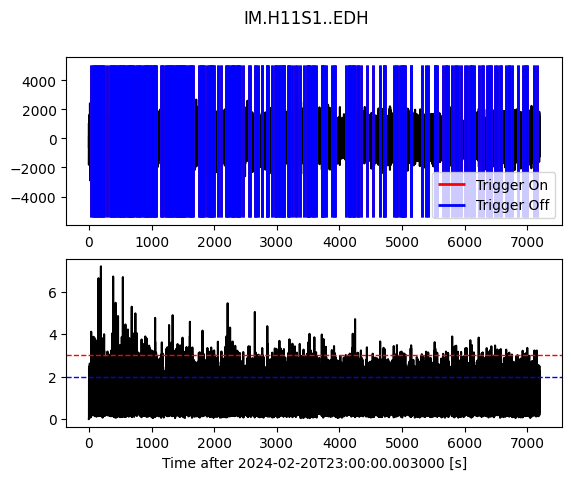

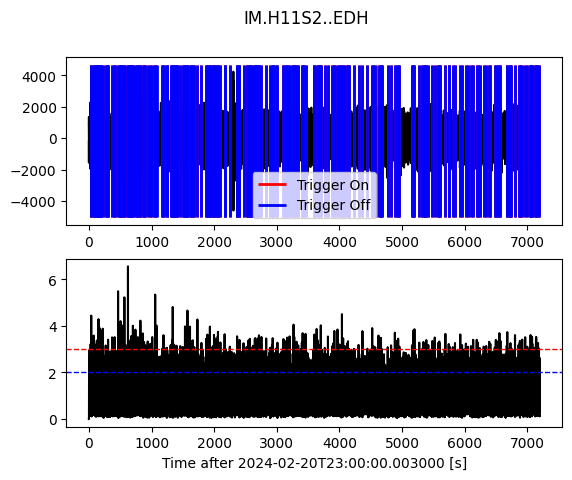

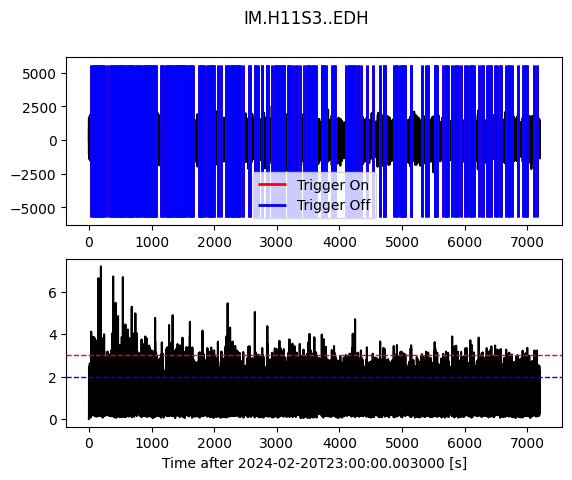

length of envelope: 1800000
number of picks env1: 243
number of picks env2: 254
number of picks env3: 195
Time in minutes: 0.6092
Segment 0 Time step: 250.0 243 segments
Times of pick onsets: 36.552 37.172 35.08
Shift and max: 1.464 [0.37740343] 1.428 [0.57797466]
Time in minutes: 2.5004666666666666
Segment 6 Time step: 250.0 243 segments
Times of pick onsets: 150.028 150.66 150.52
Shift and max: -1.004 [0.14988411] 0.356 [0.128092]
negative delay and s1 > s2
Time in minutes: 3.2024666666666666
Segment 9 Time step: 250.0 243 segments
Times of pick onsets: 192.148 192.936 191.644
Shift and max: 0.852 [0.49869633] 1.448 [0.41977256]
Time in minutes: 8.753533333333333
Segment 26 Time step: 250.0 243 segments
Times of pick onsets: 525.212 526.176 526.74
Shift and max: 0.952 [0.55773844] 2.144 [0.33211739]
Time in minutes: 9.041400000000001
Segment 27 Time step: 250.0 243 segments
Times of pick onsets: 542.484 543.368 543.288
Shift and max: 1.008 [0.60992287] 1.984 [0.44907939]
Time in minu

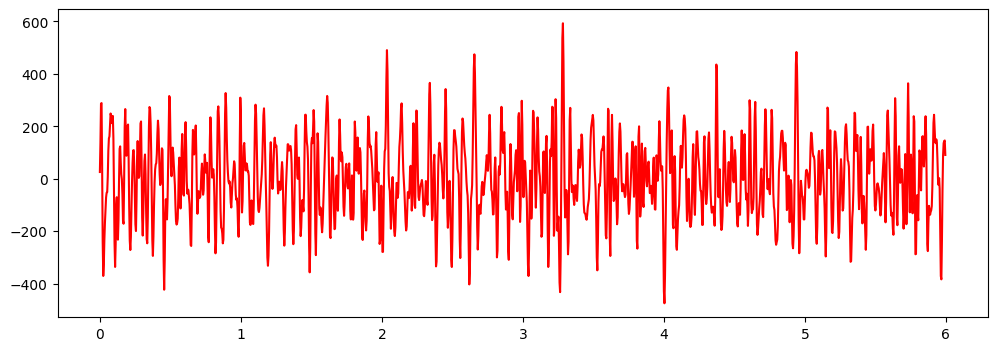

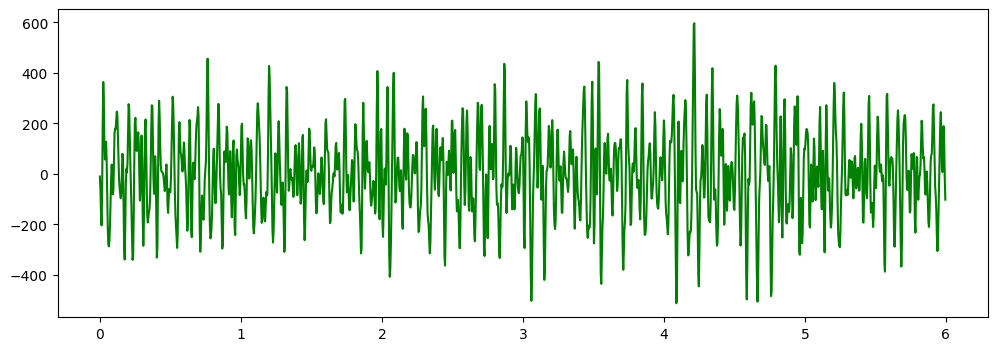

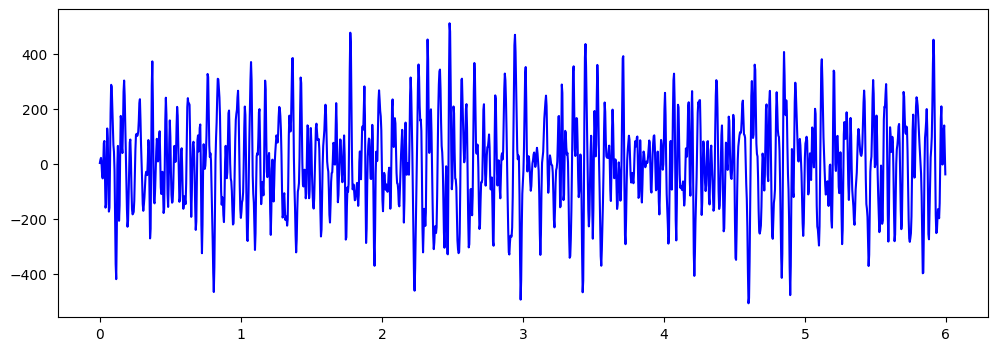

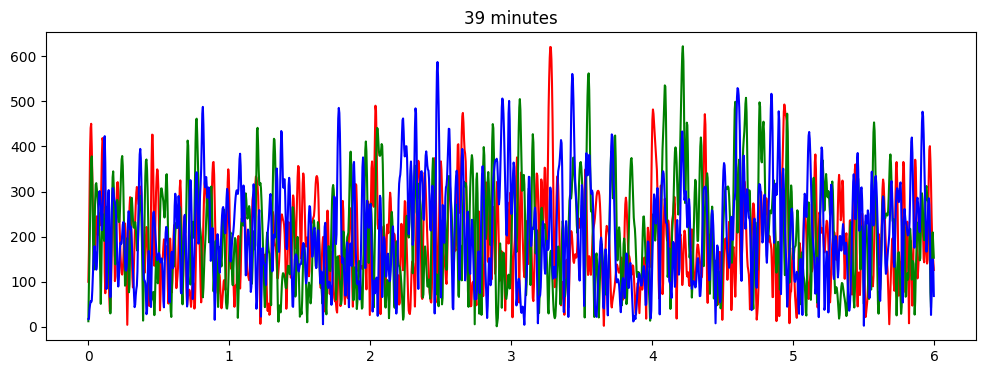

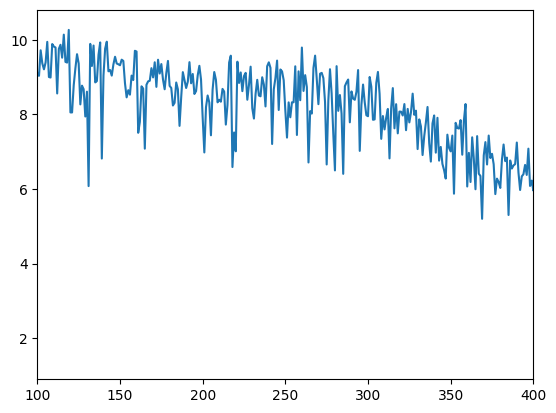

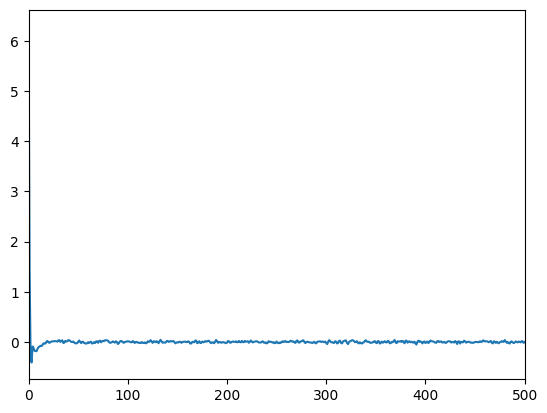

Time in minutes: 89.75826666666667
Segment 200 Time step: 250.0 243 segments
Times of pick onsets: 5385.496 5387.944 5386.28
Shift and max: 0.152 [0.15674922] 0.124 [0.12891602]


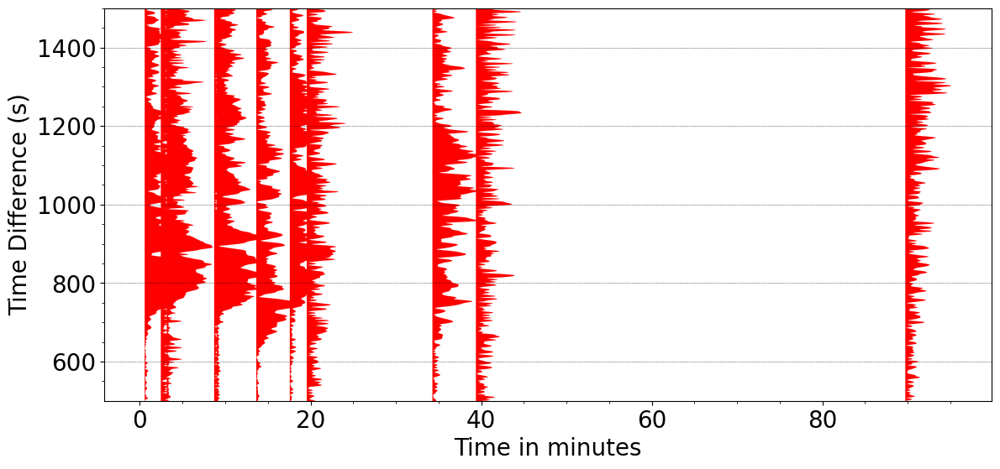

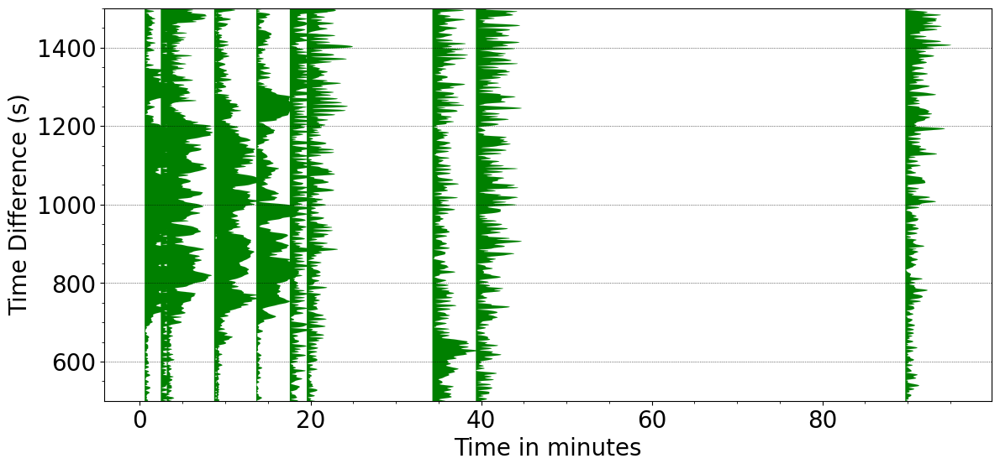

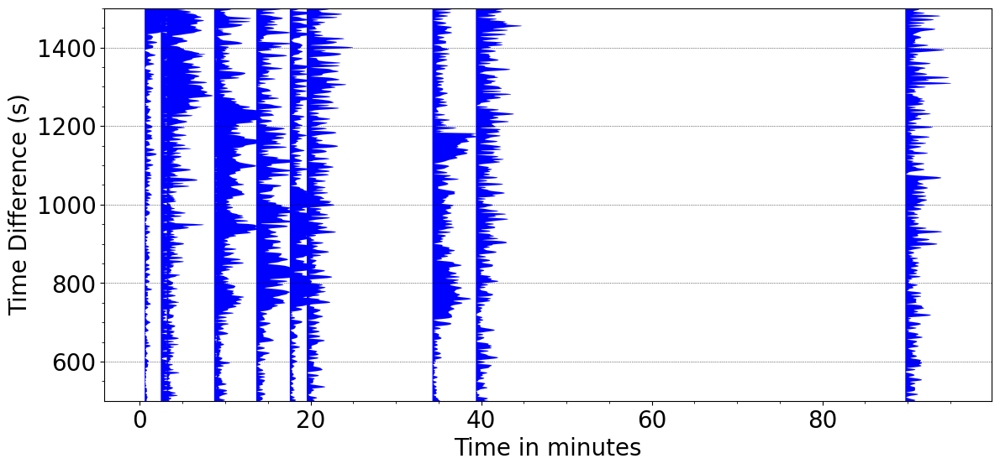

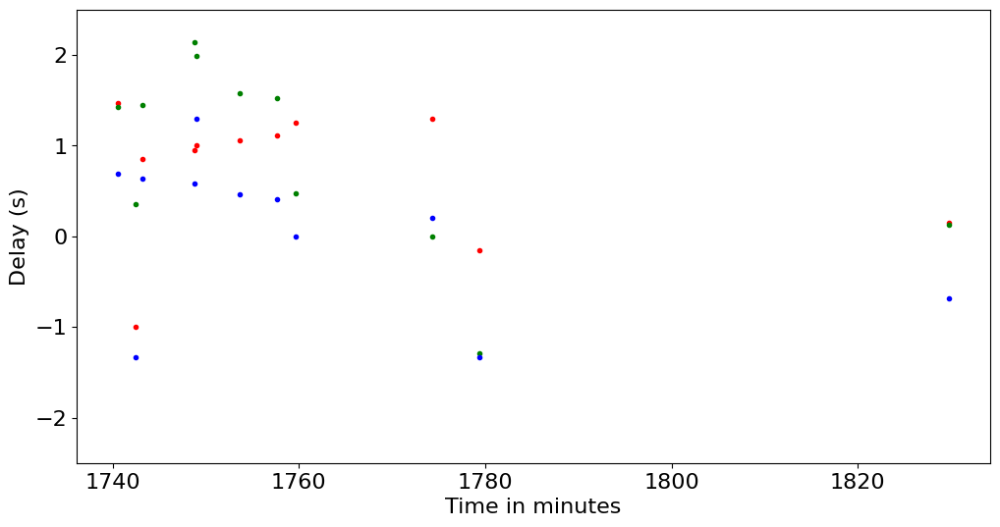

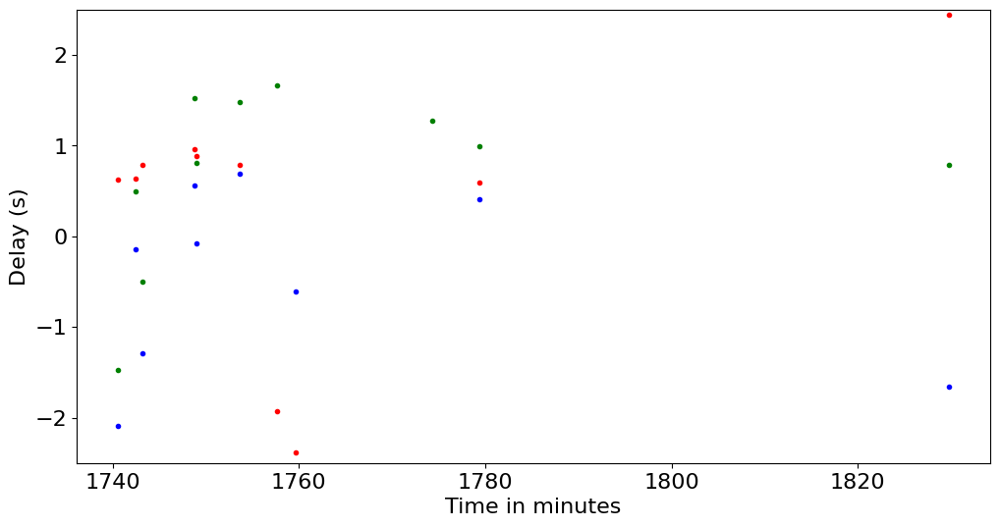

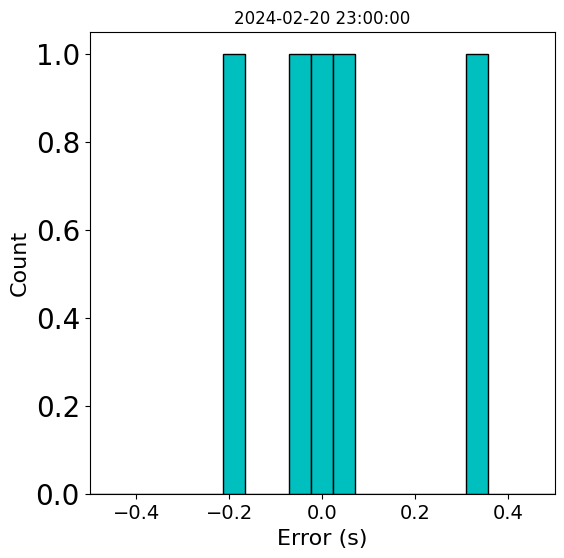

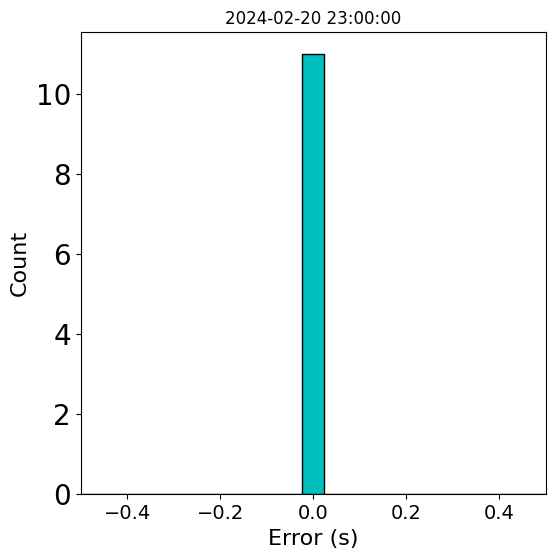

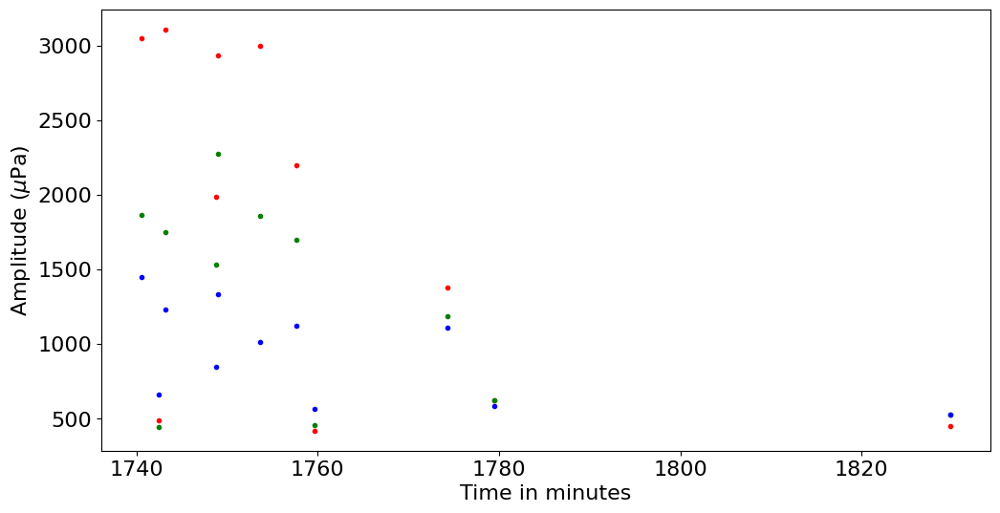

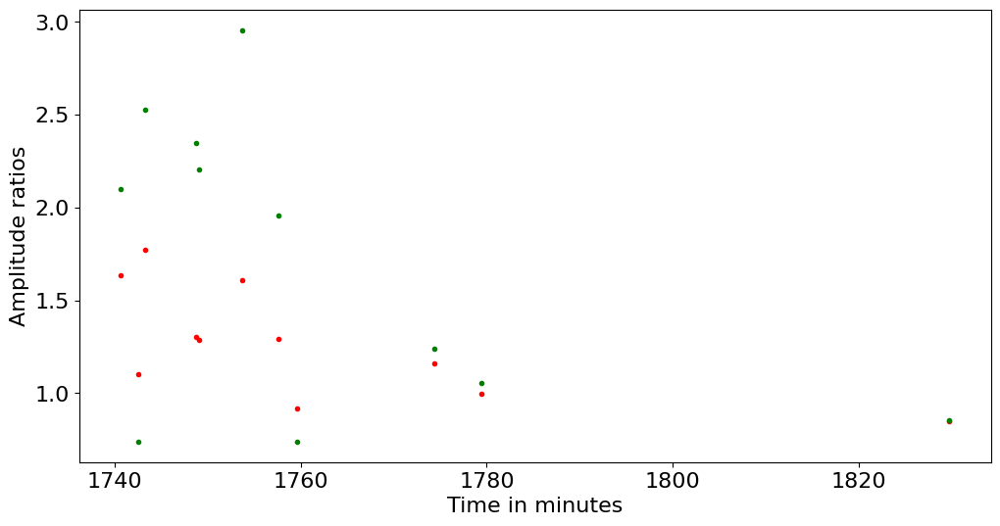

In [88]:
#
# Read from disk and process the waveforms
#
#
# Read waveform segments around individual first hydrophone picks
# on all three hydrophones
#
mincor=0.5
dT = 6
ndT = dT*250+1
picktimes = True
adjustCC = False
plotdelay="delays_"+timestring+"_"+str(Interval)+".png"
plotpdelay="pdelays_"+timestring+"_"+str(Interval)+".png"
plotamp="amps_"+timestring+"_"+str(Interval)+".png"
plotdistance="dist_"+timestring+"_"+str(Interval)+".png"
plotdistance_cor="cor_dist_"+timestring+"_"+str(Interval)+".png"
#
# Get epoch time from UTCDateTime
# Get two hours of data
#
delay12 = np.empty(0)
delay13 = np.empty(0)
delay23 = np.empty(0)
pdelay12 = np.empty(0)
pdelay13 = np.empty(0)
pdelay23 = np.empty(0)
a1 = np.empty(0)
a2 = np.empty(0)
a3 = np.empty(0)
pa1 = np.empty(0)
pa2 = np.empty(0)
pa3 = np.empty(0)
times = np.empty(0)
maxcor12 = np.empty(0)
maxcor13 = np.empty(0)
tpoints = np.empty(0)
tppoints = np.empty(0)
tseg=np.empty(ndT)
nt=0
while nt<ndT:
  tseg[nt] = nt/250.
  nt+=1
A1=np.empty(0)
A2=np.empty(0)
A3=np.empty(0)
A = np.zeros([0,2])
#print(A)
B = np.zeros(0)
C = np.zeros(2)
C[0] = 1.
C[1] = 1.
print(C)
a12=np.zeros(0)
a13=np.zeros(0)
#
k = 0
n10 = 0
maxdel = 100.
#
#
mseedfileS2="H11S2_"+timestring+"_"+str(Interval)+".mseed"
mseedfileS3="H11S3_"+timestring+"_"+str(Interval)+".mseed"
mseedfileS1="H11S1_"+timestring+"_"+str(Interval)+".mseed"
sectionfile1="section1_H11S1_"+timestring+"_"+str(Interval)+".png"
sectionfile2="section2_H11S1_"+timestring+"_"+str(Interval)+".png"
sectionfile3="section3_H11S1_"+timestring+"_"+str(Interval)+".png"
reffile1="ref1_H11S1_"+timestring+"_"+str(Interval)+".png"
reffile2="ref2_H11S1_"+timestring+"_"+str(Interval)+".png"
reffile3="ref3_H11S1_"+timestring+"_"+str(Interval)+".png"
st1 = read(path+mseedfileS1)
st2 = read(path+mseedfileS2)
st3 = read(path+mseedfileS3)
st2seg=st2
st3seg=st3
st1seg=st1
print(st2)
sta=0.1
lta=1.
env1 = flt.envelope(st1[0].detrend(type='linear').data)
env2 = flt.envelope(st2[0].detrend(type='linear').data)
env3 = flt.envelope(st3[0].detrend(type='linear').data)
dt = st1[0].stats.sampling_rate
slta1 = trg.classic_sta_lta(env1,int(sta*dt),int(lta*dt))
#st1[0].data=env1
trig1=trg.plot_trigger(st1[0],slta1,3.,2.)
on_off1 = trg.trigger_onset(slta1,3.,2.)
slta2 = trg.classic_sta_lta(env2,int(sta*dt),int(lta*dt))
trig2=trg.plot_trigger(st2[0],slta2,3.,2.)
on_off2 = trg.trigger_onset(slta2,3.,2.)
slta3 = trg.classic_sta_lta(env3,int(sta*dt),int(lta*dt))
trig3=trg.plot_trigger(st3[0],slta1,3.,2.)
on_off3 = trg.trigger_onset(slta3,3.,2.)
print("length of envelope:",len(env1))
#print(on_off1*(1./dt))
nseg = len(on_off1)
print("number of picks env1:" , nseg)
nseg2 = len(on_off2)
print("number of picks env2:" , nseg2)
nseg3 = len(on_off3)
print("number of picks env3:" , nseg3)
first = True
npick = 0
while k < nseg:
#
# Find detection on other envelope within +- 3s.
# Skip if less than three seconds after previous pick
#
  if (k > 0 and (on_off1[k][0]-on_off1[k-1][0])/dt < 3.):
    k += 1
    continue
  if (picktimes):
    yes2 = False
    yes3 = False
    for det2 in range (len(on_off2)):
      if (abs(on_off2[det2][0]-on_off1[k][0])/dt) < 3 :
        yes2 = True
        break
    for det3 in range (len(on_off3)):
      if (abs(on_off3[det3][0]-on_off1[k][0])/dt) < 3 :
        yes3 = True
        break
    if (yes2 and yes3):
      pdelay12 = np.append(pdelay12,(on_off2[det2][0]-on_off1[k][0])/dt )
      pdelay13 = np.append(pdelay13,(on_off3[det3][0]-on_off1[k][0])/dt )
      pdelay23 = np.append(pdelay23,(on_off3[det3][0]-on_off2[det2][0])/dt )
      tppoints = np.append(tppoints,(firsttime+on_off1[k][0]/dt)/60.)
      npick += 1
    else :
      k += 1
      continue
  startseg = starttime+on_off1[k][0]/dt - dT/2
  endseg = startseg+dT
  print("Time in minutes:", on_off1[k][0]/dt/60)
  w1 = flt.bandpass(st1seg[0].slice(startseg,endseg).detrend(type='linear').data, 10, 50, dt)
  w2 = flt.bandpass(st2seg[0].slice(startseg,endseg).detrend(type='linear').data, 10, 50, dt)
  w3 = flt.bandpass(st3seg[0].slice(startseg,endseg).detrend(type='linear').data, 10, 50, dt)
#  w1 = st1seg.slice(startseg,endseg)
#  w2 = st2seg.slice(startseg,endseg)
#  w3 = st3seg.slice(startseg,endseg)
  n1 = len(w1)
  n2 = len(w2)
  if (n1 != 1): exit(1)
  print ("Segment",k,"Time step:", dt, nseg, "segments")
  if (picktimes and yes2 and yes3) :
    print ("Times of pick onsets:", on_off1[k][0]/dt, on_off2[det2][0]/dt, on_off3[det3][0]/dt)
  cross12=cc.correlate(w2,w1, shift=750, demean=True,
                       normalize='naive', method='auto')
  cross13=cc.correlate(w3,w1, shift=750, demean=True,
                       normalize='naive', method='auto')
  cross23=cc.correlate(w3,w2, shift=750, demean=True,
                       normalize='naive', method='auto')
  (shift12,max12)=cc.xcorr_max(cross12,abs_max=False)
  (shift13,max13)=cc.xcorr_max(cross13,abs_max=False)
  (shift23,max23)=cc.xcorr_max(cross23,abs_max=False)
  if (first):
    trace1 = st.Trace()
    sect1=st.Stream(traces=[trace1])
    trace2 = st.Trace()
    sect2=st.Stream(traces=[trace2])
    trace3 = st.Trace()
    sect3=st.Stream(traces=[trace3])
    sect1.remove(trace1)
    sect2.remove(trace2)
    sect3.remove(trace3)
    trace1 = st.Trace()
    ref1=st.Stream(traces=[trace1])
    trace2 = st.Trace()
    ref2=st.Stream(traces=[trace2])
    trace3 = st.Trace()
    ref3=st.Stream(traces=[trace3])
    ref1.remove(trace1)
    ref2.remove(trace2)
    ref3.remove(trace3)
  if (picktimes and yes2 and yes3):
    senv1=flt.envelope(w1)
    senv2=flt.envelope(w2)
    senv3=flt.envelope(w3)
    pa1=np.append(pa1,senv1.max())
    pa2=np.append(pa2,senv2.max())
    pa3=np.append(pa3,senv3.max())
  if (not picktimes and not first
      #and (abs(shift12) < 2 or abs(shift13) < 2
      and ( max12 < mincor or max13 < mincor
      or abs(prevdelay12-shift12/dt) > maxdel or abs(prevdelay13-shift13/dt)  > maxdel)) :
    print("k=", k, "shift or maxcor too small or too large jump in delay:", shift12, shift13)
    print('% 6.2f' % max12, '% 6.2f' % max13)
    print('% 6.2f' % abs(prevdelay12-shift12/dt), '% 6.2f' % abs(prevdelay13-shift13/dt))
#    print('% 6.2f' % max13)
    k += 1
    continue
  first = False
  prevdelay12 = shift12/dt
  prevdelay13 = shift13/dt
  times = np.append(times,firsttime+on_off1[k][0]/dt)
  delay12=np.append(delay12,shift12/dt)
  delay13=np.append(delay13,shift13/dt)
  delay23=np.append(delay23,shift23/dt)
  if (adjustCC) :
    if abs(pdelay12[npick-1]-shift12/dt)  < 0.1 :
      pdelay12[npick-1] = shift12/dt
    if abs(pdelay13[npick-1]-shift13/dt)  < 0.1 :
      pdelay13[npick-1] = shift13/dt
    if abs(pdelay23[npick-1]-shift23/dt)  < 0.1 :
      pdelay23[npick-1] = shift23/dt
  max12=np.append(maxcor12,max12)
  max13=np.append(maxcor13,max13)
  tpoints=np.append(tpoints,(firsttime+on_off1[k][0]/dt)/60.)
  print ("Shift and max:",shift12/dt,max12,shift13/dt,max13)
  senv1=flt.envelope(w1)
  senv2=flt.envelope(w2)
  senv3=flt.envelope(w3)
#
  a1=np.append(a1,senv1.max())
  a2=np.append(a2,senv2.max())
  a3=np.append(a3,senv3.max())
  #
  if (senv1.max() > senv2.max() and shift12 < 0):
    print("negative delay and s1 > s2")
  if (abs(shift12) < 0.00001):
    shift12 = 0.00001
#
#    Build-up section
#
  tr = st.Trace()
  tr.data = cross12
  tr.stats.distance = (startseg - starttime)/0.06
  tr.stats.starttime = -3.
  sect2.append(tr)
#  print(sect2)

  tr = st.Trace()
  tr.data = cross13
  tr.stats.distance = (startseg-starttime)/0.06
  tr.stats.starttime = -3.
  sect1.append(tr)

  tr = st.Trace()
  tr.data = cross23
  tr.stats.distance = (startseg-starttime)/0.06
  tr.stats.starttime = -3.
  sect3.append(tr)
#
  if (picktimes) :
    tr = st.Trace()
    sw1 = np.roll(senv1, 0)
    for j in range(len(sw1)):
#      if (j > 600):
        sw1[j] *= j
    tr.data = sw1
    tr.stats.distance = (startseg - starttime)/0.06
    tr.stats.starttime = -3.
    ref1.append(tr)
  #  print(sect2)

    tr = st.Trace()
    sw2 = np.roll(senv2, int(-1*pdelay12[npick-1]*dt))
    for j in range(len(sw2)):
      sw2[j] *= j
    tr.data = sw2
    tr.stats.distance = (startseg-starttime)/0.06
    tr.stats.starttime = -3.
    ref2.append(tr)

    tr = st.Trace()
    sw3 = np.roll(senv3, int(-1*pdelay13[npick-1]*dt))
    for j in range(len(sw3)):
      sw3[j] *= j
    tr.data = sw3
    tr.stats.distance = (startseg-starttime)/0.06
    tr.stats.starttime = -3.
    ref3.append(tr)
#
#
  n10+=1
  if n10 == 10:
    print(ndT)
    fig, ax = plt.subplots(figsize=(12, 4), )
    plt.plot(tseg[0:ndT-1], w1[0:ndT-1],'r-')
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 4), )
    plt.plot(tseg[0:ndT-1], w2[0:ndT-1],'g-')
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 4), )
    plt.plot(tseg[0:ndT-1], w3[0:ndT-1],'b-')
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 4), )
    plt.plot(tseg[0:ndT-1],senv1[0:ndT-1],'r-',tseg[0:ndT-1],senv2[0:ndT-1],'g-',
              tseg[0:ndT-1],senv3[0:ndT-1],'b-')
    pstr="{num} minutes".format(num=int(on_off1[k][0]/dt/60))
    plt.title(pstr)
    plt.show()
    spectrum = np.fft.fft(w2)
    plt.plot(np.log(np.abs(spectrum)))
    plt.xlim([100,400])
    plt.show()
    ceps = np.fft.ifft(np.log(np.abs(spectrum))).real
    plt.plot(ceps)
    plt.xlim([0,500])
    plt.show()
    n10=0
  k+=1
#
#
plotDT = False
if (plotDT):
  D = 1.5
  d = 0.74
  xp = np.load(path+"xp"+"_"+timestring+"_"+str(Interval)+".npy")
  yp = np.load(path+"yp"+"_"+timestring+"_"+str(Interval)+".npy")
  zp = np.load(path+"zp"+"_"+timestring+"_"+str(Interval)+".npy")
  tp = np.load(path+"tp"+"_"+timestring+"_"+str(Interval)+".npy")
  siz = len(tp)
  s1DT = np.empty(siz)
  s2DT = np.empty(siz)
  s3DT = np.empty(siz)
  for k in range (siz):
    #
    #  Compute the difference between direct and reflect time
    #  for an ocean depth and the depths of sensors
    #
    x = (xp[k], yp[k],0.)
    pS1 = (S1[0],S1[1],0.)
    pS2 = (S2[0],S2[1],0.)
    pS3 = (S3[0],S3[1],0.)
    d1 = Norm(Diff(pS1,x))
    d2 = Norm(Diff(pS2,x))
    d3 = Norm(Diff(pS3,x))
    l1 = math.sqrt(d1*d1+d*d)
    l2 = math.sqrt(d2*d2+d*d)
    l3 = math.sqrt(d3*d3+d*d)
    L1 = math.sqrt(d1*d1+D*D)
    L2 = math.sqrt(d2*d2+D*D)
    L3 = math.sqrt(d3*d3+D*D)
    s1DT[k] = 750+250*(L1*(2-l1/L1)-l1)/hvel
    s2DT[k] = 750+250*(L2*(2-l2/L2)-l2)/hvel
    s3DT[k] = 750+250*(L3*(2-l3/L3)-l3)/hvel

sect1.plot(outfile=sectionfile1,  format = 'png' , type='section',
            color = 'red', fillcolors= ('blue','red') )
sect2.plot(outfile=sectionfile2,  format = 'png' , type='section',
            color = 'green', fillcolors= ('blue','red') )
sect3.plot(outfile=sectionfile3,  format = 'png' , type='section',
            color = 'blue', fillcolors= ('red',None) )
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
ref1.plot(outfile=reffile1, fig=fig, format = 'png' , type='section', scale=1,
       recordstart=500, recordlength= 1000,  linewidth=0.1,  color = 'red',
          fillcolors= ('red',None) )
if (plotDT):
  plt.plot(tp-tp[0],s1DT,'yo')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Time in minutes',fontsize=20)
plt.ylabel('Time Difference (s)',fontsize=20)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
ref2.plot(outfile=reffile2, fig=fig, format = 'png' , type='section',scale=1,
       recordstart=500, recordlength= 1000,  linewidth=0.1,
            color = 'g', fillcolors= ('green',None) )
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Time in minutes',fontsize=20)
plt.ylabel('Time Difference (s)',fontsize=20)
if (plotDT):
  plt.plot(tp-tp[0],s2DT,'yo')
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
ref3.plot(outfile=reffile3, fig=fig, format = 'png' , type='section',scale=1,
       recordstart=500, recordlength= 1000,  linewidth=0.1,
            color = 'b', fillcolors= ('blue',None ))
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Time in minutes',fontsize=20)
plt.ylabel('Time Difference (s)',fontsize=20)
if (plotDT):
  plt.plot(tp-tp[0],s3DT,'yo')
plt.show()
#
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(tpoints,delay12,'r.',tpoints,delay13,'g.',tpoints,delay23,'b.')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim([-2.5,2.5])
plt.xlabel('Time in minutes',fontsize=16)
plt.ylabel('Delay (s)',fontsize=16)
plt.savefig(plotdelay,format='png')
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(tppoints,pdelay12,'r.',tppoints,pdelay13,'g.',tppoints,pdelay23,'b.')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim([-2.5,2.5])
plt.xlabel('Time in minutes',fontsize=16)
plt.ylabel('Delay (s)',fontsize=16)
plt.savefig(plotpdelay,format='png')
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(6, 6),  )
lims = np.linspace(-0.5,0.5,22)
plt.hist(delay23-delay13+delay12, bins = lims, color='c', edgecolor= 'black')
plt.xticks(fontsize=14)
plt.yticks(fontsize=20)
plt.xlim([-0.5, 0.5])
plt.xlabel('Error (s)',fontsize=16)
plt.ylabel('Count',fontsize=16)
plt.title(timestring)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(6, 6),  )
plt.hist(pdelay23-pdelay13+pdelay12, bins = lims, color='c', edgecolor = 'black')
plt.xticks(fontsize=14)
plt.yticks(fontsize=20)
plt.xlim([-0.5, 0.5])
plt.xlabel('Error (s)',fontsize=16)
plt.ylabel('Count',fontsize=16)
plt.title(timestring)
plt.show()
#
# Plot amplitudes
#
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(tpoints,a1,'r.',tpoints,a2,'g.',tpoints,a3,'b.')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim([-2.5,2.5])
plt.xlabel('Time in minutes',fontsize=16)
plt.ylabel('Amplitude ($\u03BC$Pa)',fontsize=16)
plt.savefig(plotamp,format='png')
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(tppoints)):
  plt.plot(tppoints[k],pa1[k]/pa2[k],'r.',tppoints[k],pa1[k]/pa3[k],'g.')
#plt.plot(tppoints,pa1,'r.',tppoints,pa2,'g.',tppoints,pa3,'b.')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim([-2.5,2.5])
plt.xlabel('Time in minutes',fontsize=16)
plt.ylabel('Amplitude ratios',fontsize=16)
plt.savefig(plotamp,format='png')
plt.show()
if (picktimes):
  np.save(path+"delay12"+"_"+timestring+"_"+str(Interval),pdelay12)
  np.save(path+"delay13"+"_"+timestring+"_"+str(Interval),pdelay13)
  np.save(path+"delay23"+"_"+timestring+"_"+str(Interval),pdelay23)
  np.save(path+"times"+"_"+timestring+"_"+str(Interval),tppoints)
  np.save(path+"tp"+"_"+timestring+"_"+str(Interval),tppoints)
  np.save(path+"amp1"+"_"+timestring+"_"+str(Interval),pa1)
  np.save(path+"amp2"+"_"+timestring+"_"+str(Interval),pa2)
  np.save(path+"amp3"+"_"+timestring+"_"+str(Interval),pa3)
else:
  np.save(path+"delay12"+"_"+timestring+"_"+str(Interval),delay12)
  np.save(path+"delay13"+"_"+timestring+"_"+str(Interval),delay13)
  np.save(path+"delay23"+"_"+timestring+"_"+str(Interval),delay23)
  np.save(path+"times"+"_"+timestring+"_"+str(Interval),tpoints)
  np.save(path+"tp"+"_"+timestring+"_"+str(Interval),tppoints)
  np.save(path+"amp1"+"_"+timestring+"_"+str(Interval),a1)
  np.save(path+"amp2"+"_"+timestring+"_"+str(Interval),a2)
  np.save(path+"amp3"+"_"+timestring+"_"+str(Interval),a3)
#


# New Section

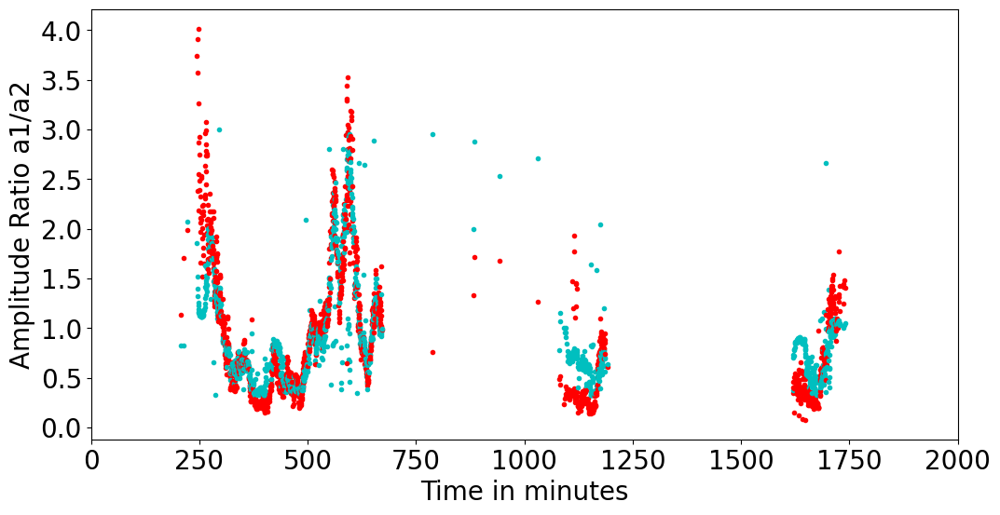

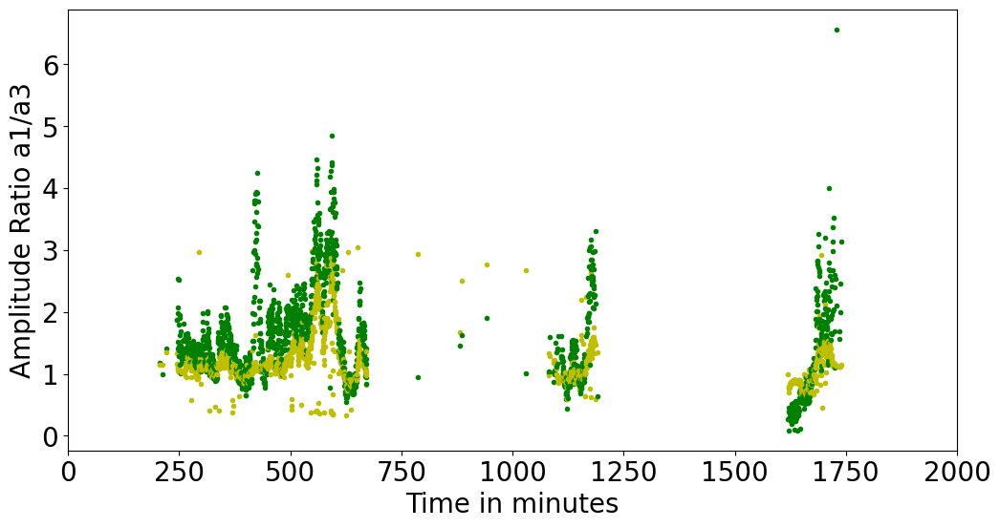

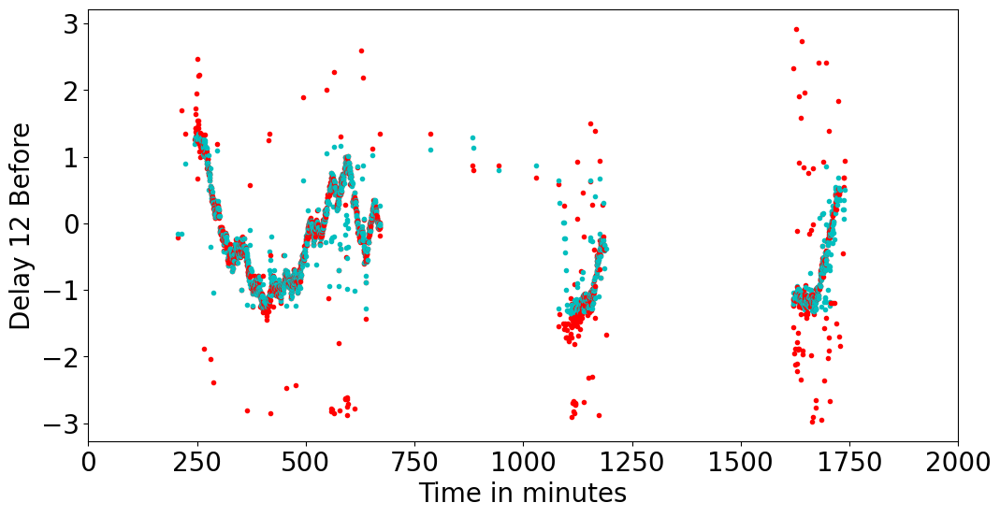

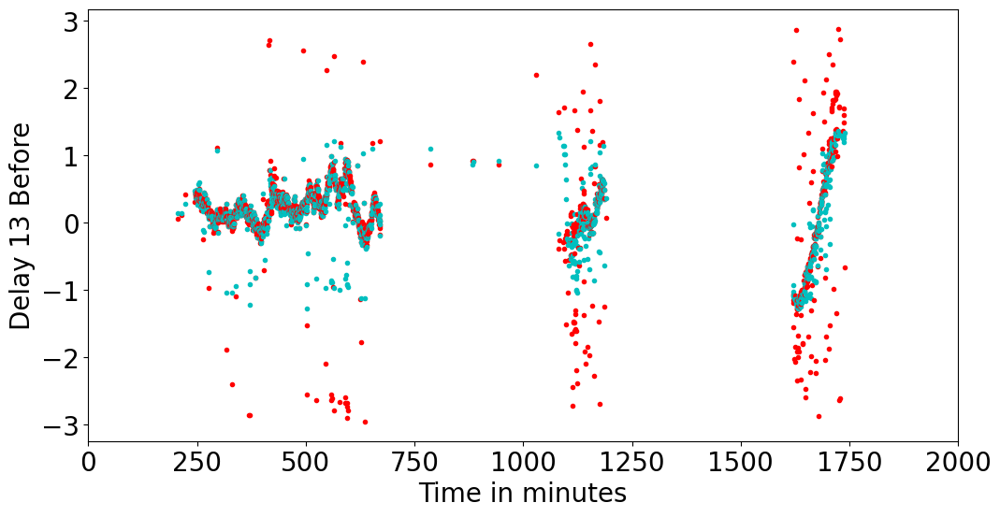

1209 (21762,) (2418,)
Norm of residuals before inversion: 1.6489974169797685
Optimum: [-0.03860137 -0.1748476   0.5        -0.07167359 -0.43325813 -0.05926705
 -0.40204262 -0.42238469  0.27005559]
Cost: 279.2250645372769
Active mask: [0 0 1 0 0 0 0 0 0]
9 Iterations
Norm of residuals after inversion: 1.492600666246046
Norm of residuals after inversion: 1.492600666246046


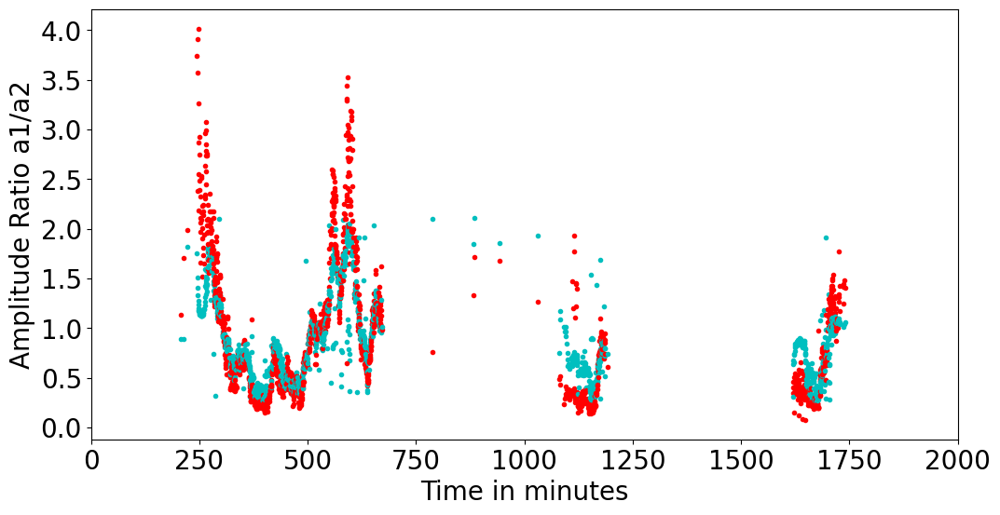

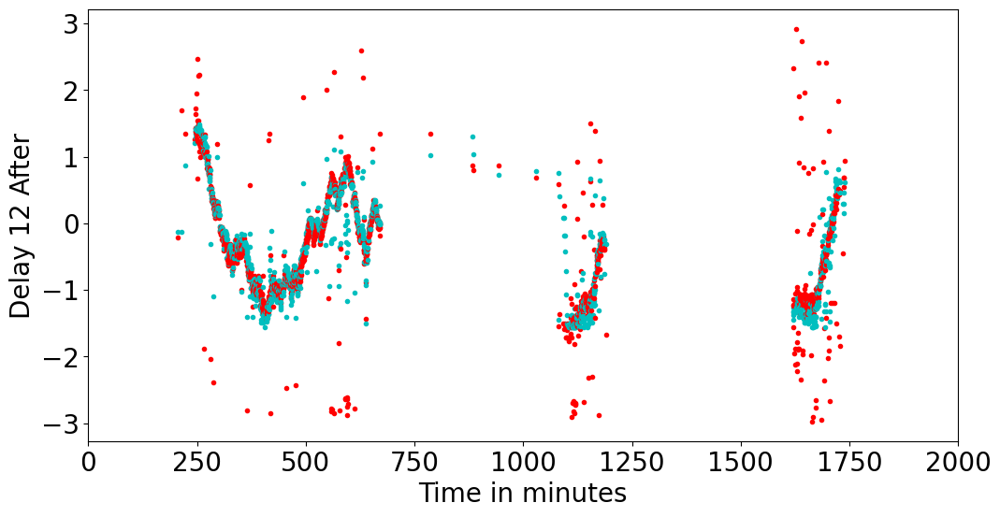

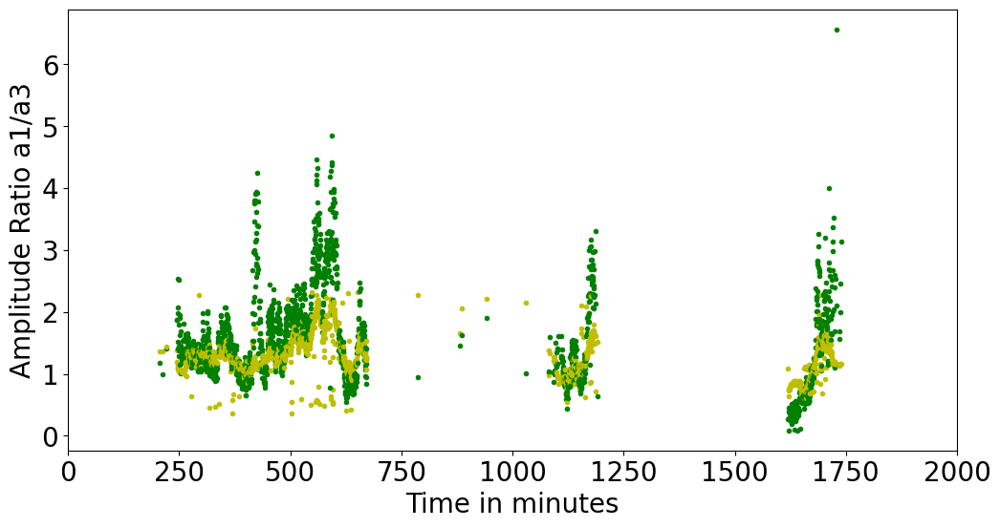

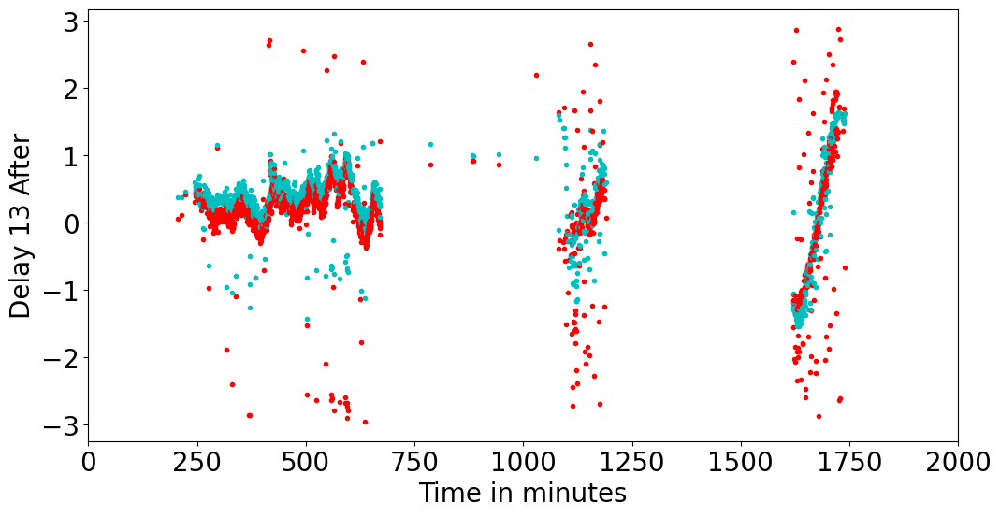

In [9]:
#
# Code to compute corrections to hydrophone locations based on residuals of
# amplitude ratios.
# Not tested yet
#
#
#
delay12 = np.load(path+"delay12"+"_"+timestring+"_"+str(Interval)+".npy")
delay13 = np.load(path+"delay13"+"_"+timestring+"_"+str(Interval)+".npy")
amp1 = np.load(path+"amp1"+"_"+timestring+"_"+str(Interval)+".npy")
amp2 = np.load(path+"amp2"+"_"+timestring+"_"+str(Interval)+".npy")
amp3 = np.load(path+"amp3"+"_"+timestring+"_"+str(Interval)+".npy")
times = np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
apvel = np.load(path+"apvel"+"_"+timestring+"_"+str(Interval)+".npy")
xp = np.load(path+"xp"+"_"+timestring+"_"+str(Interval)+".npy")
yp = np.load(path+"yp"+"_"+timestring+"_"+str(Interval)+".npy")
zp = np.load(path+"zp"+"_"+timestring+"_"+str(Interval)+".npy")
#
# Prepare matrix A and vector b (residuals)
# to solve the least-squares problem
# Ax=b
# for x
#
wdepth = 0.2
m=0
minang = 20.
b = np.empty(0)
indp = np.empty(0)
lb = np.ones(9)
ub = np.ones(9)
x0 = np.ones(9)

for j in range(3):
  lb[3*j] = -1
  lb[3*j+1] = -1
  lb[3*j+2] = -0.5
  x0[3*j] = 0.
  x0[3*j+1] = 0.
  x0[3*j+2] = 0.
#
  ub[3*j] = 1
  ub[3*j+1] = 1
  ub[3*j+2] = 0.5
#
# Adjust depth
#
#for k in range (len(times)):
#    zp[k] += wdepth
#
# Adjust S3
#
#S3 = (-1.75, -1.75, 0.25)
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(times)):
    x = (xp[k], yp[k],zp[k])
    d1 = Norm(Diff(S1,x))
    d2 = Norm(Diff(S2,x))
    plt.plot(times[k], amp1[k]/amp2[k], 'r.', times[k], d2/d1, 'c.' )
plt.ylabel('Amplitude Ratio a1/a2', fontsize=20)
plt.xlabel('Time in minutes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0,2000 ])
plt.show()
#
#
#
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(times)):
    x = (xp[k], yp[k],zp[k])
    d1 = Norm(Diff(S1,x))
    d3 = Norm(Diff(S3,x))
    plt.plot(times[k], amp1[k]/amp3[k], 'g.', times[k], d3/d1, 'y.' )
plt.ylabel('Amplitude Ratio a1/a3', fontsize=20)
plt.xlabel('Time in minutes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0,2000 ])
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(times)):
    x = (xp[k], yp[k],zp[k])
    d12 = (Norm(Diff(S2,x))-Norm(Diff(S1,x)))/hvel
    plt.plot(times[k], delay12[k], 'r.', times[k], d12, 'c.' )
plt.ylabel('Delay 12 Before', fontsize=20)
plt.xlabel('Time in minutes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0,2000 ])
plt.show()
#
#
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(times)):
    x = (xp[k], yp[k],zp[k])
    d13 = (Norm(Diff(S3,x))-Norm(Diff(S1,x)))/hvel
    plt.plot(times[k], delay13[k], 'r.', times[k], d13, 'c.' )
plt.ylabel('Delay 13 Before', fontsize=20)
plt.xlabel('Time in minutes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0,2000])
plt.show()
#
#
#
siz=len(xp)-1
for k in range(siz):
  if(apvel[k] > minang):
    a1 = amp1[k]
    a2 = amp2[k]
    a3 = amp3[k]
    x = (xp[k], yp[k],zp[k])
    d1 = Norm(Diff(S1,x))
    d2 = Norm(Diff(S2,x))
    d3 = Norm(Diff(S3,x))
    b = np.append(b,a1/a2-d2/d1)
    b = np.append(b,a1/a3-d3/d1)
    indp = np.append(indp,k)
    m += 1
#
#
#
# dimension and fill Matrix A
#
#
A = np.empty(0)
for k in range(m):
    ki = int(indp[k])
    x = (xp[ki], yp[ki],zp[ki])
    d1 = Norm(Diff(S1,x))
    d2 = Norm(Diff(S2,x))
    d3 = Norm(Diff(S3,x))
    a1 = amp1[ki]
    a2 = amp2[ki]
    a3 = amp3[ki]
    A = np.append(A, d2*(xp[ki]-S1[0])/d1/d1)
    A = np.append(A, d2*(yp[ki]-S1[1])/d1/d1)
    A = np.append(A, d2*(zp[ki]-S1[2])/d1/d1)
    A = np.append(A, -1.*(xp[ki]-S2[0])/d1)
    A = np.append(A, -1.*(yp[ki]-S2[1])/d1)
    A = np.append(A, -1.*(zp[ki]-S2[2])/d1)
    A = np.append(A, 0.)
    A = np.append(A, 0.)
    A = np.append(A, 0.)
    A = np.append(A, d3*(xp[ki]-S1[0])/d1/d1)
    A = np.append(A, d3*(yp[ki]-S1[1])/d1/d1)
    A = np.append(A, d3*(zp[ki]-S1[2])/d1/d1)
    A = np.append(A, 0.)
    A = np.append(A, 0.)
    A = np.append(A, 0.)
    A = np.append(A, -1.*(xp[ki]-S3[0])/d1)
    A = np.append(A, -1.*(yp[ki]-S3[1])/d1)
    A = np.append(A, -1.*(zp[ki]-S3[2])/d1)
#
# Solve the least-squares problem
#
print(m,np.shape(A),np.shape(b))
A = A.reshape(m*2,9)
print("Norm of residuals before inversion:", Norm(Diff(b,np.matmul(A,x0))))
X = opt.lsq_linear(A,b, bounds=(lb, ub))
print("Optimum:", X.x)
print("Cost:", X.cost)
print("Active mask:", X.active_mask)
print(X.nit,"Iterations")
print("Norm of residuals after inversion:", Norm(X.fun))
print("Norm of residuals after inversion:", Norm(Diff(b,np.matmul(A,X.x))))
#
Delta_S = np.empty(0)
Delta_S = np.append(Delta_S,X.x[0])
Delta_S = np.append(Delta_S,X.x[1])
Delta_S = np.append(Delta_S,X.x[2])
Delta_S = np.append(Delta_S,X.x[3])
Delta_S = np.append(Delta_S,X.x[4])
Delta_S = np.append(Delta_S,X.x[5])
Delta_S = np.append(Delta_S,X.x[6])
Delta_S = np.append(Delta_S,X.x[7])
Delta_S = np.append(Delta_S,X.x[8])
np.save(path+"Delta_S"+"_"+timestring+"_"+str(Interval),Delta_S)

#
DS1 = (S1[0]+Delta_S[0],S1[1]+Delta_S[1],S1[2]+Delta_S[2])
DS2 = (S2[0]+Delta_S[3],S2[1]+Delta_S[4],S2[2]+Delta_S[5])
DS3 = (S3[0]+Delta_S[6],S3[1]+Delta_S[7],S3[2]+Delta_S[8])
#
#
#
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(times)):
    x = (xp[k], yp[k],zp[k])
    d1 = Norm(Diff(DS1,x))
    d2 = Norm(Diff(DS2,x))
    plt.plot(times[k], amp1[k]/amp2[k], 'r.', times[k], d2/d1, 'c.' )
plt.ylabel('Amplitude Ratio a1/a2', fontsize=20)
plt.xlabel('Time in minutes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0,2000 ])
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(times)):
    x = (xp[k], yp[k],zp[k])
    d12 = (Norm(Diff(DS2,x))-Norm(Diff(DS1,x)))/hvel
    plt.plot(times[k], delay12[k], 'r.', times[k], d12, 'c.' )
plt.ylabel('Delay 12 After', fontsize=20)
plt.xlabel('Time in minutes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0,2000 ])
plt.show()
#
#
#
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(times)):
    x = (xp[k], yp[k],zp[k])
    d1 = Norm(Diff(DS1,x))
    d3 = Norm(Diff(DS3,x))
    plt.plot(times[k], amp1[k]/amp3[k], 'g.', times[k], d3/d1, 'y.' )
plt.ylabel('Amplitude Ratio a1/a3', fontsize=20)
plt.xlabel('Time in minutes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0,2000 ])
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
for k in range (len(times)):
    x = (xp[k], yp[k],zp[k])
    d13 = (Norm(Diff(DS3,x))-Norm(Diff(DS1,x)))/hvel
    plt.plot(times[k], delay13[k], 'r.', times[k], d13, 'c.' )
plt.ylabel('Delay 13 After', fontsize=20)
plt.xlabel('Time in minutes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0,2000 ])
plt.show()

sampling rate and segments 250.0 1920.0
Time in minutes: 0.041666666666666664
Time in minutes: 0.08333333333333333
Time in minutes: 0.125
Time in minutes: 0.16666666666666666
Time in minutes: 0.20833333333333334
Time in minutes: 0.25
Time in minutes: 0.2916666666666667
Time in minutes: 0.3333333333333333
Time in minutes: 0.375
Time in minutes: 0.4166666666666667
Time in minutes: 0.4583333333333333
Time in minutes: 0.5
Time in minutes: 0.5416666666666666
Time in minutes: 0.5833333333333334
Time in minutes: 0.625
Time in minutes: 0.6666666666666666
Time in minutes: 0.7083333333333334
Time in minutes: 0.75
Time in minutes: 0.7916666666666666
Time in minutes: 0.8333333333333334
Time in minutes: 0.875
Time in minutes: 0.9166666666666666
Time in minutes: 0.9583333333333334
Time in minutes: 1.0
Time in minutes: 1.0416666666666667
Time in minutes: 1.0833333333333333
Time in minutes: 1.125
Time in minutes: 1.1666666666666667
Time in minutes: 1.2083333333333333
Time in minutes: 1.25
Time in minu

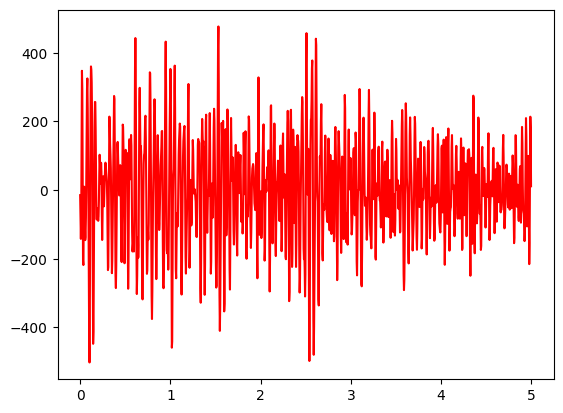

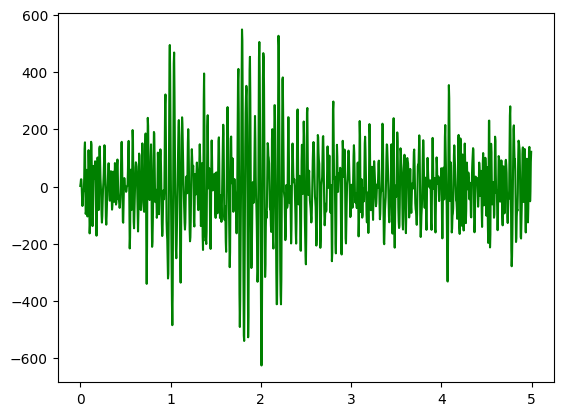

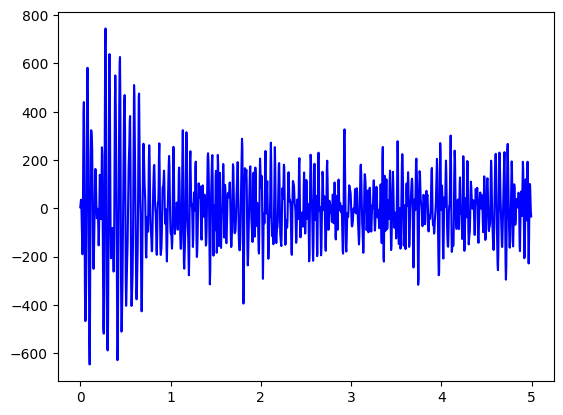

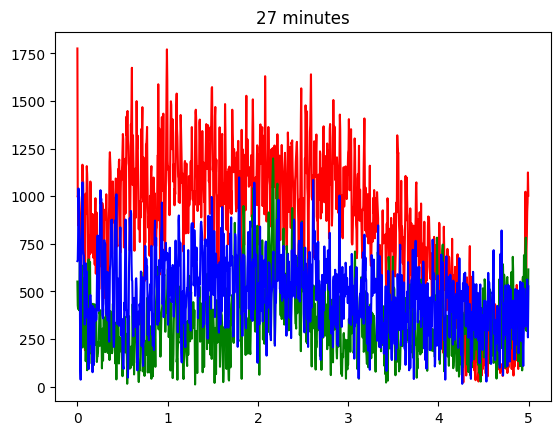

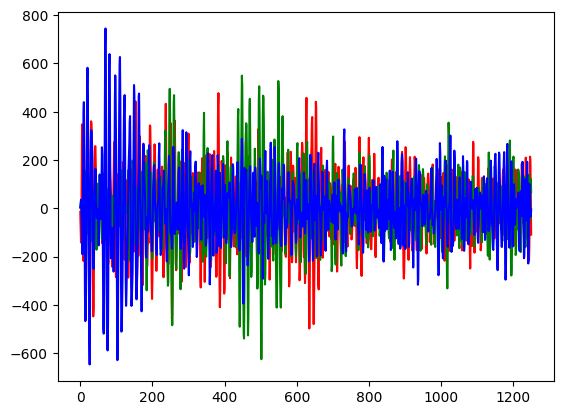

Time in minutes: 27.375
Time in minutes: 27.416666666666668
Time in minutes: 27.458333333333332
Time in minutes: 27.5
Time in minutes: 27.541666666666668
Time in minutes: 27.583333333333332
Time in minutes: 27.625
Maxima of CC: 0.23140082085613137 0.32612360359800513 0.2628910314845398
Time in minutes: 27.666666666666668
Time in minutes: 27.708333333333332
Time in minutes: 27.75
Time in minutes: 27.791666666666668
Time in minutes: 27.833333333333332
Time in minutes: 27.875
Time in minutes: 27.916666666666668
Maxima of CC: 0.18781994223373402 0.3157421471393603 0.2631378606163555
Time in minutes: 27.958333333333332
Maxima of CC: 0.22819461619703882 0.24581652392188266 0.3254922524523705
Time in minutes: 28.0
Time in minutes: 28.041666666666668
Time in minutes: 28.083333333333332
Time in minutes: 28.125
Time in minutes: 28.166666666666668
Time in minutes: 28.208333333333332
Time in minutes: 28.25
Time in minutes: 28.291666666666668
Time in minutes: 28.333333333333332
Time in minutes: 28.

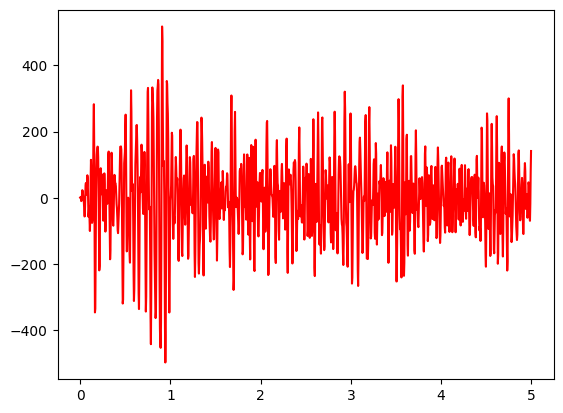

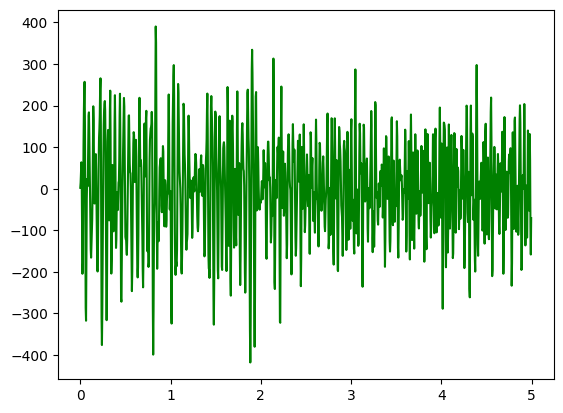

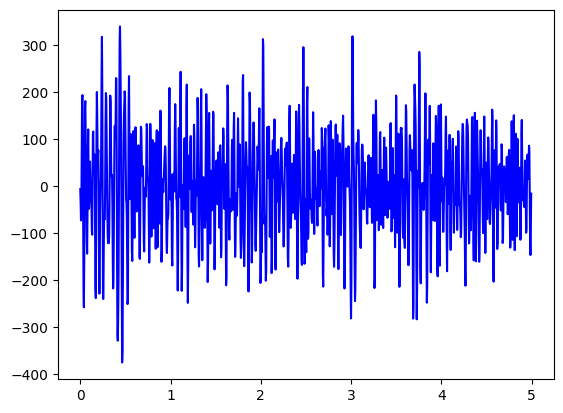

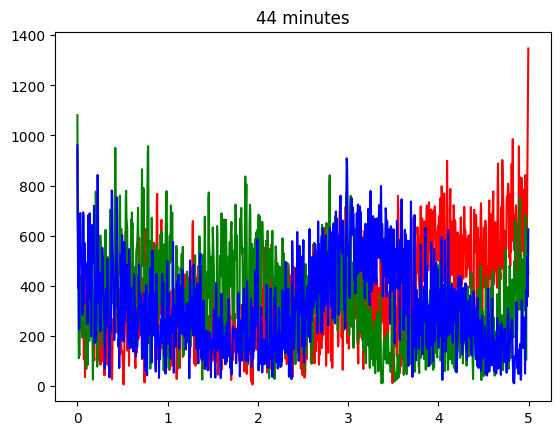

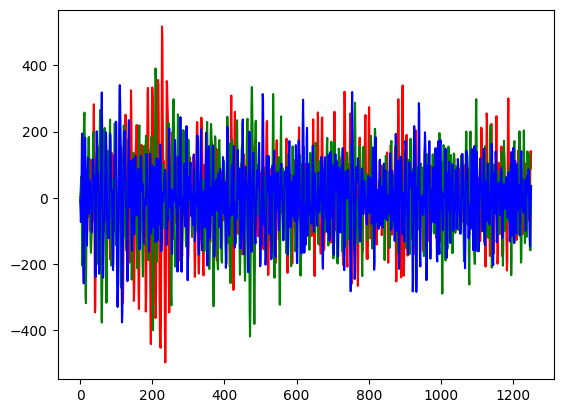

Time in minutes: 45.0
Time in minutes: 45.041666666666664
Time in minutes: 45.083333333333336
Time in minutes: 45.125
Time in minutes: 45.166666666666664
Maxima of CC: 0.4360839875497091 0.38872120139596145 0.3094117354173306
Time in minutes: 45.208333333333336
Maxima of CC: 0.40687187072143416 0.293362302293141 0.25509490053690503
Time in minutes: 45.25
Time in minutes: 45.291666666666664
Time in minutes: 45.333333333333336
Time in minutes: 45.375
Time in minutes: 45.416666666666664
Time in minutes: 45.458333333333336
Time in minutes: 45.5
Time in minutes: 45.541666666666664
Time in minutes: 45.583333333333336
Time in minutes: 45.625
Time in minutes: 45.666666666666664
Time in minutes: 45.708333333333336
Time in minutes: 45.75
Time in minutes: 45.791666666666664
Time in minutes: 45.833333333333336
Maxima of CC: 0.399427077603348 0.309457568634367 0.29097957645911277
Time in minutes: 45.875
Time in minutes: 45.916666666666664
Time in minutes: 45.958333333333336
Time in minutes: 46.0
Ti

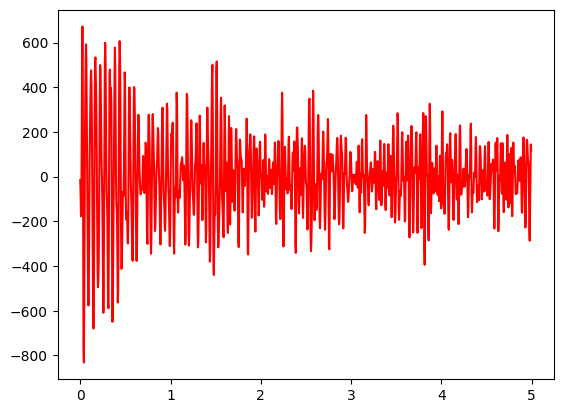

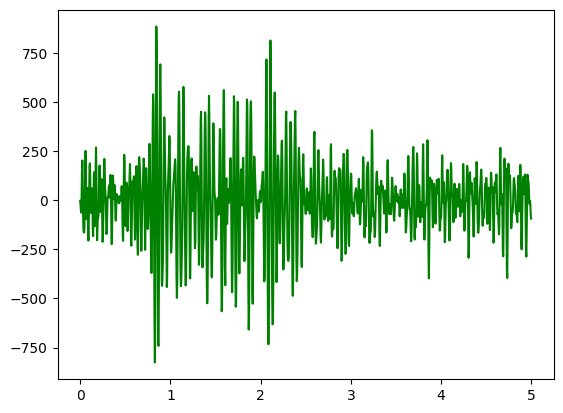

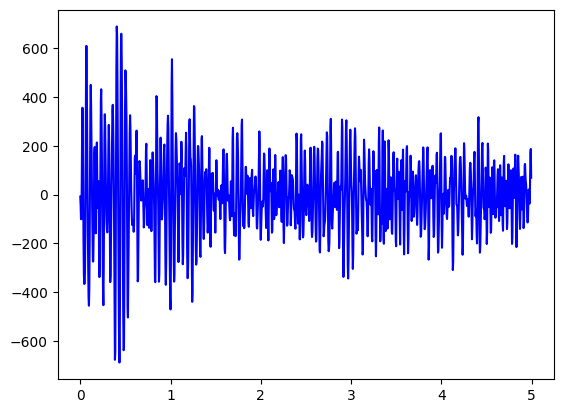

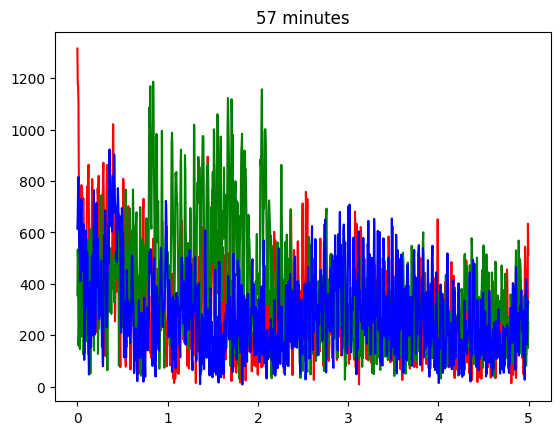

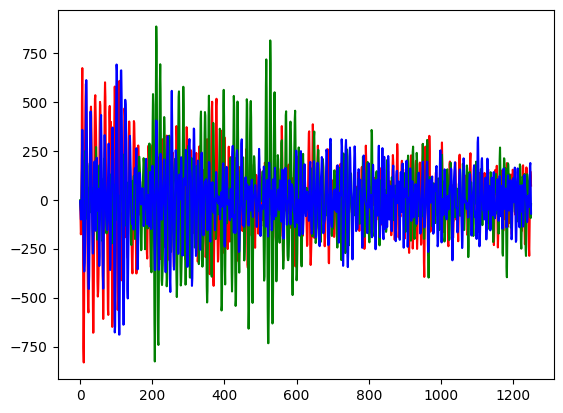

Time in minutes: 57.083333333333336
Time in minutes: 57.125
Time in minutes: 57.166666666666664
Time in minutes: 57.208333333333336
Time in minutes: 57.25
Time in minutes: 57.291666666666664
Time in minutes: 57.333333333333336
Time in minutes: 57.375
Time in minutes: 57.416666666666664
Time in minutes: 57.458333333333336
Time in minutes: 57.5
Time in minutes: 57.541666666666664
Time in minutes: 57.583333333333336
Time in minutes: 57.625
Maxima of CC: 0.3548416304963808 0.23196876231443972 0.29785309924979325
Time in minutes: 57.666666666666664
Maxima of CC: 0.2651208927262809 0.22162234377776727 0.31861296688657714
Time in minutes: 57.708333333333336
Time in minutes: 57.75
Time in minutes: 57.791666666666664
Time in minutes: 57.833333333333336
Time in minutes: 57.875
Time in minutes: 57.916666666666664
Time in minutes: 57.958333333333336
Time in minutes: 58.0
Time in minutes: 58.041666666666664
Maxima of CC: 0.3173006711822044 0.3300139062370621 0.32233319688688694
Time in minutes: 58.

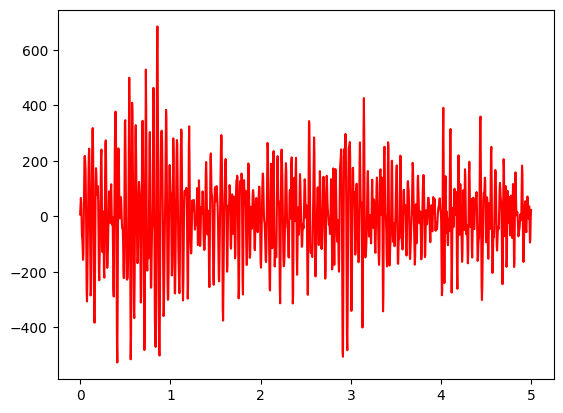

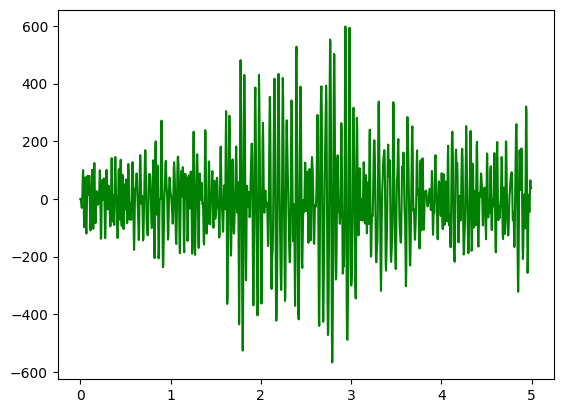

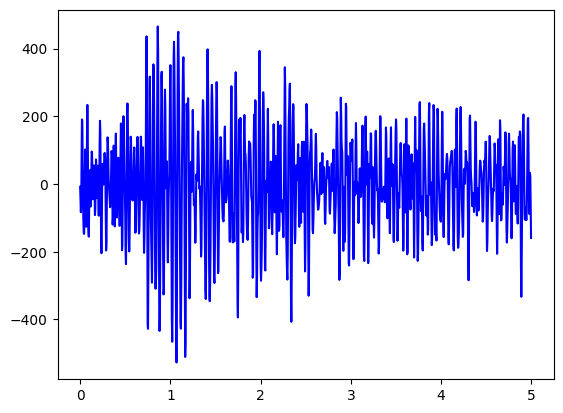

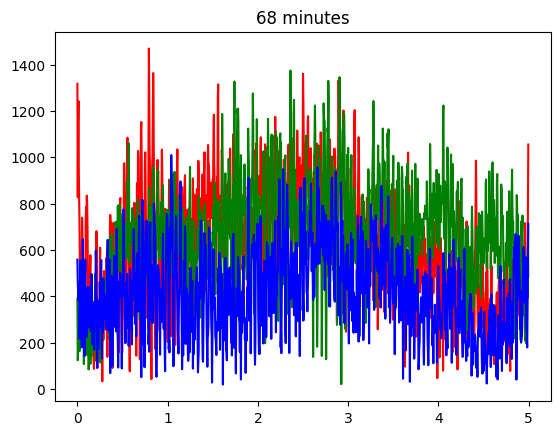

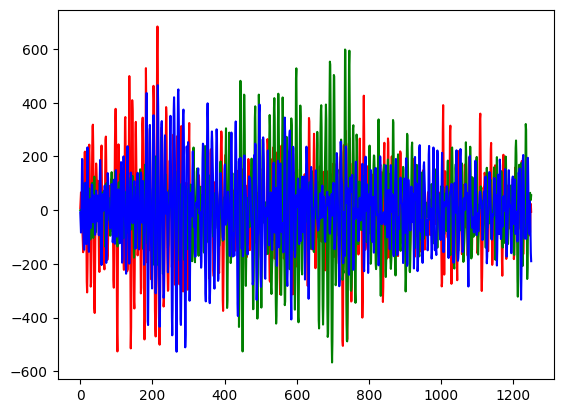

Time in minutes: 68.04166666666667
Time in minutes: 68.08333333333333
Time in minutes: 68.125
Time in minutes: 68.16666666666667
Time in minutes: 68.20833333333333
Time in minutes: 68.25
Time in minutes: 68.29166666666667
Time in minutes: 68.33333333333333
Time in minutes: 68.375
Time in minutes: 68.41666666666667
Time in minutes: 68.45833333333333
Time in minutes: 68.5
Time in minutes: 68.54166666666667
Time in minutes: 68.58333333333333
Time in minutes: 68.625
Time in minutes: 68.66666666666667
Time in minutes: 68.70833333333333
Time in minutes: 68.75
Time in minutes: 68.79166666666667
Time in minutes: 68.83333333333333
Time in minutes: 68.875
Time in minutes: 68.91666666666667
Time in minutes: 68.95833333333333
Time in minutes: 69.0
Time in minutes: 69.04166666666667
Time in minutes: 69.08333333333333
Time in minutes: 69.125
Time in minutes: 69.16666666666667
Time in minutes: 69.20833333333333
Time in minutes: 69.25
Maxima of CC: 0.3229664393866092 0.2721243668358354 0.2585195285847

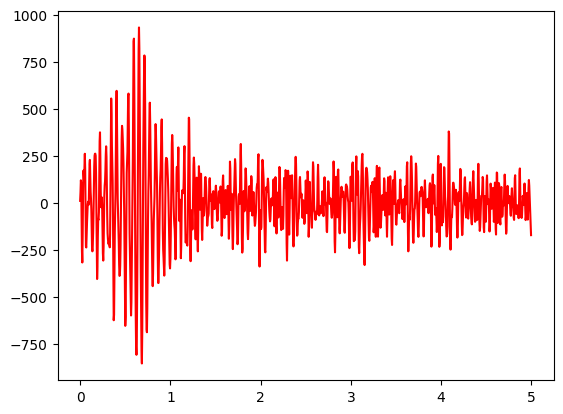

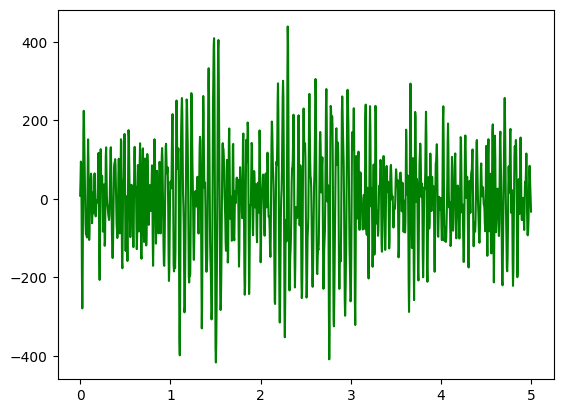

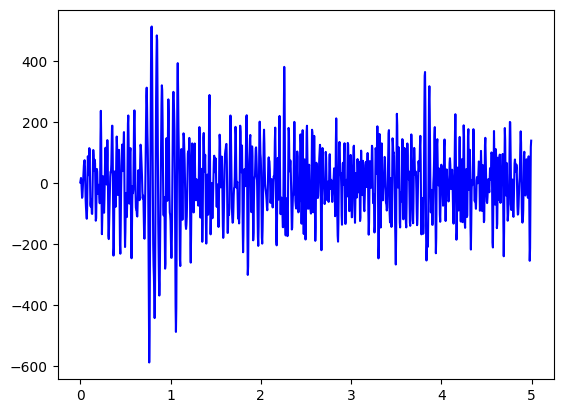

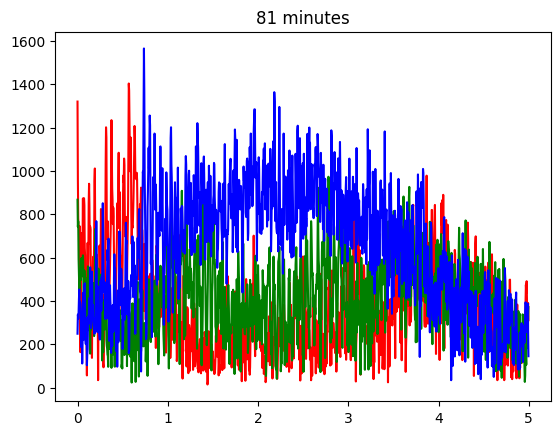

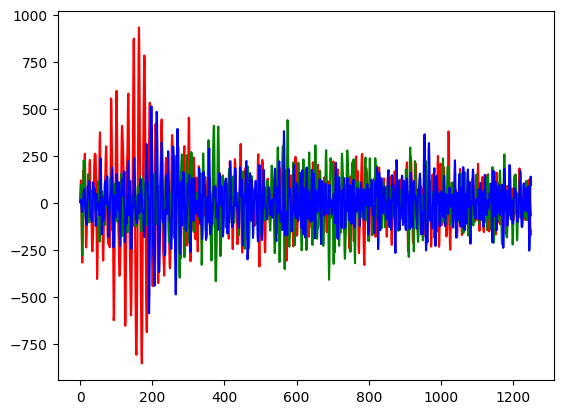

Time in minutes: 81.875
Time in minutes: 81.91666666666667
Time in minutes: 81.95833333333333
Time in minutes: 82.0
Time in minutes: 82.04166666666667
Time in minutes: 82.08333333333333
Maxima of CC: 0.2989931120099246 0.3153499320587723 0.2475856038823507
Time in minutes: 82.125
Time in minutes: 82.16666666666667
Time in minutes: 82.20833333333333
Time in minutes: 82.25
Time in minutes: 82.29166666666667
Time in minutes: 82.33333333333333
Time in minutes: 82.375
Time in minutes: 82.41666666666667
Time in minutes: 82.45833333333333
Time in minutes: 82.5
Time in minutes: 82.54166666666667
Maxima of CC: 0.2623142021726772 0.300142189089234 0.2149509229335398
Time in minutes: 82.58333333333333
Time in minutes: 82.625
Time in minutes: 82.66666666666667
Time in minutes: 82.70833333333333
Time in minutes: 82.75
Time in minutes: 82.79166666666667
Time in minutes: 82.83333333333333
Time in minutes: 82.875
Time in minutes: 82.91666666666667
Time in minutes: 82.95833333333333
Time in minutes: 83

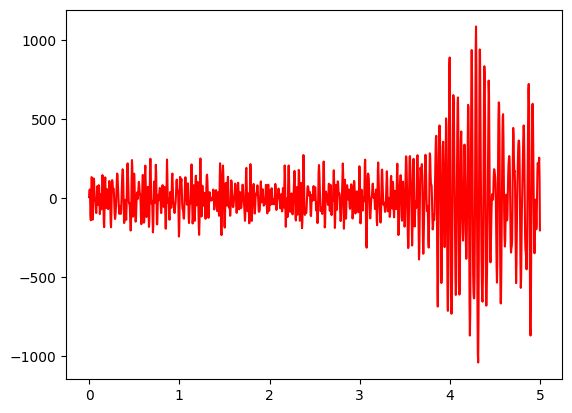

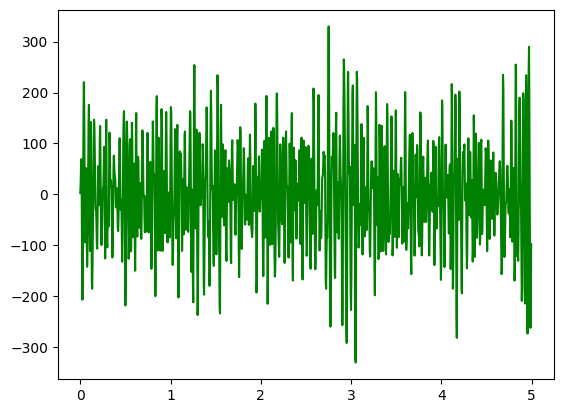

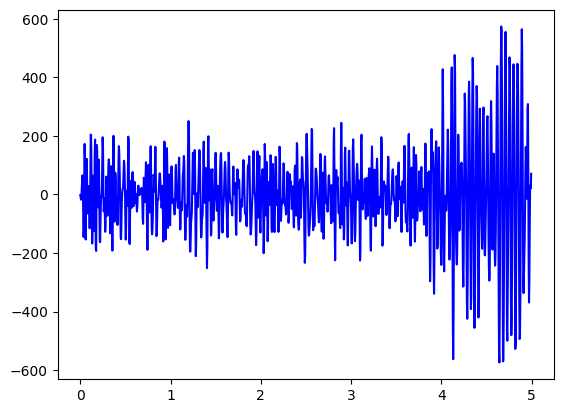

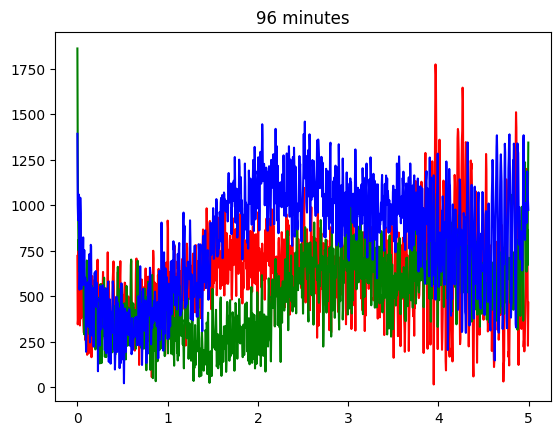

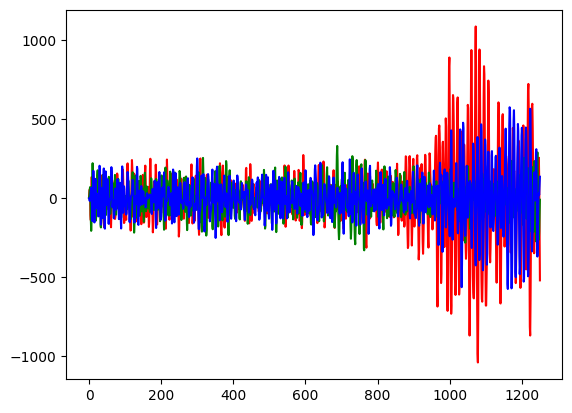

Time in minutes: 96.58333333333333
Maxima of CC: 0.3299539771053192 0.31403158676892284 0.2714851588864245
Time in minutes: 96.625
Time in minutes: 96.66666666666667
Time in minutes: 96.70833333333333
Time in minutes: 96.75
Time in minutes: 96.79166666666667
Time in minutes: 96.83333333333333
Time in minutes: 96.875
Time in minutes: 96.91666666666667
Maxima of CC: 0.30416232017847283 0.265816288520649 0.279562539402152
Time in minutes: 96.95833333333333
Time in minutes: 97.0
Time in minutes: 97.04166666666667
Time in minutes: 97.08333333333333
Time in minutes: 97.125
Time in minutes: 97.16666666666667
Time in minutes: 97.20833333333333
Maxima of CC: 0.2871164801893638 0.3891211244949164 0.30085698865675004
Time in minutes: 97.25
Maxima of CC: 0.2816787233404423 0.3424433505749347 0.29600898532968634
Time in minutes: 97.29166666666667
Time in minutes: 97.33333333333333
Maxima of CC: 0.22895978191128338 0.18553882388092652 0.3571340738862018
Time in minutes: 97.375
Time in minutes: 97.41

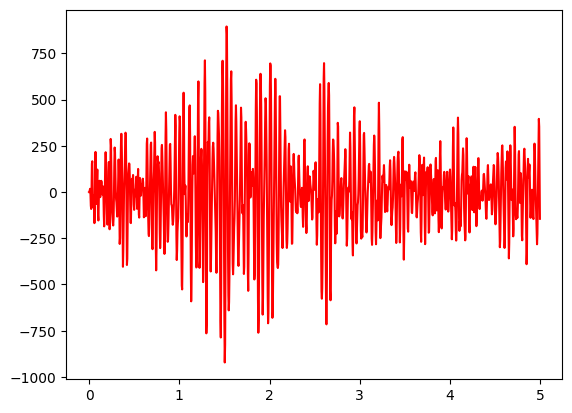

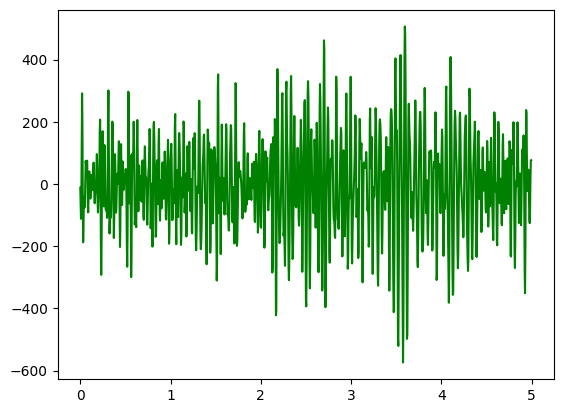

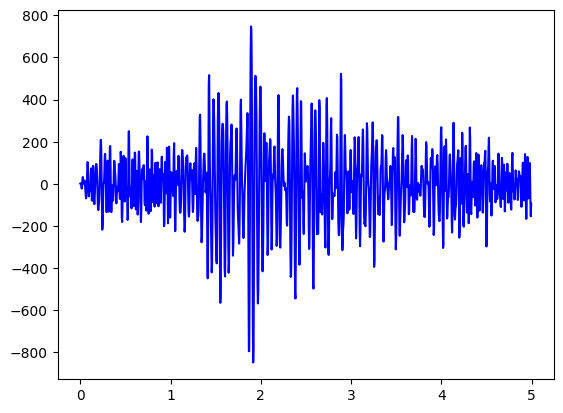

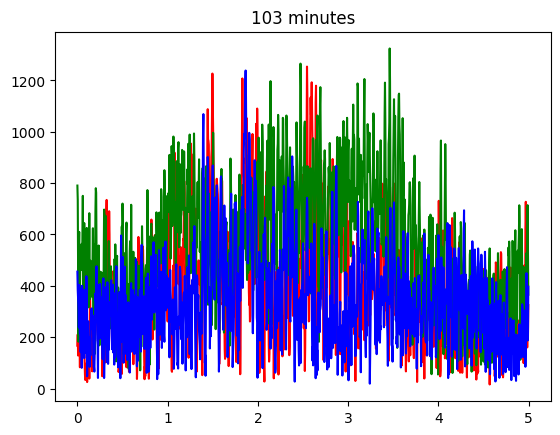

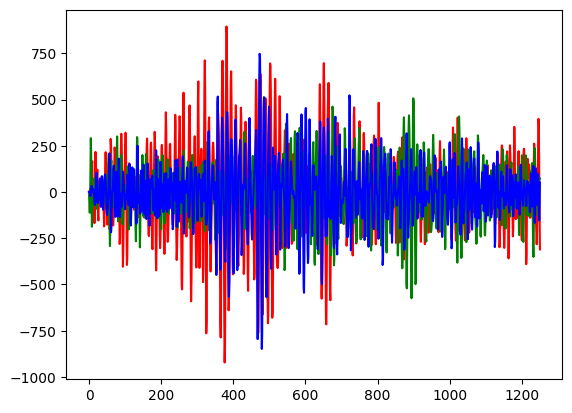

Time in minutes: 103.75
Time in minutes: 103.79166666666667
Time in minutes: 103.83333333333333
Time in minutes: 103.875
Time in minutes: 103.91666666666667
Time in minutes: 103.95833333333333
Time in minutes: 104.0
Time in minutes: 104.04166666666667
Maxima of CC: 0.27557133558700175 0.35108685530734973 0.2109684848093404
Time in minutes: 104.08333333333333
Maxima of CC: 0.27626568011076197 0.3623841618877625 0.2425681641147499
Time in minutes: 104.125
Time in minutes: 104.16666666666667
Time in minutes: 104.20833333333333
Time in minutes: 104.25
Time in minutes: 104.29166666666667
Time in minutes: 104.33333333333333
Maxima of CC: 0.2237084299475275 0.3697873175120759 0.23708752120827203
Time in minutes: 104.375
Maxima of CC: 0.2423489997585553 0.355752304090349 0.33694631587921864
Time in minutes: 104.41666666666667
Time in minutes: 104.45833333333333
Time in minutes: 104.5
Time in minutes: 104.54166666666667
Time in minutes: 104.58333333333333
Time in minutes: 104.625
Time in minute

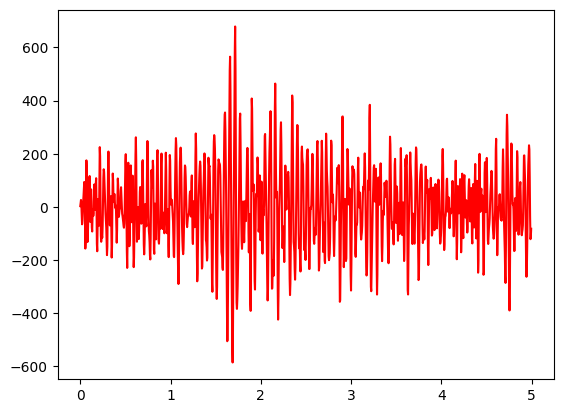

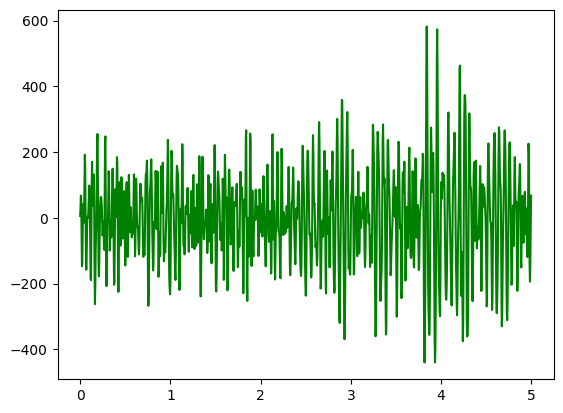

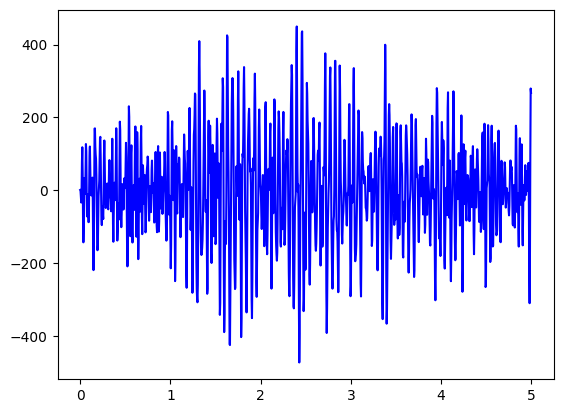

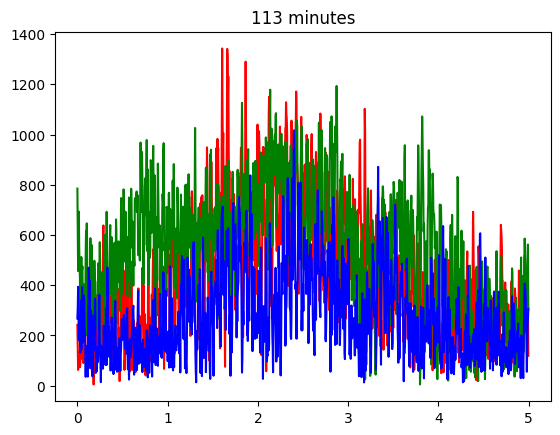

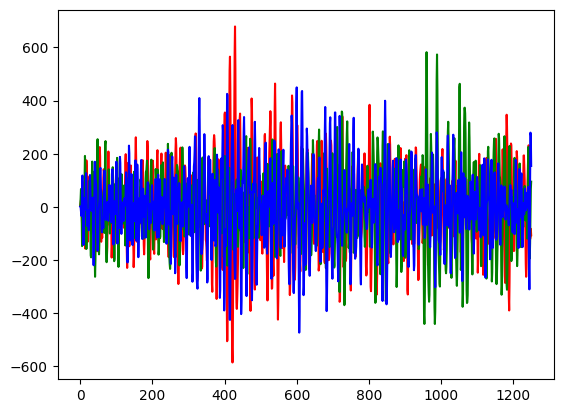

Time in minutes: 113.875
Time in minutes: 113.91666666666667
Time in minutes: 113.95833333333333
Time in minutes: 114.0
Time in minutes: 114.04166666666667
Time in minutes: 114.08333333333333
Time in minutes: 114.125
Maxima of CC: 0.3888058911217725 0.25880022352257415 0.30220701952899576
Time in minutes: 114.16666666666667
Time in minutes: 114.20833333333333
Time in minutes: 114.25
Time in minutes: 114.29166666666667
Time in minutes: 114.33333333333333
Time in minutes: 114.375
Time in minutes: 114.41666666666667
Time in minutes: 114.45833333333333
Time in minutes: 114.5
Time in minutes: 114.54166666666667
Time in minutes: 114.58333333333333
Time in minutes: 114.625
Time in minutes: 114.66666666666667
Time in minutes: 114.70833333333333
Time in minutes: 114.75
Maxima of CC: 0.22804210831067945 0.17756844620937817 0.3083878194443016
Time in minutes: 114.79166666666667
Time in minutes: 114.83333333333333
Time in minutes: 114.875
Time in minutes: 114.91666666666667
Time in minutes: 114.95

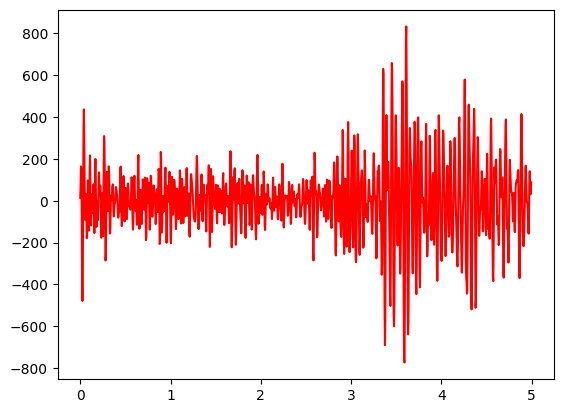

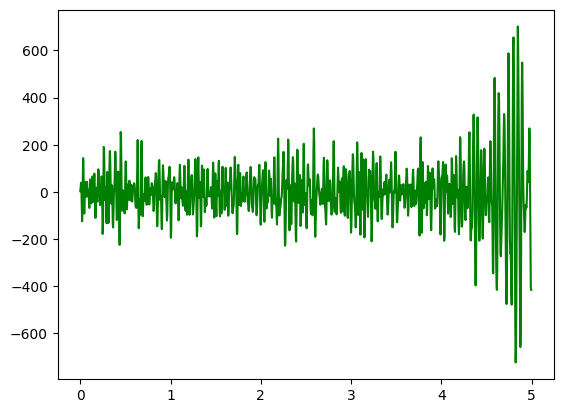

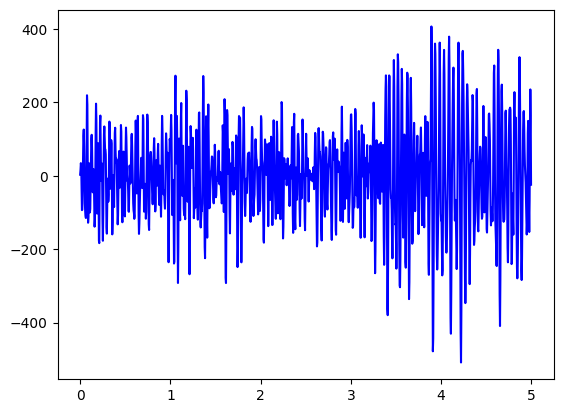

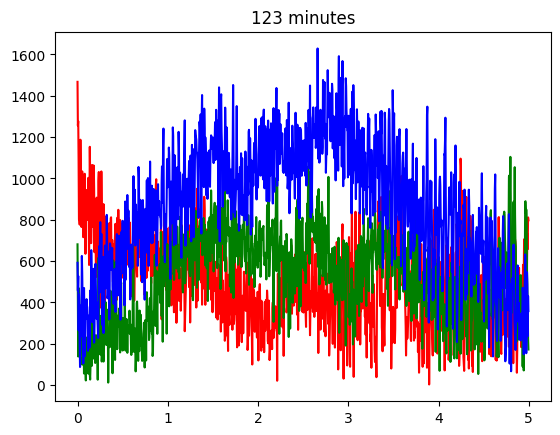

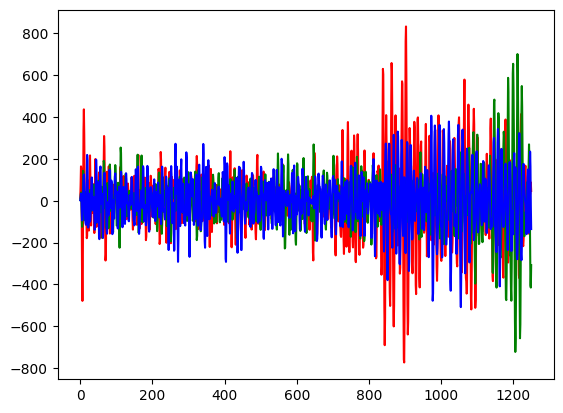

Time in minutes: 123.5
Time in minutes: 123.54166666666667
Time in minutes: 123.58333333333333
Time in minutes: 123.625
Time in minutes: 123.66666666666667
Time in minutes: 123.70833333333333
Time in minutes: 123.75
Time in minutes: 123.79166666666667
Time in minutes: 123.83333333333333
Maxima of CC: 0.3277844458705891 0.2271611560491165 0.24605503178571683
Time in minutes: 123.875
Time in minutes: 123.91666666666667
Time in minutes: 123.95833333333333
Time in minutes: 124.0
Time in minutes: 124.04166666666667
Time in minutes: 124.08333333333333
Time in minutes: 124.125
Time in minutes: 124.16666666666667
Time in minutes: 124.20833333333333
Time in minutes: 124.25
Time in minutes: 124.29166666666667
Time in minutes: 124.33333333333333
Time in minutes: 124.375
Time in minutes: 124.41666666666667
Time in minutes: 124.45833333333333
Time in minutes: 124.5
Time in minutes: 124.54166666666667
Maxima of CC: 0.3526075290932894 0.2629241446767604 0.27347925795642486
Time in minutes: 124.583333

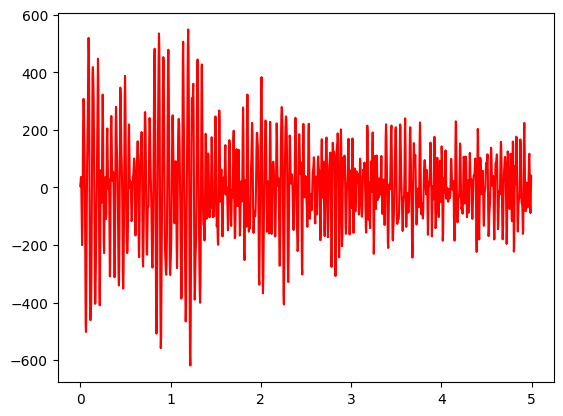

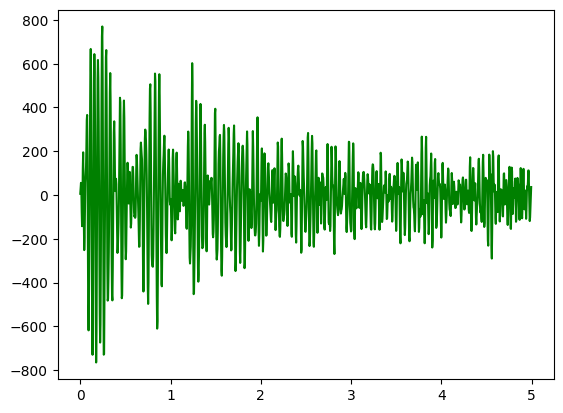

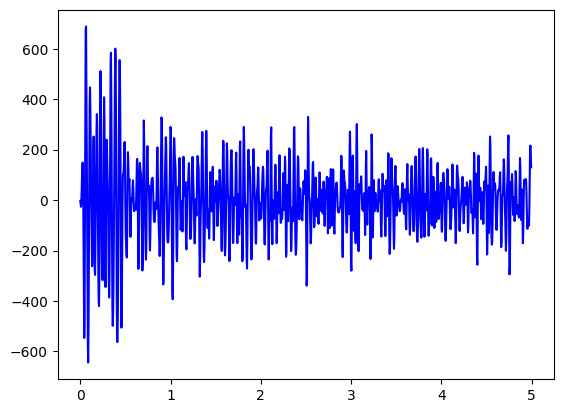

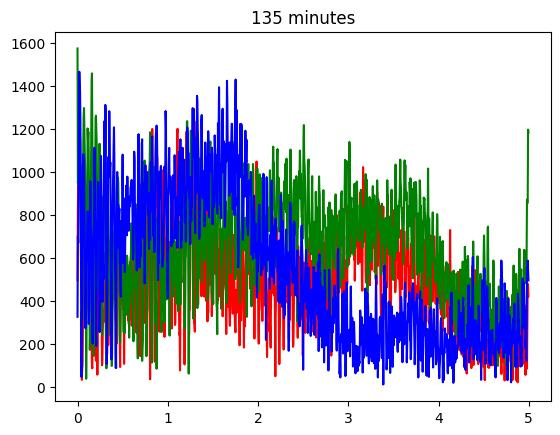

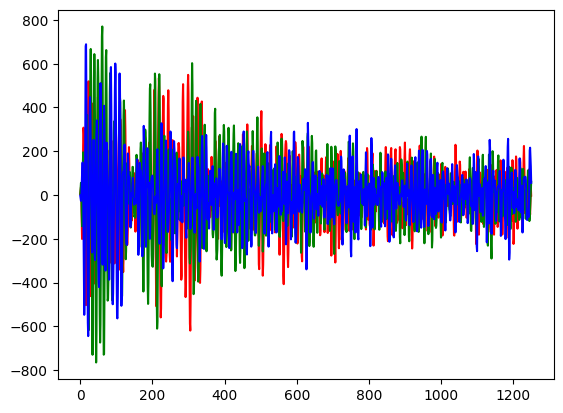

Time in minutes: 135.41666666666666
Time in minutes: 135.45833333333334
Time in minutes: 135.5
Time in minutes: 135.54166666666666
Time in minutes: 135.58333333333334
Time in minutes: 135.625
Time in minutes: 135.66666666666666
Time in minutes: 135.70833333333334
Maxima of CC: 0.3172161622352114 0.24118010561953454 0.24852816832516933
Time in minutes: 135.75
Time in minutes: 135.79166666666666
Time in minutes: 135.83333333333334
Time in minutes: 135.875
Time in minutes: 135.91666666666666
Time in minutes: 135.95833333333334
Maxima of CC: 0.36643292998007443 0.32048037051475525 0.3477138284580642
Time in minutes: 136.0
Maxima of CC: 0.31005951086140104 0.2933835026388199 0.3027969111126358
Time in minutes: 136.04166666666666
Time in minutes: 136.08333333333334
Time in minutes: 136.125
Time in minutes: 136.16666666666666
Time in minutes: 136.20833333333334
Time in minutes: 136.25
Time in minutes: 136.29166666666666
Time in minutes: 136.33333333333334
Maxima of CC: 0.267678828240678 0.322

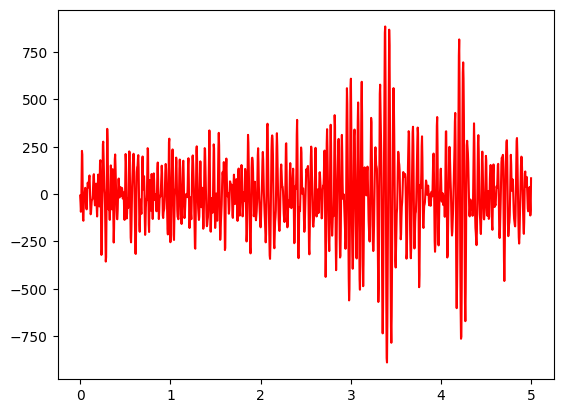

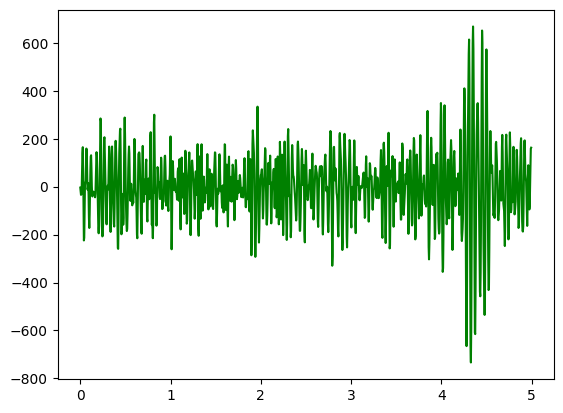

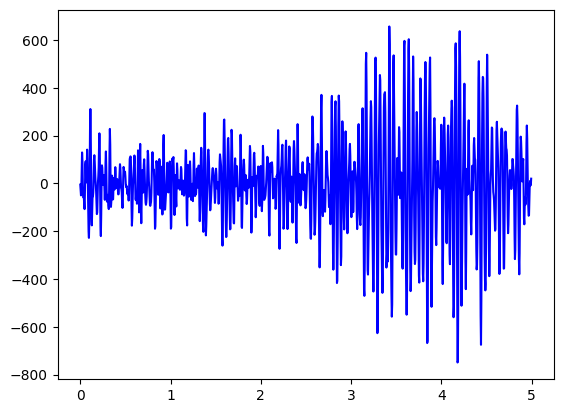

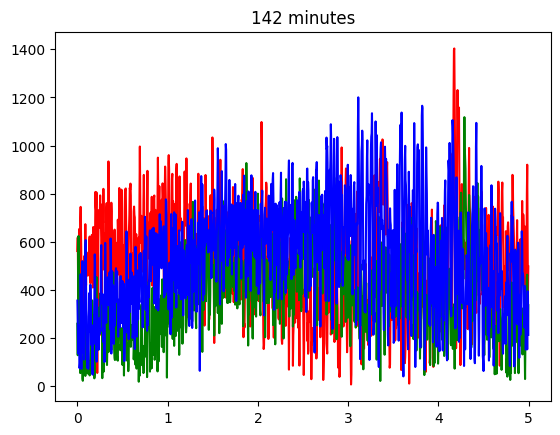

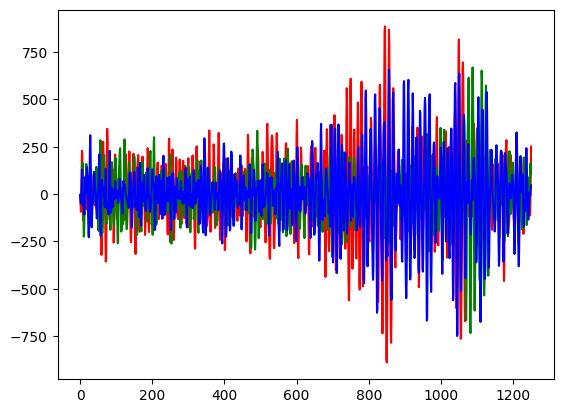

Time in minutes: 142.95833333333334
Maxima of CC: 0.2801667563169161 0.3869528931679522 0.2916511828422635
Time in minutes: 143.0
Time in minutes: 143.04166666666666
Time in minutes: 143.08333333333334
Time in minutes: 143.125
Time in minutes: 143.16666666666666
Time in minutes: 143.20833333333334
Time in minutes: 143.25
Time in minutes: 143.29166666666666
Maxima of CC: 0.20654060877692584 0.32663993169578553 0.277187691670043
Time in minutes: 143.33333333333334
Maxima of CC: 0.2676807630685968 0.3107824250384867 0.26267057258683296
Time in minutes: 143.375
Time in minutes: 143.41666666666666
Time in minutes: 143.45833333333334
Time in minutes: 143.5
Time in minutes: 143.54166666666666
Time in minutes: 143.58333333333334
Maxima of CC: 0.3880382918730601 0.3336457203679644 0.2926678893210653
Time in minutes: 143.625
Maxima of CC: 0.3291923200784548 0.31360998465312406 0.297614027548429
Time in minutes: 143.66666666666666
Time in minutes: 143.70833333333334
Time in minutes: 143.75
Time i

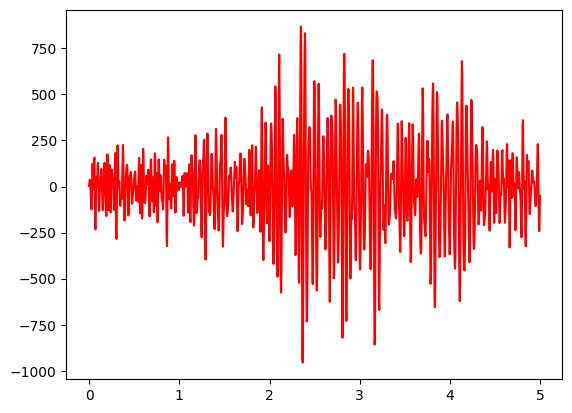

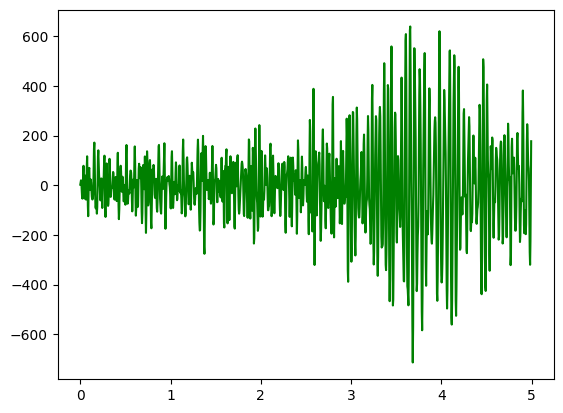

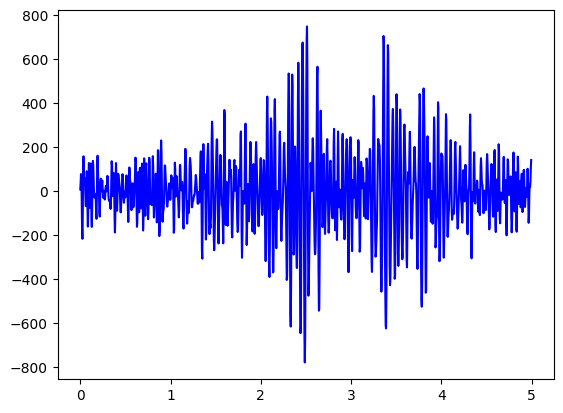

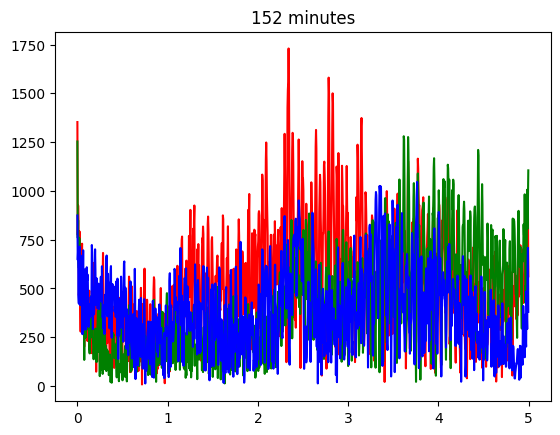

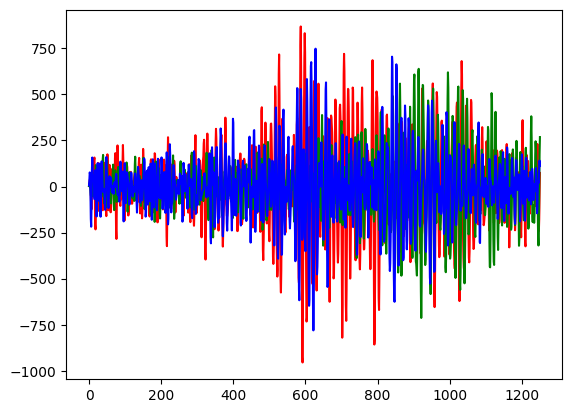

Time in minutes: 152.625
Time in minutes: 152.66666666666666
Time in minutes: 152.70833333333334
Time in minutes: 152.75
Time in minutes: 152.79166666666666
Time in minutes: 152.83333333333334
Time in minutes: 152.875
Time in minutes: 152.91666666666666
Time in minutes: 152.95833333333334
Time in minutes: 153.0
Time in minutes: 153.04166666666666
Time in minutes: 153.08333333333334
Time in minutes: 153.125
Time in minutes: 153.16666666666666
Time in minutes: 153.20833333333334
Time in minutes: 153.25
Maxima of CC: 0.3265161687493948 0.22115060306873377 0.2187953331140219
Time in minutes: 153.29166666666666
Maxima of CC: 0.34651356777751285 0.22394712014150953 0.26023927069420105
Time in minutes: 153.33333333333334
Time in minutes: 153.375
Time in minutes: 153.41666666666666
Time in minutes: 153.45833333333334
Time in minutes: 153.5
Time in minutes: 153.54166666666666
Time in minutes: 153.58333333333334
Maxima of CC: 0.39237716346008816 0.431551469645923 0.31622630791399675
Time in minu

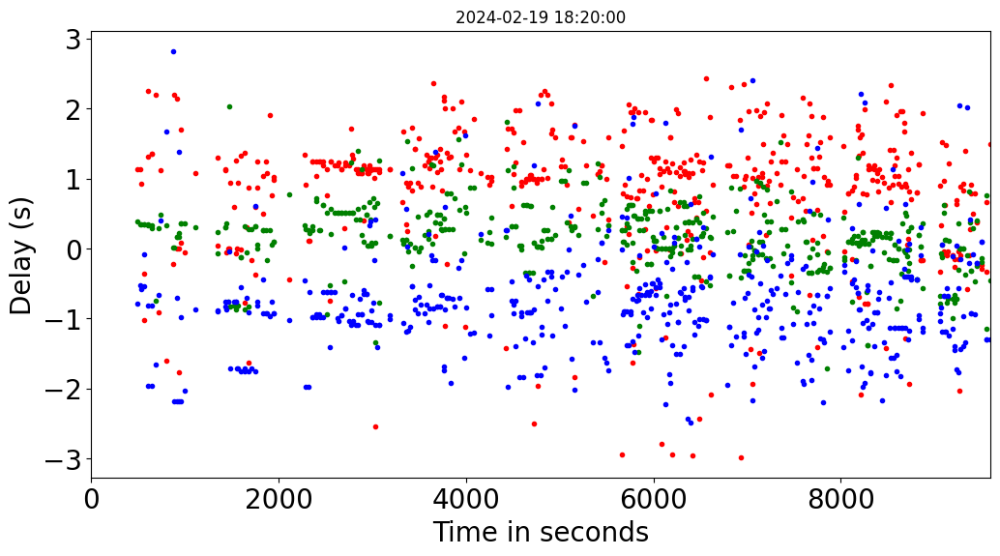

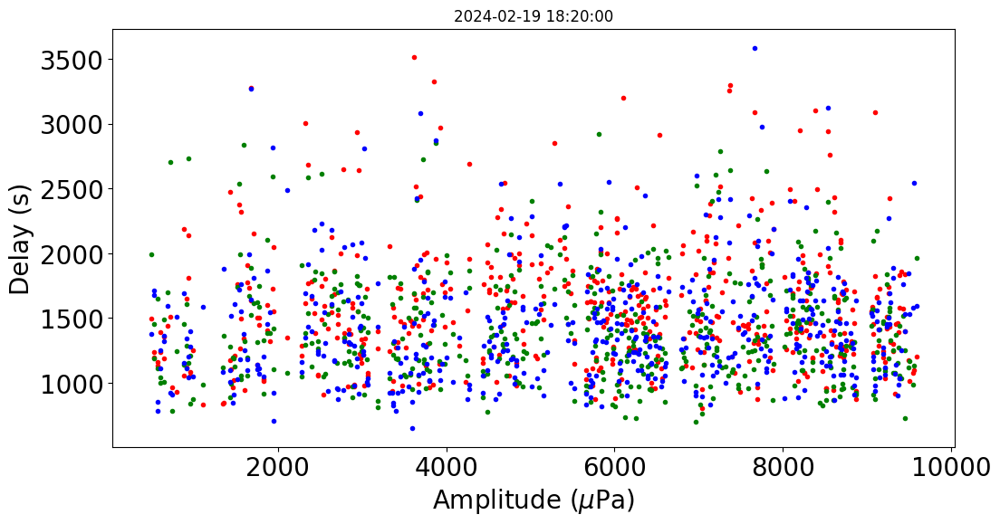

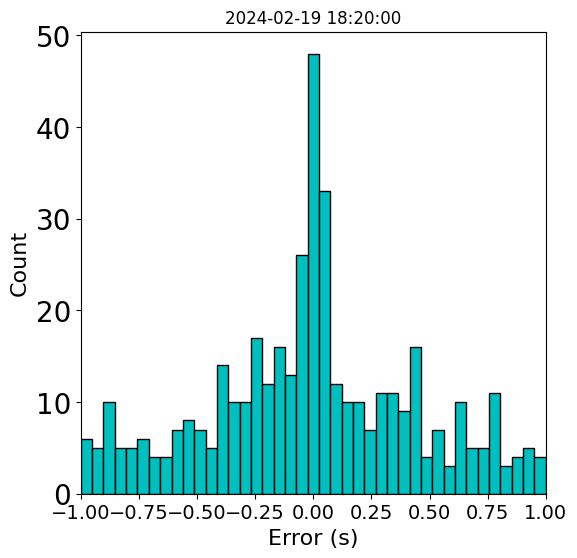

In [ ]:
#
# Read from disk and process the waveforms regardless of picks
#
#
# Read waveform segments dT seconds at the time
#
mincor=0.3
dT = 5
ndT = dT*250+1
tseg=np.empty(ndT)
nt=0
while nt<ndT:
  tseg[nt] = nt/250.
  nt+=1
plotdelay="delays_"+timestring+"_"+str(Interval)+".png"
plotamp="amps_"+timestring+"_"+str(Interval)+".png"
plotdistance="dist_"+timestring+"_"+str(Interval)+".png"
plotdistance_cor="cor_dist_"+timestring+"_"+str(Interval)+".png"
#
# Get epoch time from UTCDateTime
# Get two hours of data
#
delay12 = np.empty(0)
delay13 = np.empty(0)
delay23 = np.empty(0)
a1 = np.empty(0)
a2 = np.empty(0)
a3 = np.empty(0)
times = np.empty(0)
maxcor12 = np.empty(0)
maxcor13 = np.empty(0)
tpoints = np.empty(0)
#
#
#
mseedfileS2="H11S2_"+timestring+"_"+str(Interval)+".mseed"
mseedfileS3="H11S3_"+timestring+"_"+str(Interval)+".mseed"
mseedfileS1="H11S1_"+timestring+"_"+str(Interval)+".mseed"
sectionfile1="section1_H11S1_"+timestring+"_"+str(Interval)+".png"
sectionfile2="section2_H11S1_"+timestring+"_"+str(Interval)+".png"
sectionfile3="section3_H11S1_"+timestring+"_"+str(Interval)+".png"
st2 = read(path+mseedfileS2)
st3 = read(path+mseedfileS3)
st1 = read(path+mseedfileS1)
st2seg=st2
st3seg=st3
st1seg=st1
#
dt = st2[0].stats.sampling_rate
nseg = len(st2[0].data)/dT/dt
print('sampling rate and segments',dt, nseg)
k=0
n10=0
while k < 2*nseg-2:
  startseg = starttime+float(k/2*dT)
  endseg = startseg+dT
  midtime = (k*dT+dT)/2.
  print("Time in minutes:", midtime/60)
  w2 = flt.bandpass(st2seg.slice(startseg,endseg).detrend(type='linear')[0].data, 15, 50, dt)
  w3 = flt.bandpass(st3seg.slice(startseg,endseg).detrend(type='linear')[0].data, 15, 50, dt)
  w1 = flt.bandpass(st1seg.slice(startseg,endseg).detrend(type='linear')[0].data, 15, 50, dt)
#
  cross12=cc.correlate(w2,w1, shift=750, demean=True,
                       normalize='naive', method='auto')
  cross13=cc.correlate(w3,w1, shift=750, demean=True,
                       normalize='naive', method='auto')
  cross23=cc.correlate(w3,w2, shift=750, demean=True,
                       normalize='naive', method='auto')
  (shift12,max12)=cc.xcorr_max(cross12,abs_max=False)
  (shift13,max13)=cc.xcorr_max(cross13,abs_max=False)
  (shift23,max23)=cc.xcorr_max(cross23,abs_max=False)
#
  if (max12 > mincor or max13 > mincor or max23 > mincor):
    print("Maxima of CC:", max12, max13, max23)
    outdelay12=np.append(delay12,shift12/dt)
    outdelay13=np.append(delay13,shift13/dt)
    outdelay23=np.append(delay23,shift23/dt)
    outtime =np.append(times, midtime)
  #
    delay12=outdelay12
    delay13=outdelay13
    delay23=outdelay23
    times = outtime
  #
    senv1=flt.envelope(st1seg.slice(startseg,endseg).detrend(type='linear')[0].data)
    senv2=flt.envelope(st2seg.slice(startseg,endseg).detrend(type='linear')[0].data)
    senv3=flt.envelope(st3seg.slice(startseg,endseg).detrend(type='linear')[0].data)
  #
    outa1=np.append(a1,senv1.max())
    outa2=np.append(a2,senv2.max())
    outa3=np.append(a3,senv3.max())
  #
    a1 = outa1
    a2 = outa2
    a3 = outa3
  #
    n10+=1
    if n10 == 40:
      print(ndT)
#      plt.plot(tseg[0:ndT-1], st1seg.slice(startseg,endseg)[0].data[0:ndT-1],'r-')
      plt.plot(tseg[0:ndT-1], w1[0:ndT-1] ,'r-')
      plt.show()
      plt.plot(tseg[0:ndT-1], w2[0:ndT-1] ,'g-')
      plt.show()
      plt.plot(tseg[0:ndT-1], w3[0:ndT-1] ,'b-')
      plt.show()
      plt.plot(tseg[0:ndT-1],senv1[0:ndT-1],'r-',tseg[0:ndT-1],senv2[0:ndT-1],'g-',
                tseg[0:ndT-1],senv3[0:ndT-1],'b-')
      pstr="{num} minutes".format(num=int(midtime/60))
      plt.title(pstr)
      plt.show()
      plt.plot(w1,'r-',w2,'g-',w3,'b-')
      plt.show()
      n10=0
  k+=1
  #
#
#
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(times,delay12,'r.',times,delay13,'g.',times,delay23,'b.')
plt.savefig(plotdelay,format='png')
plt.xlim([0,Interval])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title(timestring)
plt.xlabel('Time in seconds',fontsize=20)
plt.ylabel('Delay (s)',fontsize=20)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(times,a1,'r.',times,a2,'g.',times,a3,'b.')
plt.savefig(plotamp,format='png')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title(timestring)
plt.xlabel('Amplitude ($\u03BC$Pa)',fontsize=20)
plt.ylabel('Delay (s)',fontsize=20)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(6, 6),  )
lims = np.linspace(-1, 1, 42)
plt.hist(delay23-delay13+delay12, bins = lims, color='c', edgecolor = 'black')
plt.xticks(fontsize=14)
plt.yticks(fontsize=20)
plt.xlim([-1, 1])
plt.xlabel('Error (s)',fontsize=16)
plt.ylabel('Count',fontsize=16)
plt.title(timestring)
plt.show()

np.save(path+"delay12"+"_"+timestring+"_"+str(Interval),delay12)
np.save(path+"delay13"+"_"+timestring+"_"+str(Interval),delay13)
np.save(path+"delay23"+"_"+timestring+"_"+str(Interval),delay23)
np.save(path+"times"+"_"+timestring+"_"+str(Interval),times)
np.save(path+"amp1"+"_"+timestring+"_"+str(Interval),a1)
np.save(path+"amp2"+"_"+timestring+"_"+str(Interval),a2)
np.save(path+"amp3"+"_"+timestring+"_"+str(Interval),a3)
#


In [ ]:
#
# Forward calculation TT differences and amplitude ratios
# Systematic search in a cube
#
#
k = 0
xp = np.empty(0)
yp = np.empty(0)
zp = np.empty(0)
tp = np.empty(0)
#
delay12 = np.load(path+"delay12"+"_"+timestring+"_"+str(Interval)+".npy")
delay13 = np.load(path+"delay13"+"_"+timestring+"_"+str(Interval)+".npy")
amp1 = np.load(path+"amp1"+"_"+timestring+"_"+str(Interval)+".npy")
amp2 = np.load(path+"amp2"+"_"+timestring+"_"+str(Interval)+".npy")
amp3 = np.load(path+"amp3"+"_"+timestring+"_"+str(Interval)+".npy")
times = np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
nk = len(delay12)
delay_only = False
amp_only = True
while k < nk :
  print (k)
  a12 = amp1[k]/amp2[k]
  a13 = amp1[k]/amp3[k]
  res,xx,yy,zz = MinRes(delay12[k],delay13[k],a12,a13,delay_only,amp_only)
  oxp=np.append(xp,xx)
  oyp=np.append(yp,yy)
  ozp=np.append(zp,zz)
  otp=np.append(tp,k)
  xp = oxp
  yp = oyp
  zp = ozp
  tp = otp
  print(res,xx,yy,zz)
  k += 1
#plt.plot(yp,xp,'k*')
plt.plot([0],[0],'r*', markersize=20)
plt.plot([x2[1]],[x2[0]],'g*', markersize=20)
plt.plot([x3[1]],[x3[0]],'b*', markersize=20)
#plt.plot(yp,xp,'k*')
for k in range (1,nk,20):
  pstr="{num}".format(num=k)
  print(pstr)
  plt.text(yp[k],xp[k],pstr,fontsize=6,color='k',fontweight='bold')
for k in range (1,nk):
  plt.plot(yp[k],xp[k],'r.')
  if zp[k] < -0.8 :
    plt.plot(yp[k],xp[k],'bo')
plt.ylabel('latitude')
plt.xlabel('longitude')
plt.xlim([-4,8])
plt.ylim([-9,4])
plt.show()
for k in range (1,nk):
  plt.plot(xp[k],zp[k],'ro', markersize=10)
plt.show()


0
1.24 0.36 0.7879920853971275 0.7959800404399405
7.258573580908866e-05 -1.8750000000000075 -7.624999999999995 -0.714
1
1.188 -0.876 0.8431560726689938 0.803769732011939
0.002565131046484986 -0.4750000000000102 -1.374999999999953 -0.8140000000000001
2
1.24 0.616 1.071821044289509 1.079471588936085
0.01092032815442616 -0.3500000000000101 -1.049999999999954 -0.864
3
1.24 0.616 0.7705144091644891 0.7959147326082393
0.00023099265862814463 -1.450000000000009 -7.32499999999999 -0.689
4
1.184 0.512 1.0025397054211758 1.4849864494362435
0.0006071424532060673 3.399999999999982 -0.09999999999995354 -0.6639999999999999
5
1.184 0.512 0.9082600572422542 1.253198596765224
0.0001414081226360305 5.600000000000002 -0.9999999999999541 -0.639
6
1.232 0.512 0.9797195634870448 1.127641381043704
0.006024608065519354 -0.22500000000001 -1.1249999999999538 -0.6639999999999999
7
1.136 0.516 1.4076540613573607 1.3137245353519449
0.008133806723987166 -0.3500000000000101 -0.799999999999954 -0.764
8
1.136 0.188 1.0

KeyboardInterrupt: 

0.5396572736861587 -5.0 -1.1500000000000001 -0.739


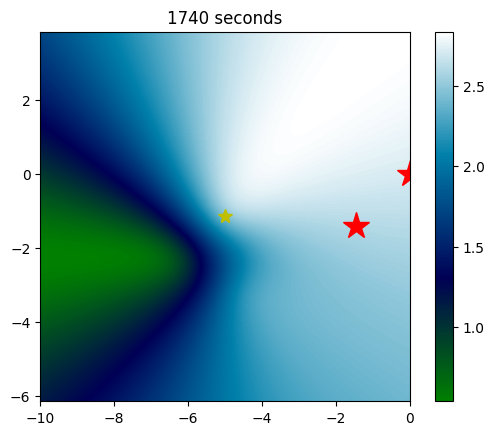

k 1 valid k 1 Time in min. 1742 horizontal angle 60.5 azimuth 3
1.1685262453388097 -3.775 0.07499999999999996 -0.739
k 2 valid k 2 Time in min. 1743 horizontal angle 17.5 azimuth 293
0.000845154052067417 -4.725 1.05 -0.739
k 3 valid k 3 Time in min. 1748 horizontal angle 0.0 azimuth 37
1.5133539163987384 -3.4999999999999996 2.2750000000000004 -0.739
k 4 valid k 4 Time in min. 1749 horizontal angle 43.5 azimuth 10
0.49119734455185865 -2.2749999999999995 3.5000000000000004 -0.739
k 5 valid k 5 Time in min. 1753 horizontal angle 0.0 azimuth 43
0.821914254958738 -1.0499999999999994 4.7250000000000005 -0.739
k 6 valid k 6 Time in min. 1757 horizontal angle 0.0 azimuth 108
3.2756924134233842 0.1750000000000007 3.4750000000000005 -0.739
k 7 valid k 7 Time in min. 1759 horizontal angle 0.0 azimuth 206
5.260545937629755 -1.0749999999999993 2.2250000000000005 -0.739
k 8 valid k 8 Time in min. 1774 horizontal angle 0.0 azimuth 117
3.9292309652786024 0.1500000000000008 0.9750000000000005 -0.739
k 

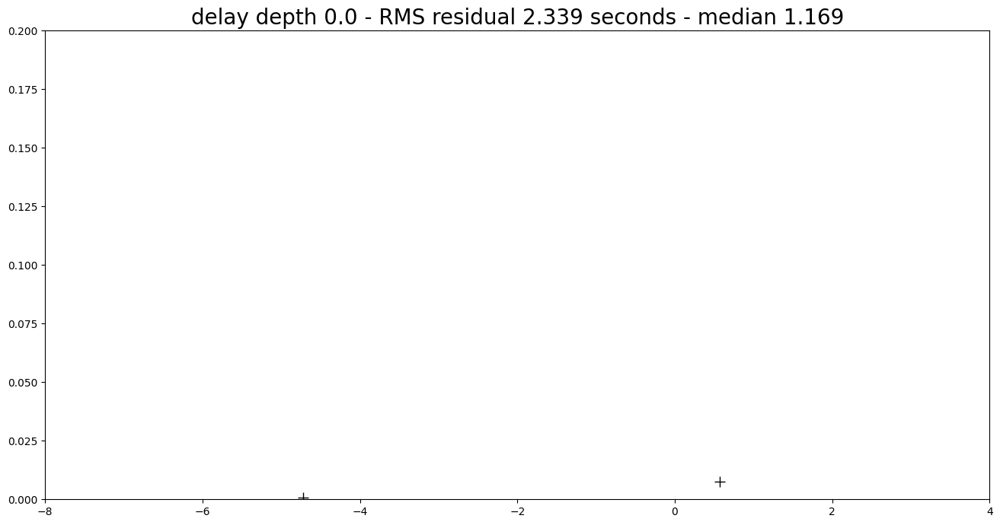

104400


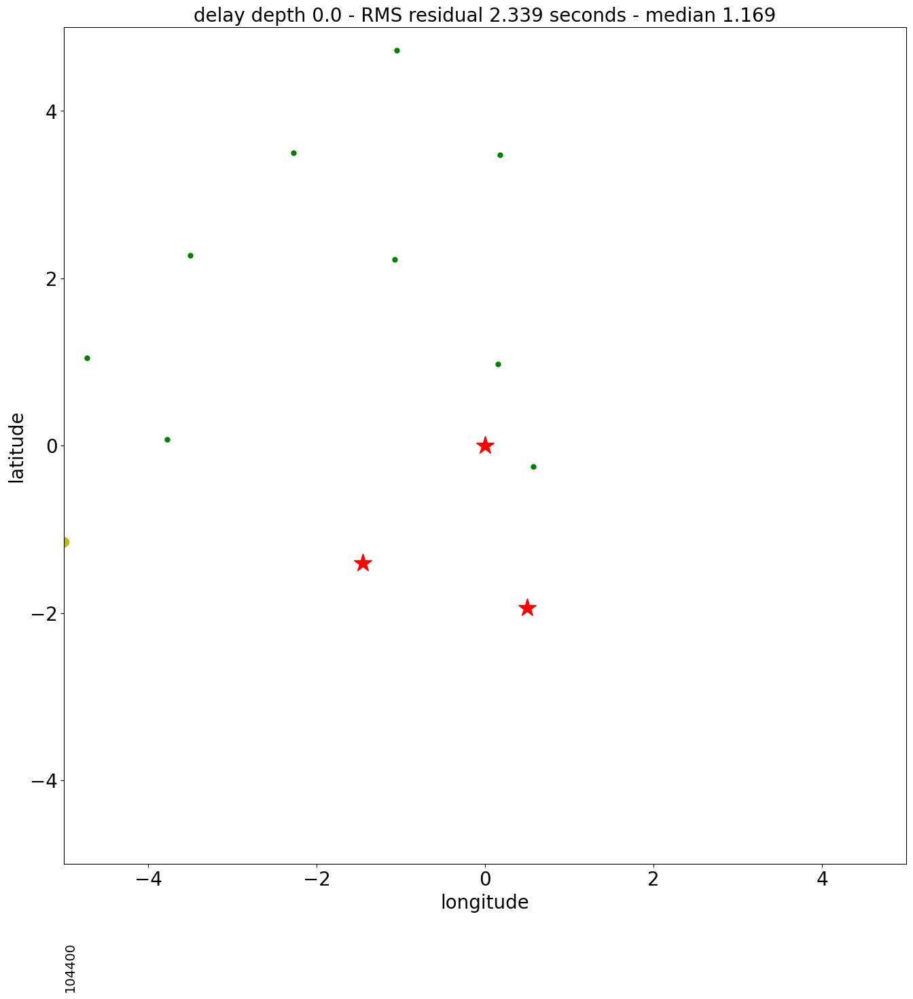

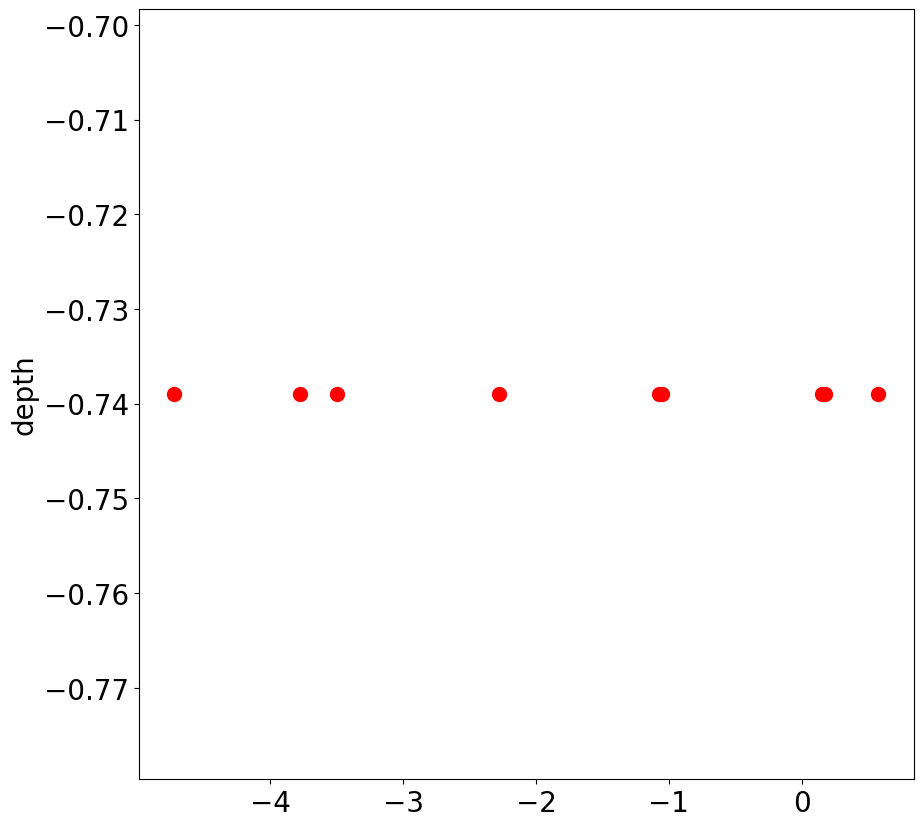

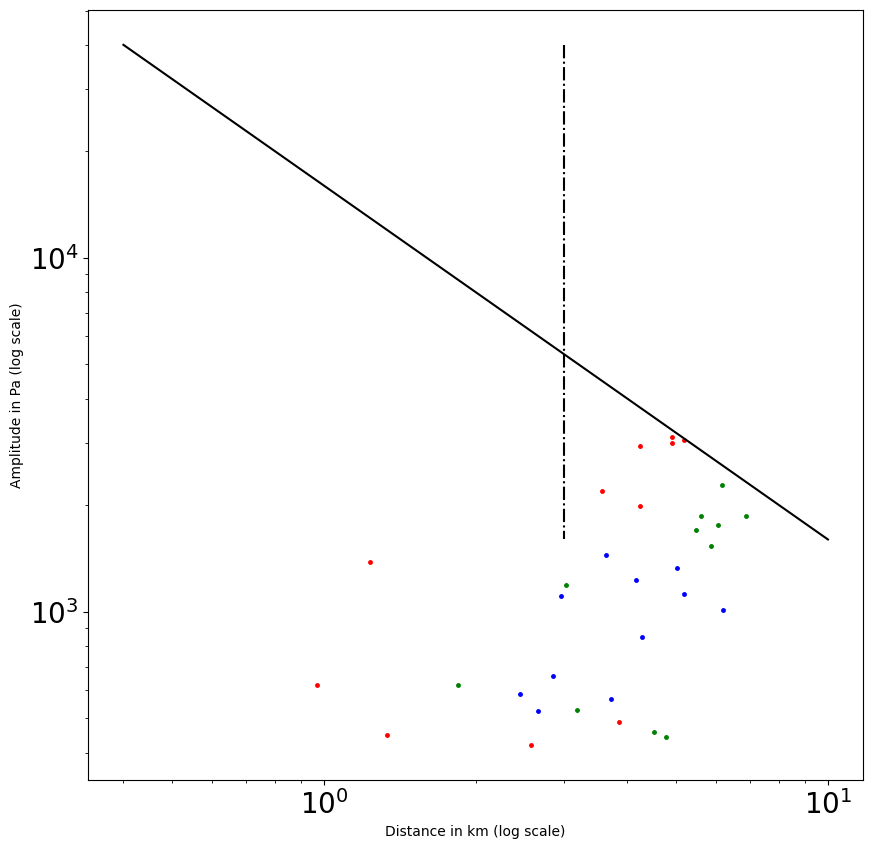

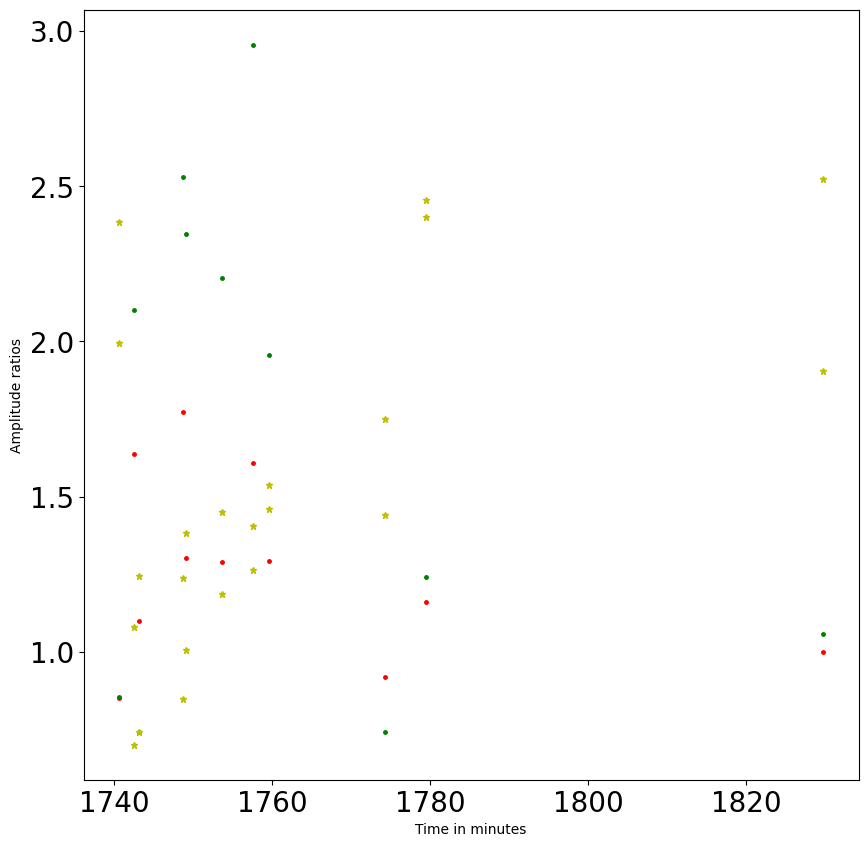

In [90]:
# Forward calculation TT differences and amplitude ratios
# limited search around previous point
#
xp = np.empty(0)
yp = np.empty(0)
zp = np.empty(0)
tp = np.empty(0)
dp = np.empty(0)
ap = np.empty(0)
resa = np.empty(0)
#
delay12 = np.load(path+"delay12"+"_"+timestring+"_"+str(Interval)+".npy")
delay13 = np.load(path+"delay13"+"_"+timestring+"_"+str(Interval)+".npy")
amp1 = np.load(path+"amp1"+"_"+timestring+"_"+str(Interval)+".npy")
amp2 = np.load(path+"amp2"+"_"+timestring+"_"+str(Interval)+".npy")
amp3 = np.load(path+"amp3"+"_"+timestring+"_"+str(Interval)+".npy")
times = np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
apvel = np.load(path+"apvel"+"_"+timestring+"_"+str(Interval)+".npy")
azim = np.load(path+"azim"+"_"+timestring+"_"+str(Interval)+".npy")
nk = len(delay12)
#
# Find first point
#
a12 = amp1[0]/amp2[0]
a13 = amp1[0]/amp3[0]
delay_only = True
amp_only = False
wdepth = -0.739
if(amp_only): resmet = "amp "
if(delay_only): resmet = "delay "
if(not amp_only and not delay_only): resmet = "amp and delay "
res,xinit,yinit,zinit,resmap = MinRes(delay12[0],delay13[0],a12,a13,wdepth, delay_only,amp_only)
print(res,xinit,yinit,zinit)
xp=np.append(xp,xinit)
yp = np.append(yp,yinit)
zp=np.append(zp,zinit)
tp=np.append(tp,times[0])
x = (xinit, yinit, zinit)
d1 = Norm(Diff(S1,x))
d2 = Norm(Diff(S2,x))
d3 = Norm(Diff(S3,x))
dp=np.append(dp,d1)
dp=np.append(dp,d2)
dp=np.append(dp,d3)
d1 = Norm(Diff(S1,x))
d2 = Norm(Diff(S2,x))
d3 = Norm(Diff(S3,x))
ap=np.append(ap,amp1[0])
ap=np.append(ap,amp2[0])
ap=np.append(ap,amp3[0])
extent = (xinit-5,xinit+5, yinit+5,yinit-5)
plt.imshow(resmap, cmap = 'ocean', extent = extent)
pstr="{num} seconds".format(num=int(times[0]))
plt.title(pstr)
plt.ylim([yinit-5,yinit+5])
plt.xlim([xinit-5,xinit+5])
plt.plot(xinit,yinit,'y*', markersize=10)
plt.plot([0],[0],'r*', markersize=20)
plt.plot([x2[1]],[x2[0]],'r*', markersize=20)
plt.plot([x3[1]],[x3[0]],'r*', markersize=20)
plt.colorbar(orientation='vertical')
plt.show()
k = 1
vk = 1
nocomp = False
res_all = res*res
resa=np.append(resa,res)
while k < nk :
  print("k",k, "valid k", vk, "Time in min.",int(times[k]),"horizontal angle",apvel[k],"azimuth", int(180*azim[k]/np.pi))
  if  (apvel[k] < 20 and nocomp) :
    k += 1
    continue
#
# Amplitude ratios should be inverse of distance ratios
#

  a12 = amp1[k]/amp2[k]
  a13 = amp1[k]/amp3[k]
  res,xx,yy,zz, resmap = MinResInc(delay12[k],delay13[k],a12,a13,xinit,yinit,
                           zinit,delay_only,amp_only)
  res_all += res*res
  resa=np.append(resa,res)
  if (not vk%40):
    extent = (xinit-5,xinit+5, yinit+5,yinit-5)
    plt.imshow(resmap, cmap = 'ocean', extent = extent)
    pstr="{num} seconds".format(num=int(times[k]))
    plt.title(pstr)
    plt.ylim([yinit-5,yinit+5])
    plt.xlim([xinit-5,xinit+5])
    plt.plot(xx,yy,'y*', markersize=10)
    plt.plot([0],[0],'r*', markersize=20)
    plt.plot([x2[1]],[x2[0]],'r*', markersize=20)
    plt.plot([x3[1]],[x3[0]],'r*', markersize=20)
    plt.colorbar(orientation='vertical')
    plt.show()
  xinit = xx
  yinit = yy
  zinit = zz
  xp=np.append(xp,xx)
  yp=np.append(yp,yy)
  zp=np.append(zp,zz)
  tp=np.append(tp,times[k])
  x = (xx, yy, zz)
  d1 = Norm(Diff(S1,x))
  d2 = Norm(Diff(S2,x))
  d3 = Norm(Diff(S3,x))
  dp=np.append(dp,d1)
  dp=np.append(dp,d2)
  dp=np.append(dp,d3)
  d1 = Norm(Diff(S1,x))
  d2 = Norm(Diff(S2,x))
  d3 = Norm(Diff(S3,x))
  ap=np.append(ap,amp1[k])
  ap=np.append(ap,amp2[k])
  ap=np.append(ap,amp3[k])

  print(res,xx,yy,zz)
  k += 1
  vk += 1
rms_res = math.sqrt(res_all/vk)
med = np.median(resa)
fig, ax = plt.subplots(figsize=(16, 8), )
for j in range (1,vk-1):
  plt.plot(xp[j],resa[j],'k+', markersize=10)
pstrres=resmet+"depth {dep} - RMS residual {num} seconds - median {medd}".format(dep=round(wdepth+0.739,3),num=round(rms_res,3), medd=round(med,3))
plt.title(pstrres, fontsize=20)
plt.ylim([0,0.2])
plt.xlim([-8,4])
plt.show()
fig, ax = plt.subplots(figsize=(16, 16), )
#plt.plot(yp,xp,'k*')
for j in range (0,vk-1):
  plt.plot(xp[j],yp[j],'go', markersize=5)
for j in range (0,vk-1,40):
  pstr="{num}".format(num=60*int(tp[j]))
  print(pstr)
  plt.plot(xp[j], yp[j], 'yo', markersize=10)
  plt.text(xp[j], -6.5 , pstr, color='k', rotation='vertical', fontsize=14)
# if zp[k] < -0.8 :
# plt.plot(xp[k],yp[k],'bo')
plt.ylabel('latitude', fontsize=20)
plt.xlabel('longitude', fontsize=20)
plt.title(pstrres, fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([-5,5])
plt.ylim([-5,5])
plt.plot([0],[0],'r*', markersize=20)
plt.plot([x2[1]],[x2[0]],'r*', markersize=20)
plt.plot([x3[1]],[x3[0]],'r*', markersize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()
fig, ax = plt.subplots(figsize=(10, 10), )
for j in range (1,vk-1):
  plt.plot(xp[j],zp[j],'ro', markersize=10)
  plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel('depth', fontsize=20)
plt.show()
fig, ax = plt.subplots(figsize=(10, 10), )
onelinx=(0.4,10)
oneliny=(40000,1600)
fourkmlinx=(3.,3.)
fourkmliny=(40000,1600)
for k in range (0,len(dp),3):
  plt.plot(dp[k],ap[k],'r.',markersize=5)
for k in range (1,len(dp),3):
  plt.plot(dp[k],ap[k],'g.',markersize=5)
for k in range (2,len(dp),3):
  plt.plot(dp[k],ap[k],'b.',markersize=5)
plt.plot(onelinx,oneliny,'k-')
plt.plot(fourkmlinx,fourkmliny,'k-.')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Distance in km (log scale)')
plt.ylabel('Amplitude in Pa (log scale)')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()
fig, ax = plt.subplots(figsize=(10, 10), )
for k in range (0,len(tp)):
  plt.plot(tp[k],ap[3*(k-1)]/ap[3*(k-1)+1],'r.', tp[k],ap[3*(k-1)]/ap[3*(k-1)+2],'g.', tp[k], dp[3*(k-1)+1]/dp[3*(k-1)],'y*',tp[k], dp[3*(k-1)+2]/dp[3*(k-1)], 'y*', markersize=5)
plt.xlabel('Time in minutes')
plt.ylabel('Amplitude ratios')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()
#
# Save results
#
np.save(path+"dist"+"_"+timestring+"_"+str(Interval),dp)
np.save(path+"amps"+"_"+timestring+"_"+str(Interval),ap)
np.save(path+"xp"+"_"+timestring+"_"+str(Interval),xp)
np.save(path+"yp"+"_"+timestring+"_"+str(Interval),yp)
np.save(path+"zp"+"_"+timestring+"_"+str(Interval),zp)
np.save(path+"tp"+"_"+timestring+"_"+str(Interval),tp)

0
272.5 1.48 0.0
1
3.5 1.48 60.5
2
293.5 1.48 17.5
3
37.0 1.48 0.0
4
10.999999999999998 1.48 43.5
5
43.0 1.48 0.0
6
108.0 1.48 0.0
7
206.99999999999997 1.48 0.0
8
117.5 1.48 0.0
9
39.0 1.48 43.0
10
334.0 1.48 0.0


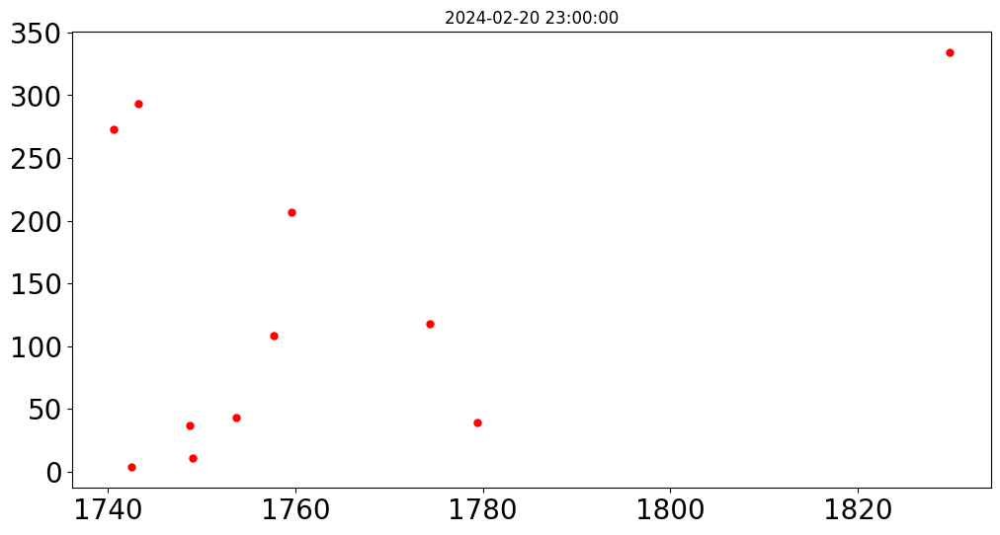

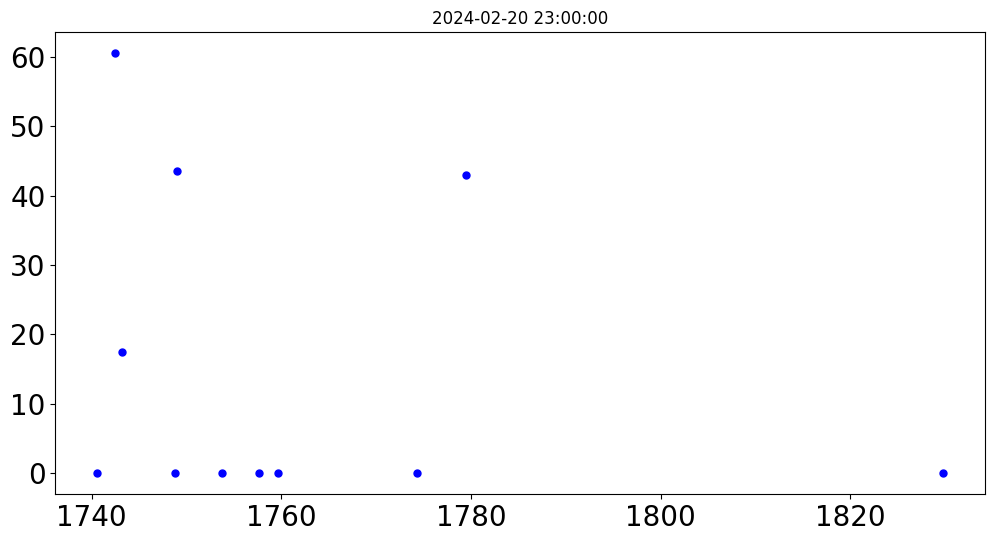

In [89]:
#
# Compute optimal velocity and direction assuming far-field
# If velocity is very high, this assumption is not correct.
#
#
#
#
#
def CompDirection(x2, x3, dt):


  mindiff = 9999999999999999999999.
  OptDirection = 0.
  wvel = 1.48
  found = False
#
#
  for vert in range (0,180,1):
    vertang = vert*90./180.
    for i in range (720):
      theta = 2.*np.pi*float(i)/720.
      dt1,dt2 = CompDt(theta,vertang, wvel)
      dt3 = dt2-dt1
      diff = math.sqrt((dt1-dt[0])*(dt1-dt[0])+(dt2-dt[1])*(dt2-dt[1])+(dt3-dt[2])*(dt3-dt[2]))
      if (diff < mindiff):
        mindiff = diff
        OptDirection = theta
        OptVelocity = wvel
        Optang = vertang
        found = True
#
#
  return OptDirection, OptVelocity, Optang, found
#
#
#
k = 0
az = np.empty(0)
vel = np.empty(0)
tim = np.empty(0)
#
#
delay12 = np.load(path+"delay12"+"_"+timestring+"_"+str(Interval)+".npy")
delay13 = np.load(path+"delay13"+"_"+timestring+"_"+str(Interval)+".npy")
delay23 = np.load(path+"delay23"+"_"+timestring+"_"+str(Interval)+".npy")
times = np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
nk = len(delay12)
#
k = 0
while k < nk :
  print(k)
  std = (delay12[k] + delay13[k] + delay23[k])/3.
  dt =  (delay12[k], delay13[k], delay23[k], std, std, std)
  OptDirection, OptVelocity, Optang, found  = CompDirection(x2,x3, dt)
#
# Direction computed is the azimuth of the propagating plane wave
# change to backazimuth within [0-2*pi]
#

  if (OptDirection < 0) :
    OptDirection += 2*np.pi
  elif (OptDirection >= 2.*np.pi ):
    OptDirection -= 2*np.pi
  if (found):
    az=np.append(az,OptDirection)
    vel=np.append(vel,Optang)
    tim = np.append(tim, times[k])
#
#
#
#
  print(180*OptDirection/np.pi, OptVelocity, Optang)
  k += 1
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(tim, 180.*az/np.pi,'r.', markersize=10)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title(timestring)
#plt.xlim([0, 7200])
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(tim, vel,'b.', markersize=10)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title(timestring)
#plt.xlim([0, 7200])
plt.show()
np.save(path+"apvel"+"_"+timestring+"_"+str(Interval),vel)
np.save(path+"azim"+"_"+timestring+"_"+str(Interval),az)
#

0
342.0 1.51 0.0
1
342.0 1.51 0.0
2
315.50000000000006 1.42 0.0
3
320.5 1.6400000000000001 0.0
4
322.5 1.41 0.0
5
319.0 1.61 0.0
6
304.5 1.22 0.0
7
332.00000000000006 2.0 0.0
8
314.49999999999994 1.43 0.0
9
310.5 1.3599999999999999 0.0
10
286.5 1.0 0.0
11
315.0 1.71 0.0
12
301.5 1.03 0.0
13
313.99999999999994 1.3599999999999999 0.0
14
196.0 1.34 0.0
15
308.00000000000006 1.47 0.0
16
287.0 1.17 0.0
17
296.5 1.05 0.0
18
300.50000000000006 1.03 0.0
19
284.0 1.0 0.0
20
313.0 1.54 0.0


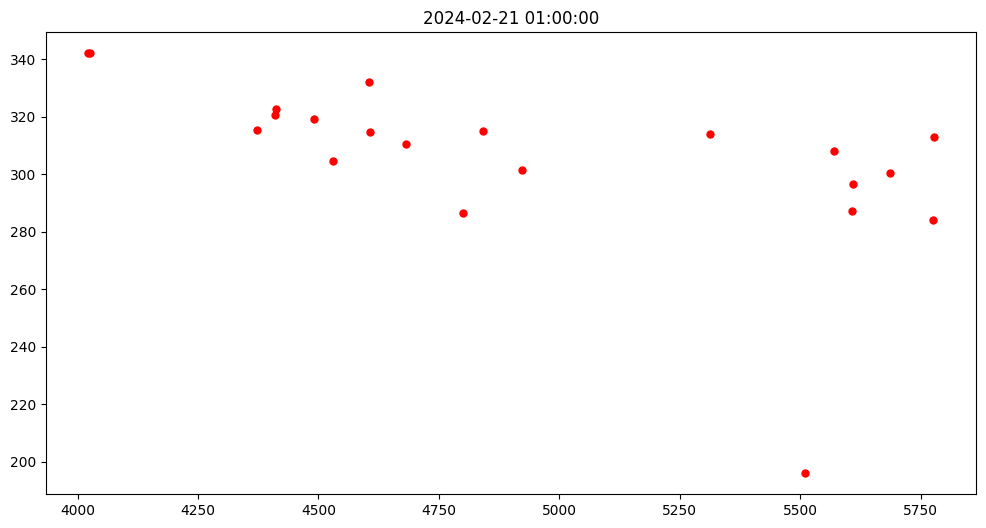

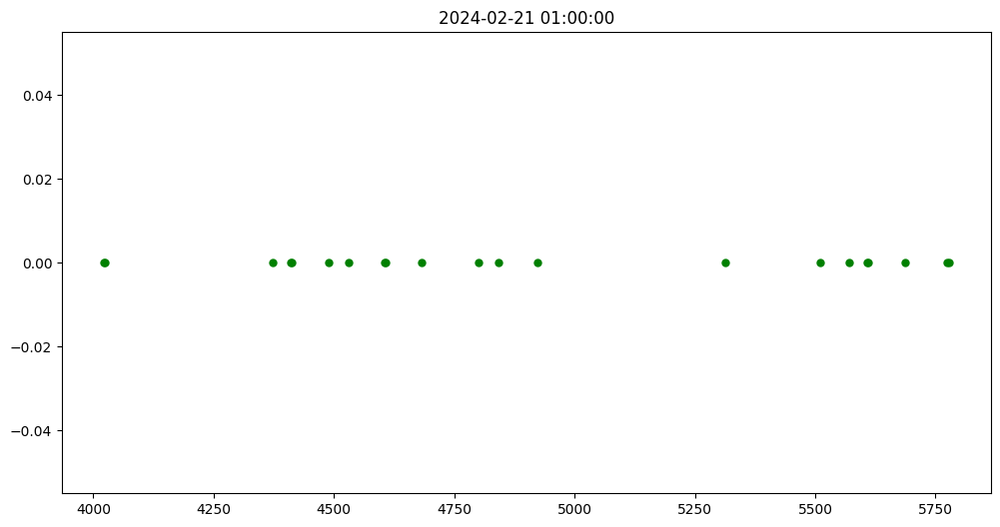

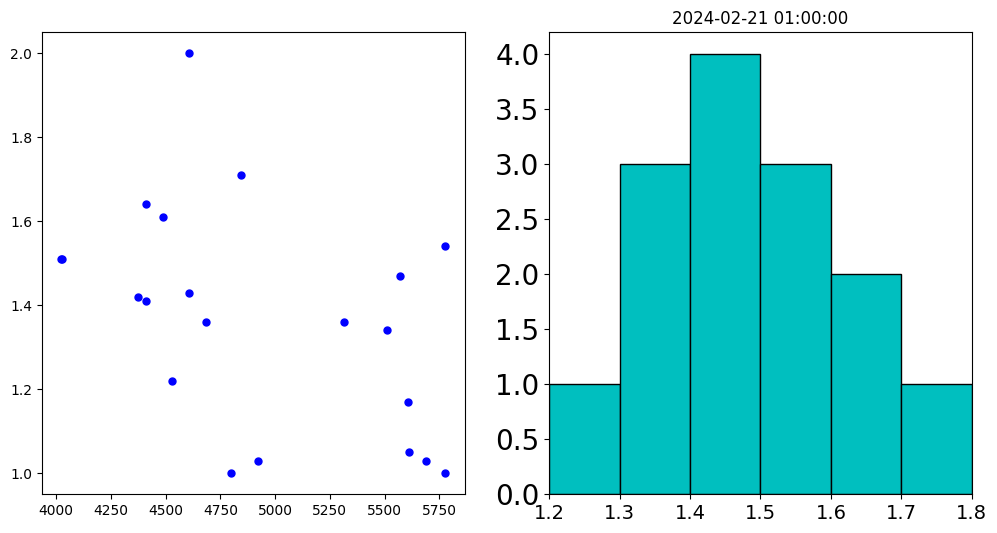

In [ ]:
#
# Estimate optimal velocity given delay measurements
# and assuming horizontal propagation
#
#
def CompOptVel(x2, x3, dt):
#
# Loop over values of velocity and vertical angle to get optimal direction
# velocity and vertical angle for two delay values
#
  mindiff = 9999999999999999999999.
  OptDirection = 0.
  OptVelocity= 99999.
#
#
  for devl in range (-50,51,1):
      svel = 1.5+devl*0.01
      vertang = 0.
      for i in range (720):
        theta = 2.*np.pi*float(i)/720.
        dt1,dt2 = CompDt(theta,vertang, svel)
        dt3 = dt2-dt1
        diff = math.sqrt((dt1-dt[0])*(dt1-dt[0])+(dt2-dt[1])*(dt2-dt[1])+(dt3-dt[2])*(dt3-dt[2]))
        if (diff < mindiff):
          mindiff = diff
          OptDirection = theta
          OptVelocity = svel
          Optang = vertang
  #
  return OptDirection, OptVelocity, Optang
#
#
#
k = 0
az = np.empty(0)
ang = np.empty(0)
vel = np.empty(0)
tim = np.empty(0)
#
#
delay12 = np.load(path+"delay12"+"_"+timestring+"_"+str(Interval)+".npy")
delay13 = np.load(path+"delay13"+"_"+timestring+"_"+str(Interval)+".npy")
delay23 = np.load(path+"delay23"+"_"+timestring+"_"+str(Interval)+".npy")
times = np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
nk = len(delay12)
#
k = 0
while k < nk :
  print(k)
  std = (delay12[k] + delay13[k] + delay23[k])/3.
  dt =  (delay12[k], delay13[k], delay23[k], std, std, std)
  OptDirection, OptVelocity, Optang = CompOptVel(x2,x3, dt)
#
# Direction computed is the azimuth of the propagating plane wave
# change to backazimuth within [0-2*pi]
#
  if (Optang < 90):
    if (OptDirection < 0) :
      OptDirection += 2*np.pi
    elif (OptDirection >= 2.*np.pi ):
      OptDirection -= 2*np.pi
    az=np.append(az,OptDirection)
    ang=np.append(ang,Optang)
    vel=np.append(vel,OptVelocity)
    tim = np.append(tim, times[k])
#
#
#
  print(180*OptDirection/np.pi, OptVelocity, Optang)
  k += 1
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(tim, 180.*az/np.pi,'r.', markersize=10)
#plt.xlim([0, 7200])
plt.title(timestring)
plt.show()
fig, ax = plt.subplots(1, 1, figsize=(12, 6),  )
plt.plot(tim, ang,'g.', markersize=10)
plt.title(timestring)
plt.show()
#
fig, ax = plt.subplots(1, 2, figsize=(12, 6),  )
ax[0].plot(tim, vel,'b.', markersize=10)
defbin = np.linspace(1.1, 1.9, 9)
ax[1].hist(vel, color='c', bins=defbin, edgecolor='black')
plt.xticks(fontsize=14)
plt.yticks(fontsize=20)
plt.xlim([1.2, 1.8])
plt.title(timestring)
plt.show()
np.save(path+"apvel"+"_"+timestring+"_"+str(Interval),ang)
np.save(path+"azim"+"_"+timestring+"_"+str(Interval),az)
np.save(path+"vel"+"_"+timestring+"_"+str(Interval),vel)

1120 1120 1120 1120 1120 1120 1120 1120
Whale depth: -0.739 -0.739 0.07500000000000001 0.07500000000000001 271.7861676906222
Whale depth: -0.714 -0.714 0.07500000000000001 0.07500000000000001 263.3408245693306
Whale depth: -0.689 -0.689 0.07500000000000001 0.07500000000000001 255.29224471340098
Whale depth: -0.6639999999999999 -0.6639999999999999 0.05000000000000002 0.07500000000000001 247.70721010200003
Whale depth: -0.639 -0.639 0.05000000000000002 0.07500000000000001 240.65352067348724
Whale depth: -0.614 -0.614 0.05000000000000002 0.07500000000000001 234.2561684634338
Whale depth: -0.589 -0.589 0.05000000000000002 0.07500000000000001 228.62293014960215
Whale depth: -0.564 -0.564 0.024999999999999994 0.07500000000000001 223.85788444240154
Whale depth: -0.5389999999999999 -0.5389999999999999 0.024999999999999994 0.07500000000000001 220.06480898174573
Whale depth: -0.514 -0.514 0.024999999999999994 0.07500000000000001 217.42398549512106
Whale depth: -0.489 -0.489 0.0 0.075000000000000

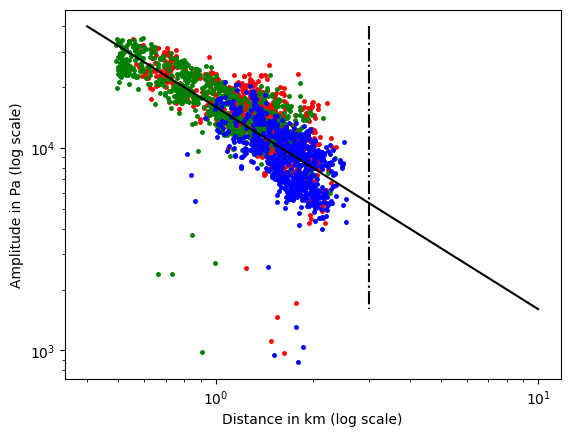

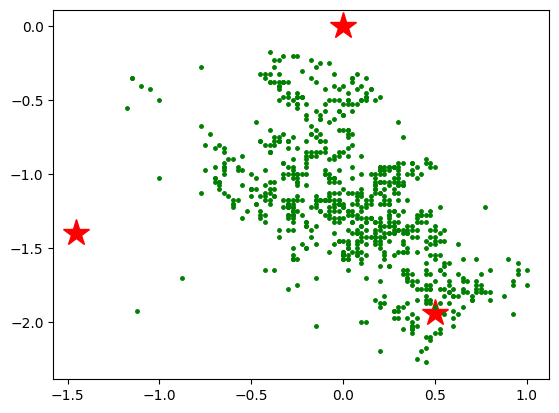

In [ ]:
#
# Minimize residual of amplitude ratios for given delays and amplitudes.
# variables are depth of whale and depth differences with H11S1.
# Horizontal position of whales computed from delays is kept constant.
#
amp1 = np.load(path+"amp1"+"_"+timestring+"_"+str(Interval)+".npy")
amp2 = np.load(path+"amp2"+"_"+timestring+"_"+str(Interval)+".npy")
amp3 = np.load(path+"amp3"+"_"+timestring+"_"+str(Interval)+".npy")
apvel = np.load(path+"apvel"+"_"+timestring+"_"+str(Interval)+".npy")
times = np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
xp = np.load(path+"xp"+"_"+timestring+"_"+str(Interval)+".npy")
yp = np.load(path+"yp"+"_"+timestring+"_"+str(Interval)+".npy")
tp = np.load(path+"tp"+"_"+timestring+"_"+str(Interval)+".npy")
#
# Loop around whale depth from 0 to 400m
#
nk = len(amp1)
S0 = ((x2[1]+x3[1])/2., (x2[0]+x3[0])/2., 0.)
mindiff = 9999999999999999999999.
print(len(amp1), len(amp2), len(amp3), len(apvel),
      len (times), len(xp), len(yp), len(tp))
for wdepth in range (32):
  depthw = -0.739+0.025*wdepth
  for depth2 in range (8):
    ddepth2 = -0.1+0.025*depth2
    for depth3 in range (8):
      ddepth3 = -0.1+0.025*depth3
#      print (depthw,ddepth2,ddepth3)
      diff = 0
      vk = 0
      for k in range(nk):
#        print("Apparent velocity", apvel[k])
        xs = (xp[k], yp[k],0)
        if(apvel[k] > 30 and Norm(Diff(S0,xs)) < 1.5):
          vk += 1
          x = (xp[k], yp[k], depthw)
          a12 = amp1[k]/amp2[k]
          a13 = amp1[k]/amp3[k]
          S1 = (0., 0., 0.)
          S2 = (x2[1], x2[0], ddepth2)
          S3 = (x3[1], x3[0], ddepth3)
          at12, at13 = AmpRatios (S1,S2,S3,x)
          res = (a12-at12)*(a12-at12)+(a13-at13)*(a13-at13)
          diff += res
      if (diff < mindiff):
        mindiff = diff
        Optwdepth = depthw
        Optddepth2 = ddepth2
        Optddepth3 = ddepth3
  print("Whale depth:", depthw, Optwdepth, Optddepth2, Optddepth3, mindiff)
#
#
print("Optimal whale depths and differential depths:",
      Optwdepth, Optddepth2, Optddepth3, "computed on", vk)
dp = np.empty(0)
ap = np.empty(0)
xf=np.empty(0)
yf=np.empty(0)
for k in range(nk):
  xs = (xp[k], yp[k],0)
  S1 = (0., 0., 0.)
  S2 = (x2[1], x2[0], Optddepth2)
  S3 = (x3[1], x3[0], Optddepth3)
  if(apvel[k] > 30 and Norm(Diff(S0,xs)) < 1.5):
      x = (xp[k], yp[k], Optwdepth)
      d1 = Norm(Diff(S1,x))
      d2 = Norm(Diff(S2,x))
      d3 = Norm(Diff(S3,x))
      dp=np.append(dp,d1)
      dp=np.append(dp,d2)
      dp=np.append(dp,d3)
      ap=np.append(ap,amp1[k])
      ap=np.append(ap,amp2[k])
      ap=np.append(ap,amp3[k])
      xf=np.append(xf,xp[k])
      yf=np.append(yf,yp[k])
onelinx=(0.4,10)
oneliny=(40000,1600)
fourkmlinx=(3.,3.)
fourkmliny=(40000,1600)
for k in range (0,len(dp),3):
  plt.plot(dp[k],ap[k],'r.',markersize=5)
for k in range (1,len(dp),3):
  plt.plot(dp[k],ap[k],'g.',markersize=5)
for k in range (2,len(dp),3):
  plt.plot(dp[k],ap[k],'b.',markersize=5)
plt.plot(onelinx,oneliny,'k-')
plt.plot(fourkmlinx,fourkmliny,'k-.')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Distance in km (log scale)')
plt.ylabel('Amplitude in Pa (log scale)')
plt.show()
plt.plot(S1[0],S1[1],'r*',markersize=20)
plt.plot(S2[0],S2[1],'r*',markersize=20)
plt.plot(S3[0],S3[1],'r*',markersize=20)
for k in range (0,len(xf)):
  plt.plot(xf[k],yf[k],'g.',markersize=5)
plt.show()

1785 1785 1785 1785 1785 1786 1786
-0.489 -0.2 -0.35
depth 0.25 - depth2 -0.2 - depth3 -0.35 - RMS delays 0.023s. - RMS amp ratio 0.538 - Median ratio 0.302 0.5382006698028542 0.538 903


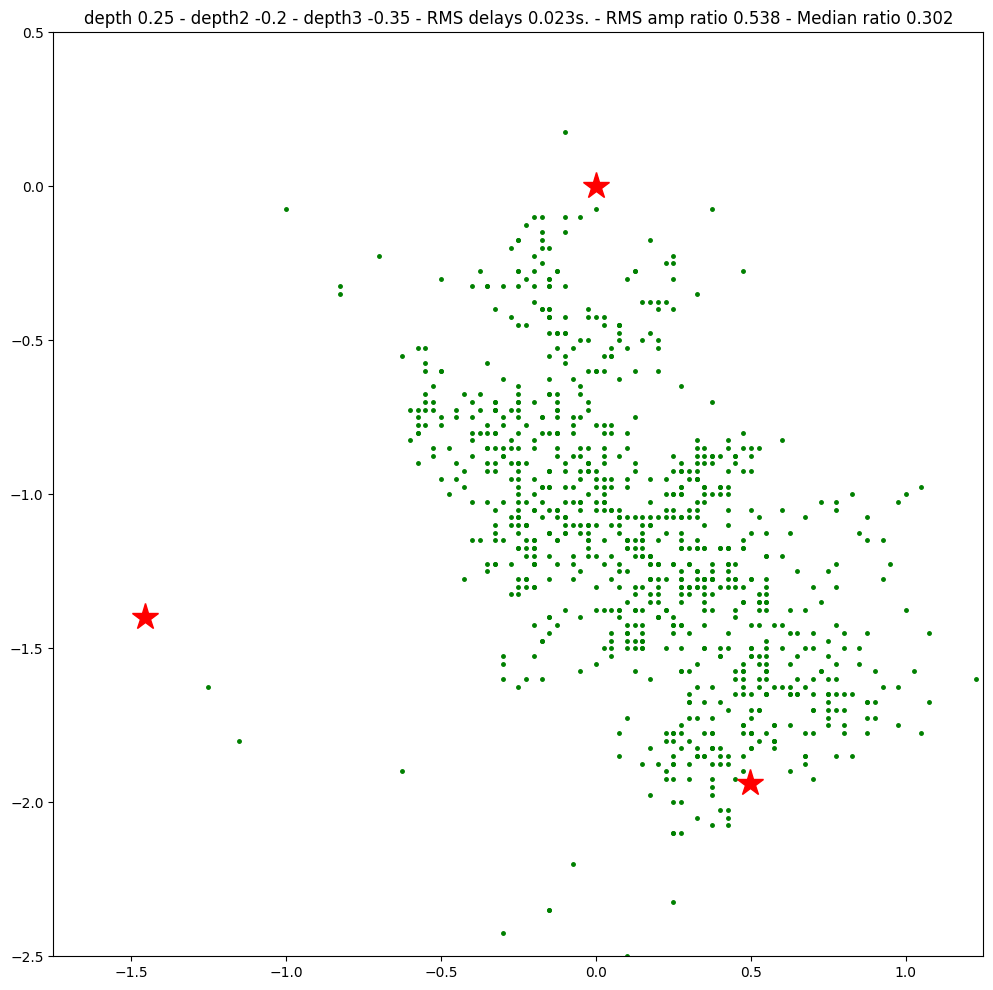

Whale depth: -0.489 0.25 -0.2 -0.35 261.56294476154557
Optimal whale depths and differential depths: 0.25 -0.2 -0.35 computed on 903


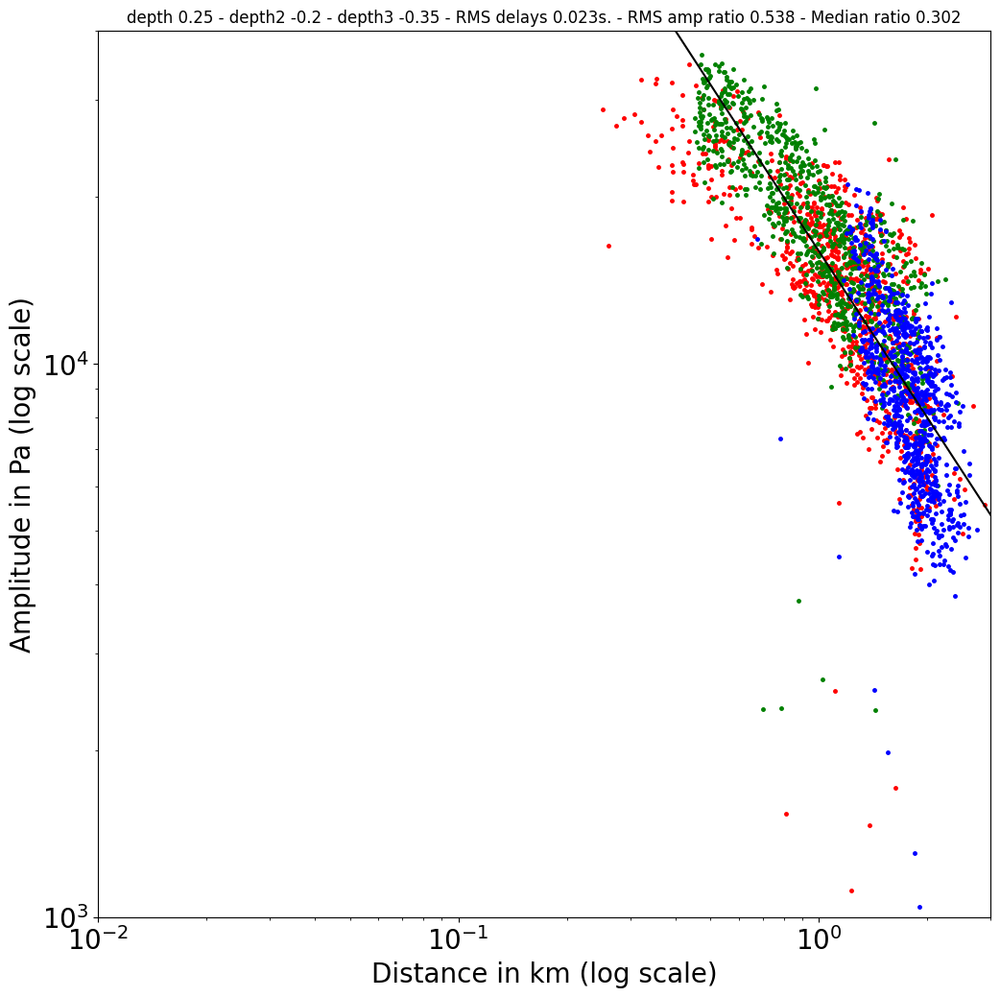

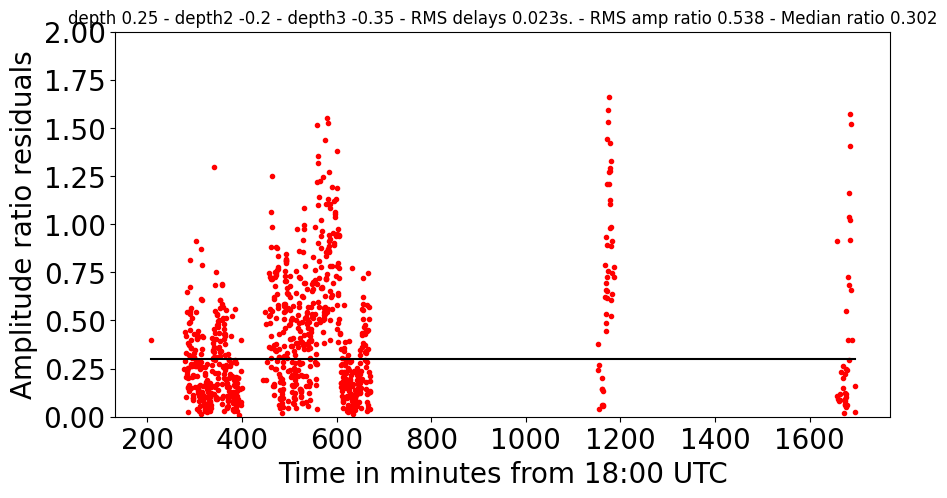

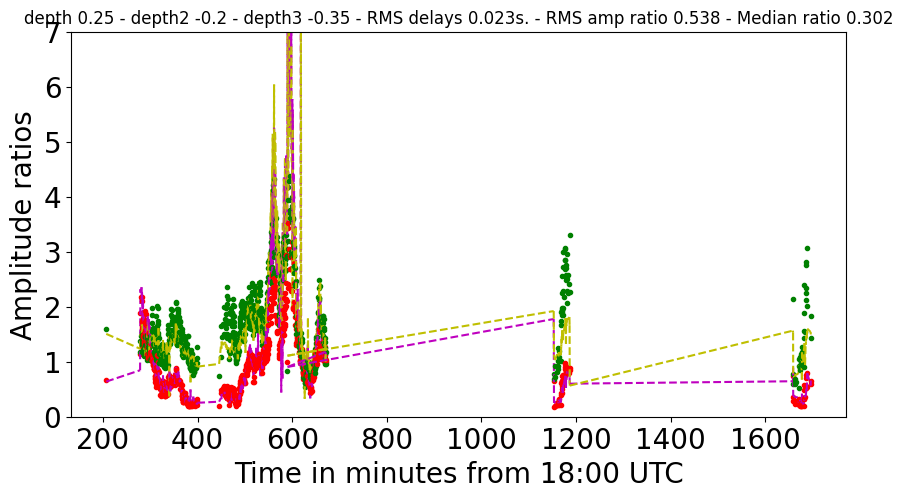

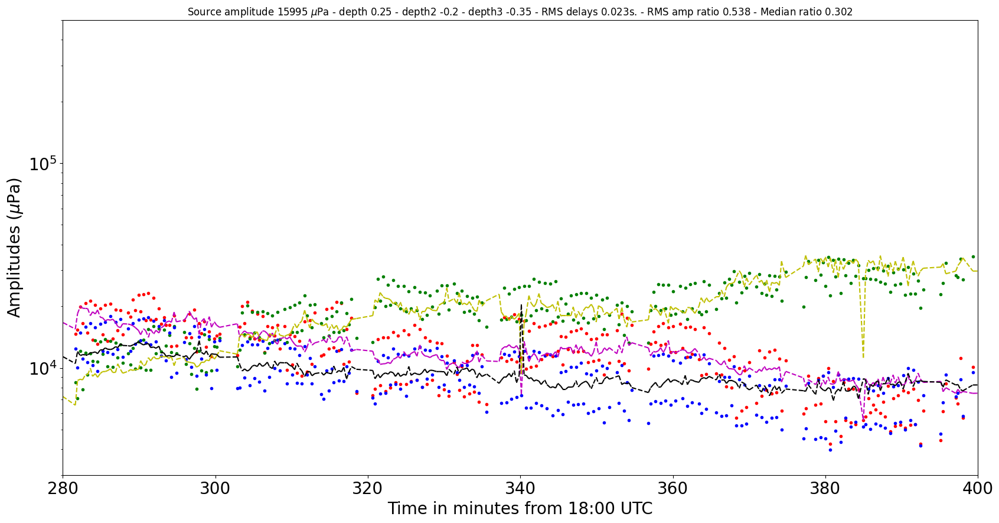

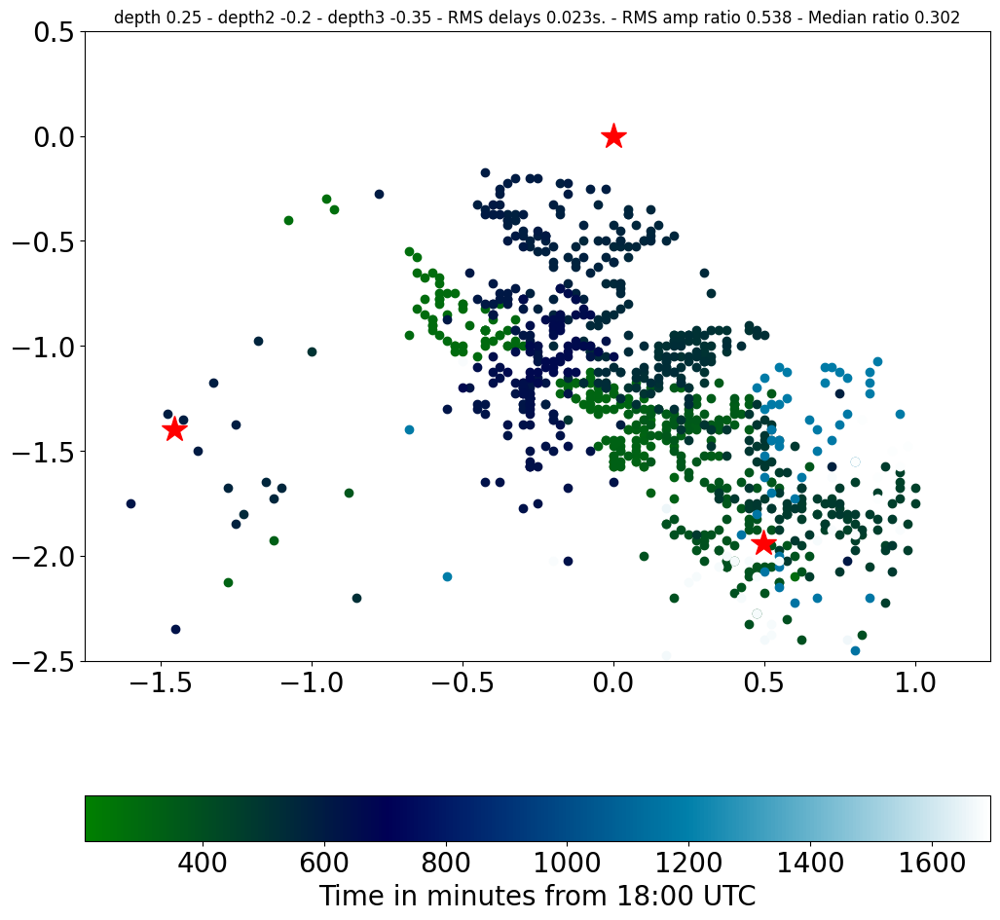

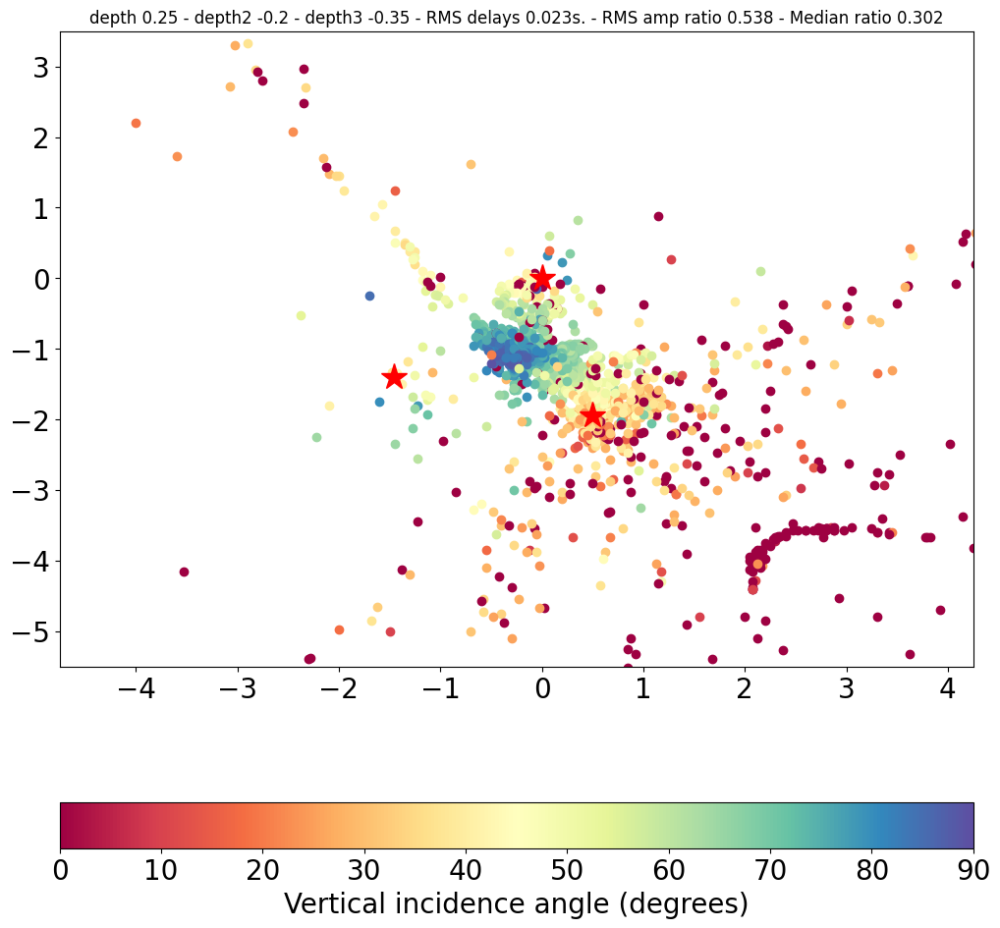

In [94]:
#
# Minimize residual of amplitude ratios for given delays and amplitudes.
# variables are depth of whale and depth differences with H11S1.
# Horizontal position of whales computed from delays for each value
# of whale depth and depth differences with H11S1.
#
delay12 = np.load(path+"delay12"+"_"+timestring+"_"+str(Interval)+".npy")
delay13 = np.load(path+"delay13"+"_"+timestring+"_"+str(Interval)+".npy")
delay23 = np.load(path+"delay23"+"_"+timestring+"_"+str(Interval)+".npy")
amp1 = np.load(path+"amp1"+"_"+timestring+"_"+str(Interval)+".npy")
amp2 = np.load(path+"amp2"+"_"+timestring+"_"+str(Interval)+".npy")
amp3 = np.load(path+"amp3"+"_"+timestring+"_"+str(Interval)+".npy")
apvel = np.load(path+"apvel"+"_"+timestring+"_"+str(Interval)+".npy")
times = np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
xp = np.load(path+"xp"+"_"+timestring+"_"+str(Interval)+".npy")
yp = np.load(path+"yp"+"_"+timestring+"_"+str(Interval)+".npy")
zp = np.load(path+"zp"+"_"+timestring+"_"+str(Interval)+".npy")
tp = np.load(path+"tp"+"_"+timestring+"_"+str(Interval)+".npy")
#
# Loop around whale depth and the two hydrophone depths
#
nk = len(amp1)
#
# Compute horizontal coordinates of centre of triplet.
#
S0 = ((x2[1]+x3[1])/2., (x2[0]+x3[0])/2., 0.)
#
#
#
minang = 20.
delay_only = True
amp_only = False
mindiff = 9999999999999999999999.
print(len(amp1), len(amp2), len(amp3), len(apvel),
      len (times), len(xp), len(yp))
for wdepth in range (1):
  depthw = -0.489-0.05*wdepth
  for depth2 in range (1):
    ddepth2 = -0.2-0.05*depth2
    for depth3 in range (1):
      gc.collect()
      ddepth3 = -0.35-0.05*depth3
      print (depthw,ddepth2,ddepth3)
      diff = 0
      resa = np.empty(0)
      res_all = 0
      vk = 0
      S1 = (0., 0., 0.)
      S2 = (x2[1], x2[0], ddepth2)
      S3 = (x3[1], x3[0], ddepth3)
#
# Loop over all data points
#
      first = True
      xxp = np.empty(0)
      yyp = np.empty(0)
      indp = np.empty(0)
      for k in range(nk):
#        print("Apparent velocity", apvel[k])
        xs = (xp[k], yp[k],0)
        a12 = amp1[k]/amp2[k]
        a13 = amp1[k]/amp3[k]
        if(first and (apvel[k] <= minang or Norm(Diff(S0,xs)) >= 1.5)):
#          print("first and outside", k, apvel[k], Norm(Diff(S0,xs)))
          continue
        if(not first and (apvel[k] <= minang or Norm(Diff(S0,xs)) >= 1.5)):
#          print("not first and outside", k, apvel[k], Norm(Diff(S0,xs)))
          first = True
          continue
        if(apvel[k] > minang and Norm(Diff(S0,xs)) < 1.5):
          if(amp_only): resmet = "amp "
          if(delay_only): resmet = "delay "
          if(not amp_only and not delay_only): resmet = "amp and delay "
          if (first):
 #           print("first and inside", k, apvel[k], Norm(Diff(S0,xs)))
            res,xinit,yinit,zinit,resmap = MinRes(delay12[k],delay13[k],a12,a13,depthw,delay_only,amp_only)
            x = (xinit, yinit, zinit)
            res_all += res*res
#            print(res,xinit,yinit,zinit)
            first = False
            vk+=1
            xxp = np.append(xxp, xinit)
            yyp = np.append(yyp, yinit)
            indp = np.append(indp, k)
            at12, at13 = AmpRatios (S1,S2,S3,x)
            resamp = (a12-at12)*(a12-at12)+(a13-at13)*(a13-at13)
            resa = np.append(resa,math.sqrt(resamp))
            diff += resamp
            continue
          vk += 1
          res,xx,yy,zz, resmap = MinResInc(delay12[k],delay13[k],a12,a13,xinit,yinit,
                           depth,delay_only,amp_only)
#          print("not first and inside", k, apvel[k], Norm(Diff(S0,xs)))
#
          res_all += res*res
          x = (xx, yy, depthw)
          xxp = np.append(xxp, xx)
          yyp = np.append(yyp, yy)
          indp = np.append(indp, k)
          at12, at13 = AmpRatios (S1,S2,S3,x)
          resamp = (a12-at12)*(a12-at12)+(a13-at13)*(a13-at13)
          resa = np.append(resa,math.sqrt(resamp))
          diff += resamp
#          diff += resD
      if (diff < mindiff):
        mindiff = diff
        Optwdepth = depthw+0.739
        Optddepth2 = ddepth2
        Optddepth3 = ddepth3
        Optxp = xxp
        Optyp = yyp
        Optindp = indp
        Optresa = resa
        Optdelres = res_all
        Optmed = np.median(resa)
        fig, ax = plt.subplots(figsize=(12, 12), )
        for k in range (0,len(Optxp)):
          plt.plot(Optxp[k],Optyp[k],'g.',markersize=5)
        plt.plot(S1[0],S1[1],'r*',markersize=20)
        plt.plot(S2[0],S2[1],'r*',markersize=20)
        plt.plot(S3[0],S3[1],'r*',markersize=20)
        pstr = "depth {dep} - depth2 {dep2} - depth3 {dep3} - RMS delays {numdel}s. - RMS amp ratio {num} - Median ratio {mmed}".format(dep=round(Optwdepth,3),dep2 = round(Optddepth2,3), dep3 = round(Optddepth3,3),
                                                                                                                numdel = round(math.sqrt(Optdelres/vk),3), num=round(math.sqrt(mindiff/vk),3), mmed = round(Optmed,3))
        print(pstr, math.sqrt(mindiff/vk), round(math.sqrt(mindiff/vk),3),vk)
        plt.title(pstr)
        plt.xlim([-1.75, 1.25])
        plt.ylim([-2.5, 0.5])
        plt.show()

  print("Whale depth:", depthw, Optwdepth, Optddepth2, Optddepth3, mindiff)
#
#
print("Optimal whale depths and differential depths:",
      Optwdepth, Optddepth2, Optddepth3, "computed on", vk)
dp = np.empty(0)
ap = np.empty(0)
xf=np.empty(0)
yf=np.empty(0)
tf=np.empty(0)
nk = len(Optxp)
for k in range(nk):
  S1 = (0., 0., 0.)
  S2 = (x2[1], x2[0], Optddepth2)
  S3 = (x3[1], x3[0], Optddepth3)
  x = (Optxp[k], Optyp[k], Optwdepth)
  d1 = Norm(Diff(S1,x))
  d2 = Norm(Diff(S2,x))
  d3 = Norm(Diff(S3,x))
  dp=np.append(dp,d1)
  dp=np.append(dp,d2)
  dp=np.append(dp,d3)
  ap=np.append(ap,amp1[int(Optindp[k])])
  ap=np.append(ap,amp2[int(Optindp[k])])
  ap=np.append(ap,amp3[int(Optindp[k])])
  xf=np.append(xf,xp[int(Optindp[k])])
  yf=np.append(yf,yp[int(Optindp[k])])
  tf=np.append(tf,tp[int(Optindp[k])])

#onelinx=(0.4,10)
#oneliny=(40000,1600)
onelinx=(0.4,3)
oneliny=(40000,5333.333)
fig, ax = plt.subplots(figsize=(12, 12), )
for k in range (0,len(dp),3):
  plt.plot(dp[k],ap[k],'r.',markersize=5)
for k in range (1,len(dp),3):
  plt.plot(dp[k],ap[k],'g.',markersize=5)
for k in range (2,len(dp),3):
  plt.plot(dp[k],ap[k],'b.',markersize=5)
plt.plot(onelinx,oneliny,'k-')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Distance in km (log scale)', fontsize = 20)
plt.ylabel('Amplitude in Pa (log scale)', fontsize = 20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0.01,3])
plt.ylim([1000,40000])
plt.title(pstr)
plt.show()
fig, ax = plt.subplots(figsize=(10, 5), )
for k in range (0,len(Optresa)):
  plt.plot(tf[k],Optresa[k],'r.',tf[k], Optmed,'k-')
onelinx=(tf.min(), tf.max())
oneliny=(Optmed, Optmed)
plt.plot(onelinx,oneliny,'k-')
plt.ylim([0,2.])
plt.xlabel('Time in minutes from 18:00 UTC',  fontsize = 20)
plt.ylabel('Amplitude ratio residuals', fontsize = 20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title(pstr)
plt.show()
fig, ax = plt.subplots(figsize=(10, 5), )
for k in range (0,len(tf)):
#  plt.plot(tf[k],ap[3*(k-1)]/ap[3*(k-1)+1],'r.', tf[k],ap[3*(k-1)]/ap[3*(k-1)+2],'g.', tf[k], dp[3*(k-1)+1]/dp[3*(k-1)],'m*',tf[k], dp[3*(k-1)+2]/dp[3*(k-1)], 'y*', markersize=5)
  plt.plot(tf[k],ap[3*(k-1)]/ap[3*(k-1)+1],'r.', tf[k],ap[3*(k-1)]/ap[3*(k-1)+2],'g.')
  if(k>0):
    onelinx=(tf[k-1], tf[k])
    oneliny=(dp[3*(k-2)+1]/dp[3*(k-2)],dp[3*(k-1)+1]/dp[3*(k-1)])
    plt.plot(onelinx, oneliny,color='m',linestyle='--')
    onelinx=(tf[k-1], tf[k])
    oneliny=(dp[3*(k-2)+2]/dp[3*(k-2)],dp[3*(k-1)+2]/dp[3*(k-1)])
    plt.plot(onelinx, oneliny,color='y',linestyle='--')
plt.xlabel('Time in minutes from 18:00 UTC', fontsize=20)
plt.ylabel('Amplitude ratios', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim([0,7])
plt.title(pstr)
plt.show()
fig, ax = plt.subplots(figsize=(20, 10), )
av_one_over_d = np.mean(1/dp)
av_amp = np.mean(ap)
SourceAmp = av_amp/av_one_over_d
for k in range (0,len(tf)):
  plt.plot(tf[k],ap[3*(k-1)],'r.', tf[k],ap[3*(k-1)+1], 'g.', tf[k], ap[3*(k-1)+2],'b.')
  if(k>0):
    onelinx=(tf[k-1], tf[k])
    oneliny=(SourceAmp/dp[3*(k-2)], SourceAmp/dp[3*(k-1)])
    plt.plot(onelinx, oneliny,color='m',linestyle='--')
    onelinx=(tf[k-1], tf[k])
    oneliny=(SourceAmp/dp[3*(k-2)+1], SourceAmp/dp[3*(k-1)+1])
    plt.plot(onelinx, oneliny,color='y',linestyle='--')
    oneliny=(SourceAmp/dp[3*(k-2)+2], SourceAmp/dp[3*(k-1)+2])
    plt.plot(onelinx, oneliny,color='k',linestyle='--')
plt.xlabel('Time in minutes from 18:00 UTC', fontsize=20)
plt.ylabel('Amplitudes ($\u03BC$Pa)', fontsize=20)
plt.yscale('log')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim([3000,500000])
plt.xlim([280,400])
stramp="Source amplitude {am} $\u03BC$Pa - ".format(am=round(SourceAmp))
pstra=stramp+pstr
plt.title(pstra)
plt.show()

fig, ax = plt.subplots(figsize=(12, 12), )
siz = len(xf)
for k in range (0,siz):
  plt.scatter(xf[k],yf[k], marker='o', c=tf[k], vmin=tf[0], vmax=tf[siz-1], cmap="ocean")

cbar = plt.colorbar(orientation="horizontal")
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Time in minutes from 18:00 UTC', fontsize=20)
plt.plot(S1[0],S1[1],'r*',markersize=20)
plt.plot(S2[0],S2[1],'r*',markersize=20)
plt.plot(S3[0],S3[1],'r*',markersize=20)
plt.title(pstr)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([-1.75, 1.25])
plt.ylim([-2.5, 0.5])
plt.show()
fig, ax = plt.subplots(figsize=(12, 12), )
siz = len(apvel)
for k in range (0,siz):
  plt.scatter(xp[k],yp[k], marker='o', c=apvel[k], vmin=0, vmax=90, cmap="Spectral")
cbar = plt.colorbar(orientation="horizontal")
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Vertical incidence angle (degrees)', fontsize=20)
plt.plot(S1[0],S1[1],'r*',markersize=20)
plt.plot(S2[0],S2[1],'r*',markersize=20)
plt.plot(S3[0],S3[1],'r*',markersize=20)
plt.title(pstr)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([-4.75, 4.25])
plt.ylim([-5.5, 3.5])
plt.show()

1131 1131 1131 1131 1131 1131 1131
-0.539 -0.0 0.0
first and large angle 0 78.0 0.6690730571854546
first and large angle 15 60.0 17.448831905111405
not first and large angle 16 24.0 18.60137257379165
first and large angle 23 36.0 21.993825851281336
not first and large angle 24 24.0 21.759633461346024
not first and large angle 25 26.0 22.928970402314555
not first and large angle 26 42.0 21.962982359632143
first and large angle 28 36.0 22.061740898174925
not first and large angle 29 22.0 23.02183708456978
not first and large angle 30 28.0 24.21829862405926
not first and large angle 31 28.0 25.255447831181026
not first and large angle 32 34.0 24.295188410198918
first and large angle 34 30.0 24.28876871953145
first and large angle 37 38.0 25.968228656369327
not first and large angle 38 26.0 27.11859448048759
not first and large angle 39 28.0 28.34153378972894
not first and large angle 40 24.0 29.53125588700743
first and large angle 44 38.0 29.329911318472842
first and large angle 46 22.0 3

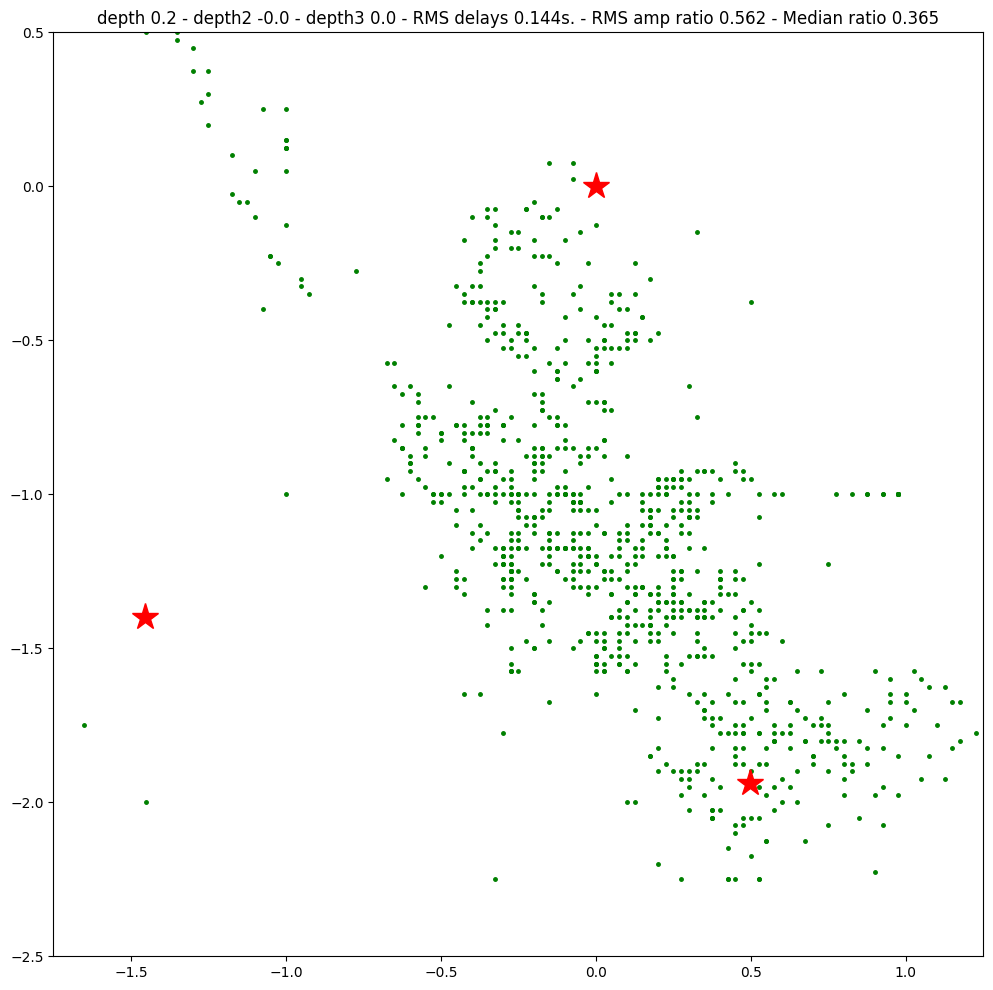

-0.539 -0.0 -0.05
first and large angle 0 78.0 0.6690730571854546
first and large angle 15 60.0 17.448831905111405
not first and large angle 16 24.0 18.60137257379165
first and large angle 23 36.0 21.993825851281336
not first and large angle 24 24.0 21.759633461346024
not first and large angle 25 26.0 22.928970402314555
not first and large angle 26 42.0 21.962982359632143
first and large angle 28 36.0 22.061740898174925
not first and large angle 29 22.0 23.02183708456978
not first and large angle 30 28.0 24.21829862405926
not first and large angle 31 28.0 25.255447831181026
not first and large angle 32 34.0 24.295188410198918
first and large angle 34 30.0 24.28876871953145
first and large angle 37 38.0 25.968228656369327
not first and large angle 38 26.0 27.11859448048759
not first and large angle 39 28.0 28.34153378972894
not first and large angle 40 24.0 29.53125588700743
first and large angle 44 38.0 29.329911318472842
first and large angle 46 22.0 31.20568799870951
first and large 

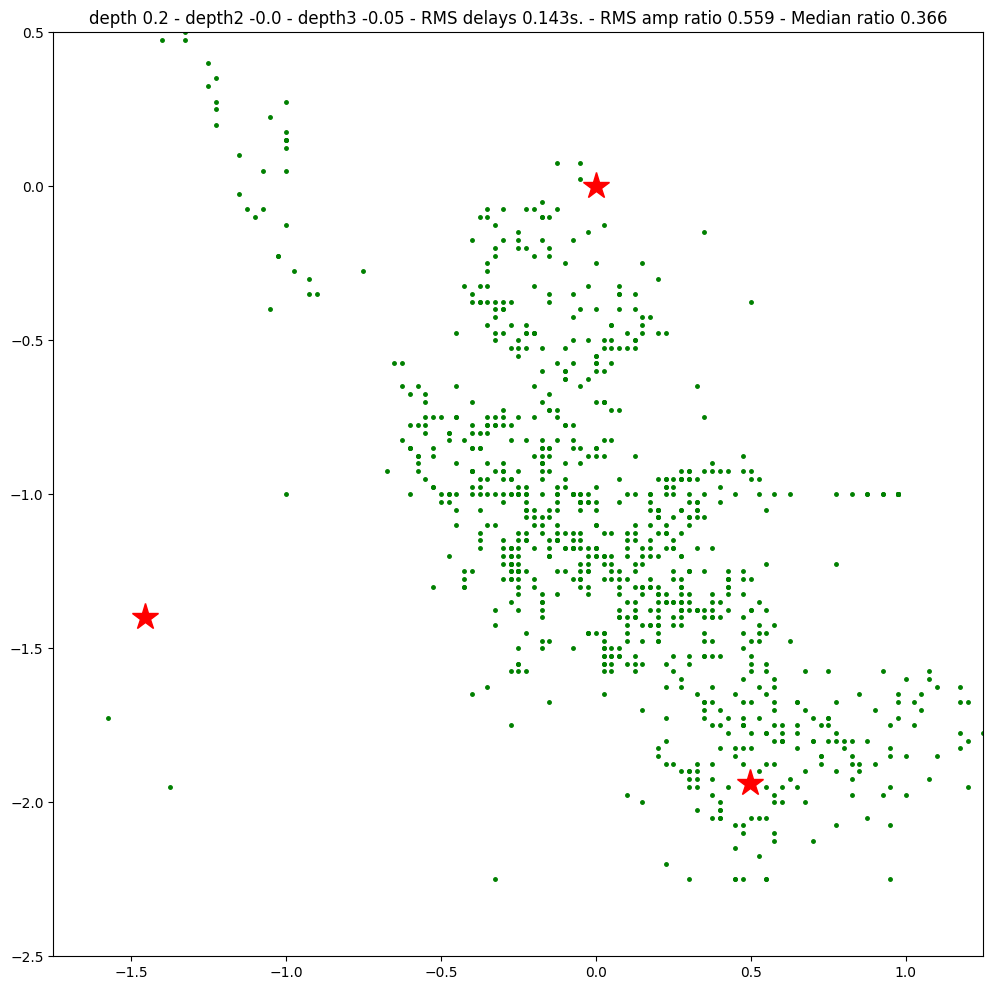

-0.539 -0.0 -0.1
first and large angle 0 78.0 0.6690730571854546
first and large angle 15 60.0 17.448831905111405
not first and large angle 16 24.0 18.60137257379165
first and large angle 23 36.0 21.993825851281336
not first and large angle 24 24.0 21.759633461346024
not first and large angle 25 26.0 22.928970402314555
not first and large angle 26 42.0 21.962982359632143
first and large angle 28 36.0 22.061740898174925
not first and large angle 29 22.0 23.02183708456978
not first and large angle 30 28.0 24.21829862405926
not first and large angle 31 28.0 25.255447831181026
not first and large angle 32 34.0 24.295188410198918
first and large angle 34 30.0 24.28876871953145
first and large angle 37 38.0 25.968228656369327
not first and large angle 38 26.0 27.11859448048759
not first and large angle 39 28.0 28.34153378972894
not first and large angle 40 24.0 29.53125588700743
first and large angle 44 38.0 29.329911318472842
first and large angle 46 22.0 31.20568799870951
first and large a

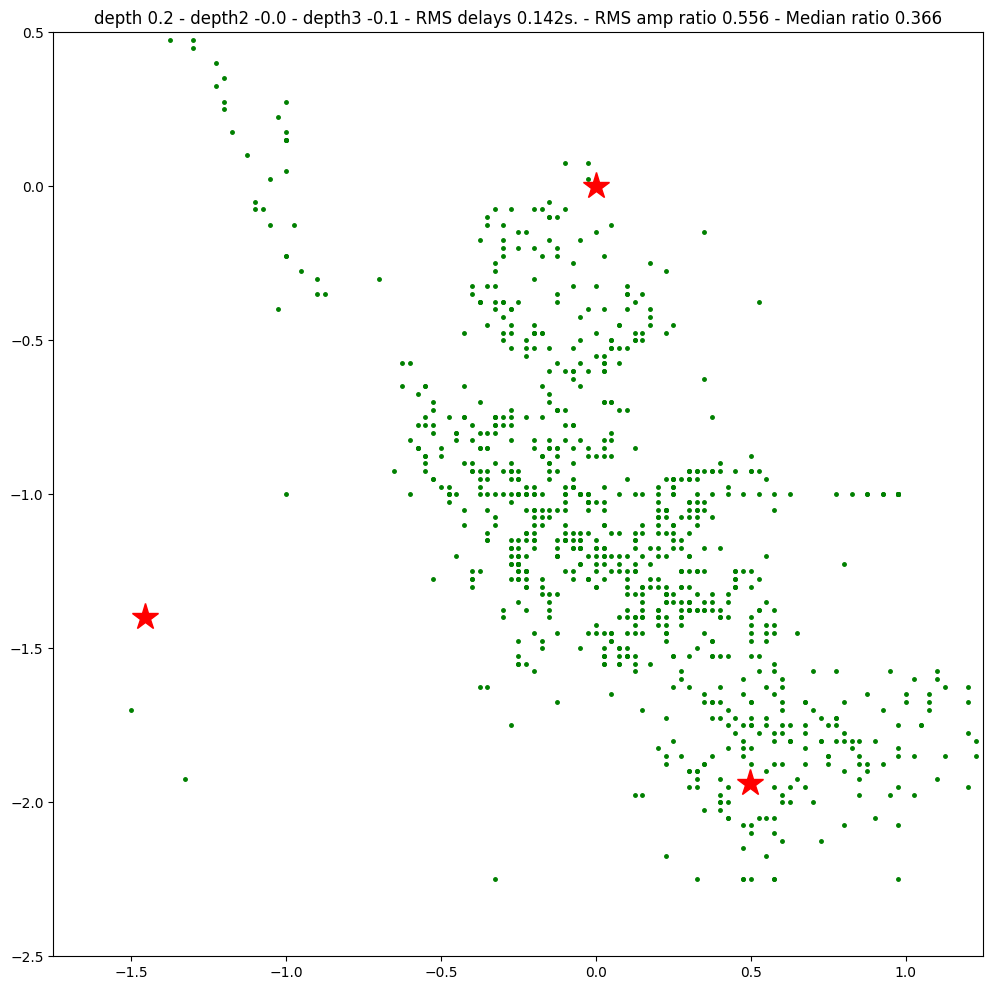

-0.539 -0.0 -0.15000000000000002
first and large angle 0 78.0 0.6690730571854546
first and large angle 15 60.0 17.448831905111405
not first and large angle 16 24.0 18.60137257379165
first and large angle 23 36.0 21.993825851281336
not first and large angle 24 24.0 21.759633461346024
not first and large angle 25 26.0 22.928970402314555
not first and large angle 26 42.0 21.962982359632143
first and large angle 28 36.0 22.061740898174925
not first and large angle 29 22.0 23.02183708456978
not first and large angle 30 28.0 24.21829862405926
not first and large angle 31 28.0 25.255447831181026
not first and large angle 32 34.0 24.295188410198918
first and large angle 34 30.0 24.28876871953145
first and large angle 37 38.0 25.968228656369327
not first and large angle 38 26.0 27.11859448048759
not first and large angle 39 28.0 28.34153378972894
not first and large angle 40 24.0 29.53125588700743
first and large angle 44 38.0 29.329911318472842
first and large angle 46 22.0 31.20568799870951
f

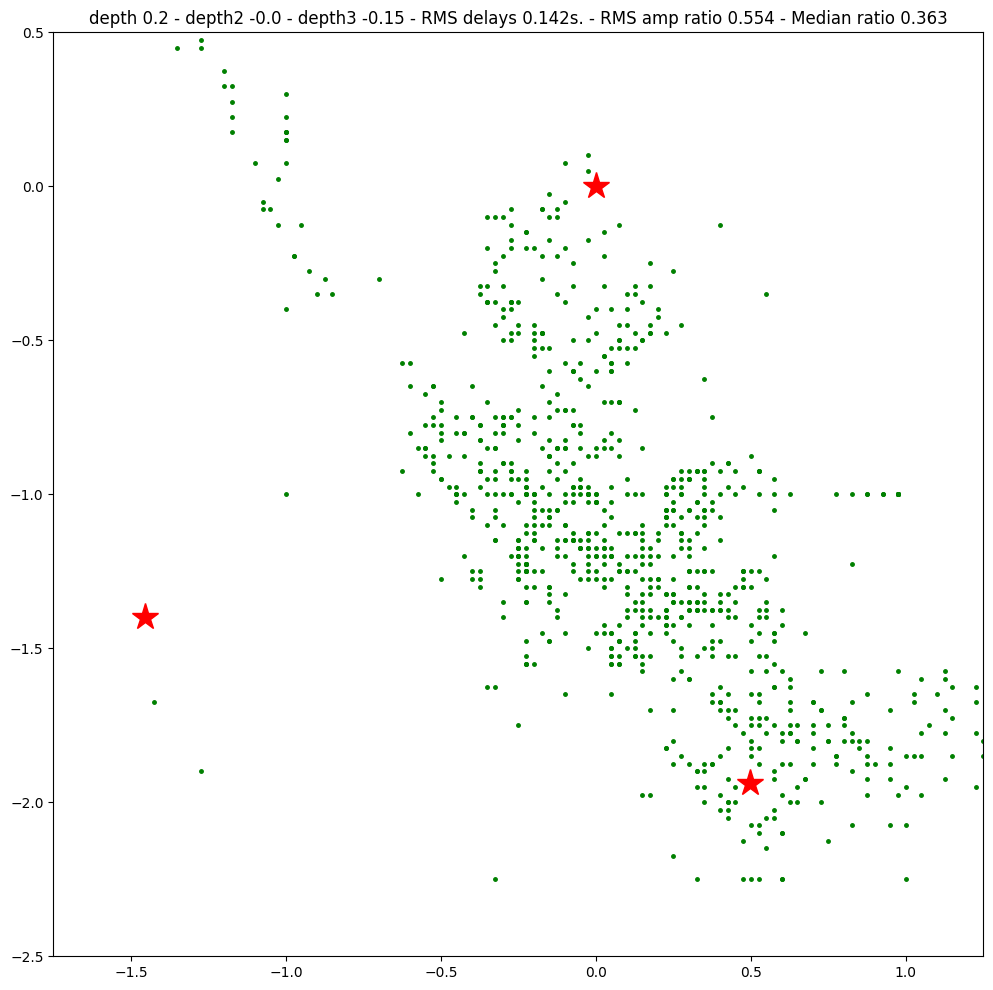

-0.539 -0.0 -0.2
first and large angle 0 78.0 0.6690730571854546
first and large angle 15 60.0 17.448831905111405
not first and large angle 16 24.0 18.60137257379165
first and large angle 23 36.0 21.993825851281336
not first and large angle 24 24.0 21.759633461346024
not first and large angle 25 26.0 22.928970402314555
not first and large angle 26 42.0 21.962982359632143
first and large angle 28 36.0 22.061740898174925
not first and large angle 29 22.0 23.02183708456978
not first and large angle 30 28.0 24.21829862405926
not first and large angle 31 28.0 25.255447831181026
not first and large angle 32 34.0 24.295188410198918
first and large angle 34 30.0 24.28876871953145
first and large angle 37 38.0 25.968228656369327
not first and large angle 38 26.0 27.11859448048759
not first and large angle 39 28.0 28.34153378972894
not first and large angle 40 24.0 29.53125588700743
first and large angle 44 38.0 29.329911318472842
first and large angle 46 22.0 31.20568799870951
first and large a

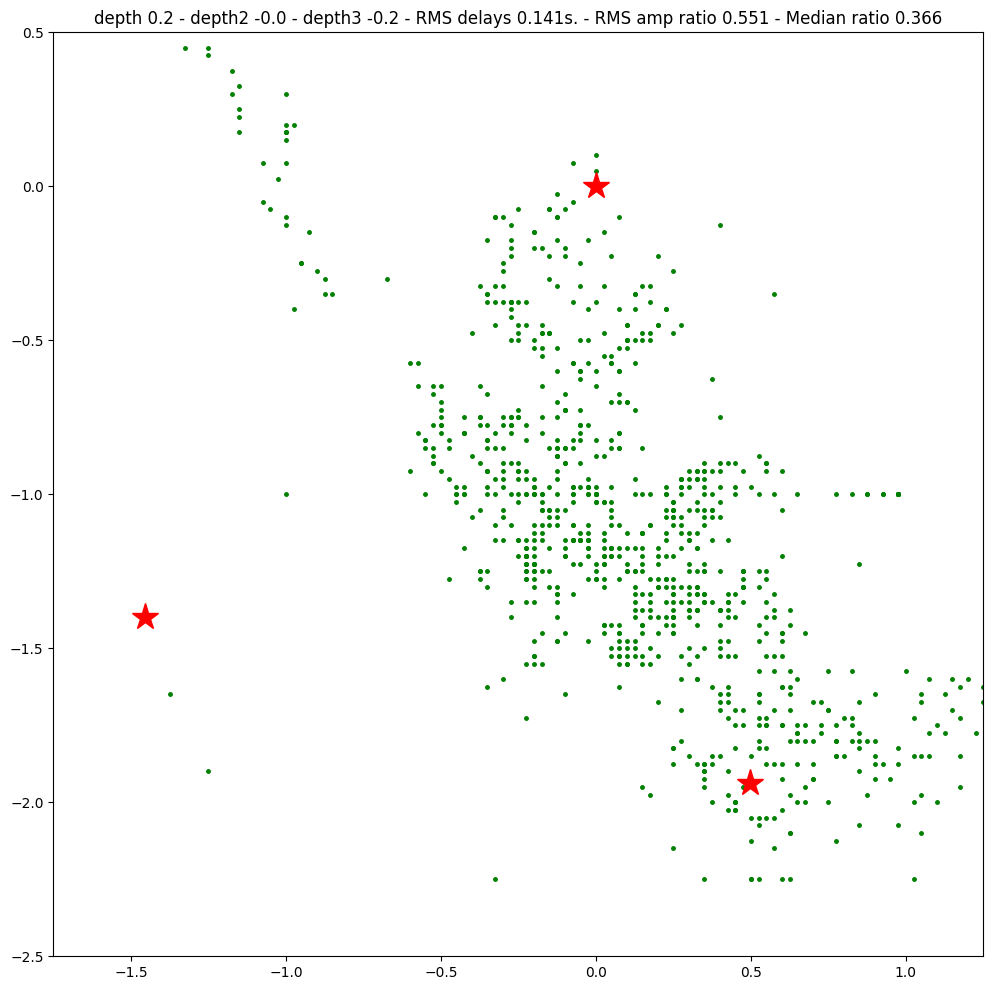

-0.539 -0.0 -0.25
first and large angle 0 78.0 0.6690730571854546
first and large angle 15 60.0 17.448831905111405
not first and large angle 16 24.0 18.60137257379165
first and large angle 23 36.0 21.993825851281336
not first and large angle 24 24.0 21.759633461346024
not first and large angle 25 26.0 22.928970402314555
not first and large angle 26 42.0 21.962982359632143
first and large angle 28 36.0 22.061740898174925
not first and large angle 29 22.0 23.02183708456978
not first and large angle 30 28.0 24.21829862405926
not first and large angle 31 28.0 25.255447831181026
not first and large angle 32 34.0 24.295188410198918
first and large angle 34 30.0 24.28876871953145
first and large angle 37 38.0 25.968228656369327
not first and large angle 38 26.0 27.11859448048759
not first and large angle 39 28.0 28.34153378972894
not first and large angle 40 24.0 29.53125588700743
first and large angle 44 38.0 29.329911318472842
first and large angle 46 22.0 31.20568799870951
first and large 

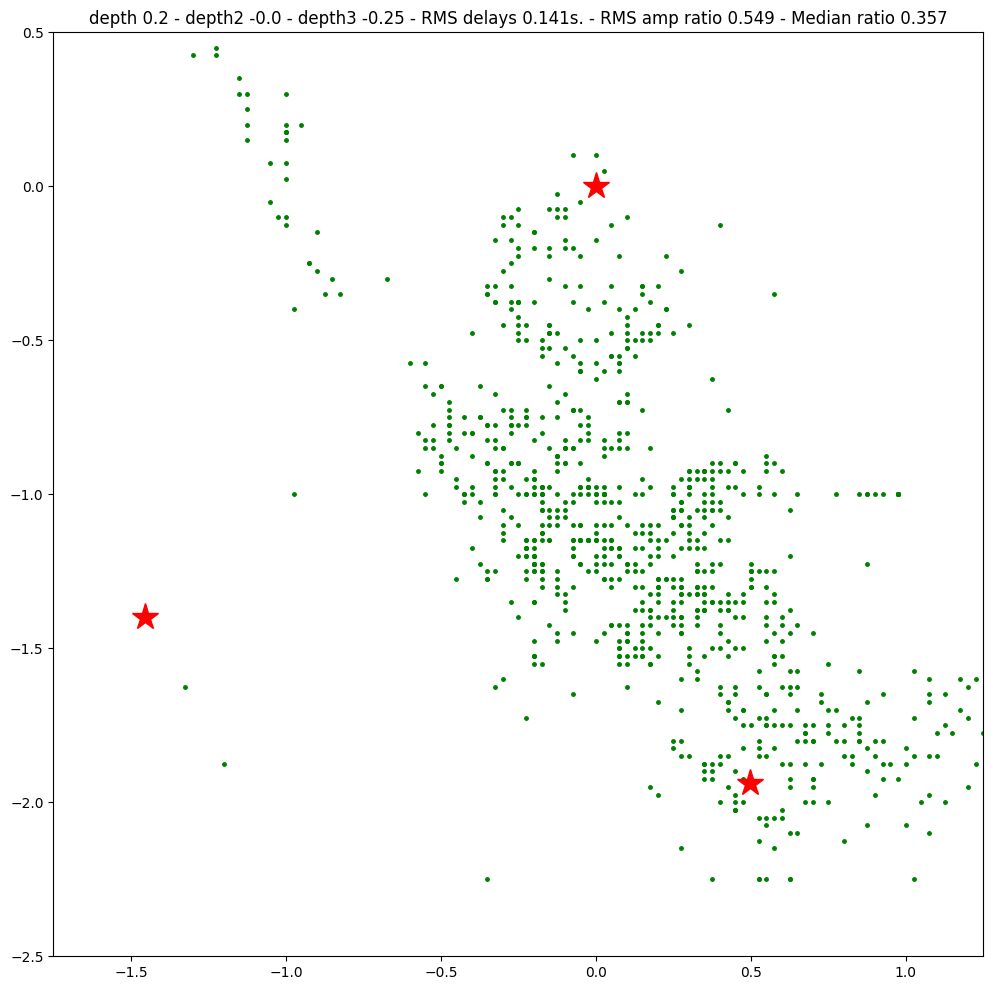

Whale depth: -0.539 0.19999999999999996 -0.0 -0.25 280.6958911260488
Optimal whale depths and differential depths: 0.19999999999999996 -0.0 -0.25 computed on 930


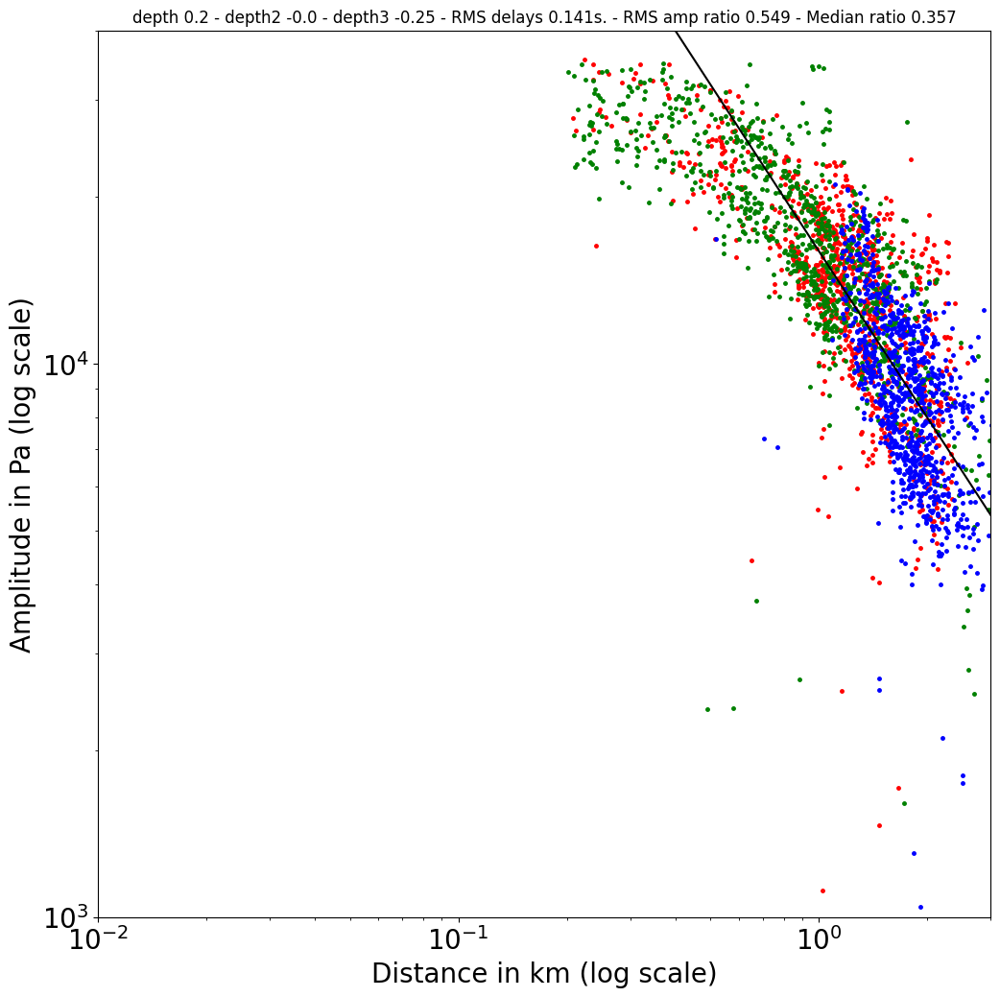

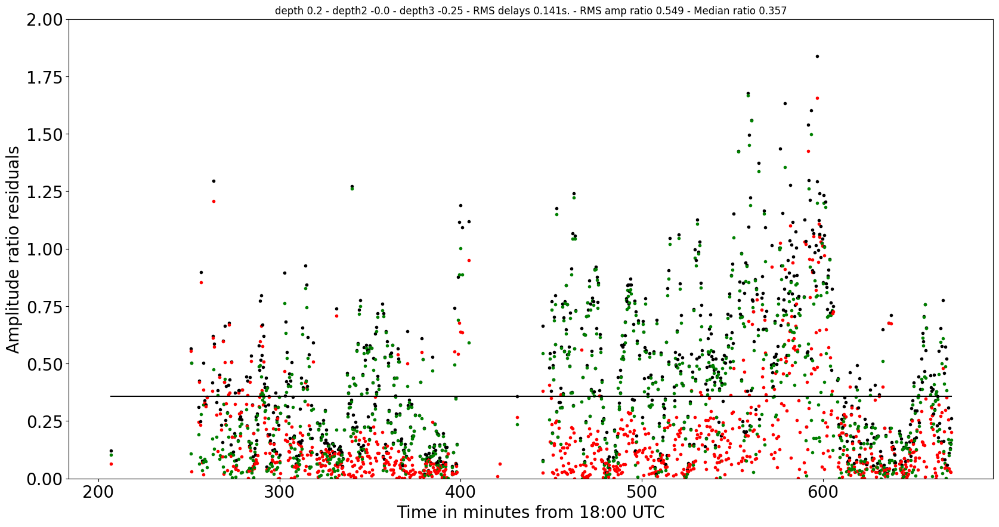

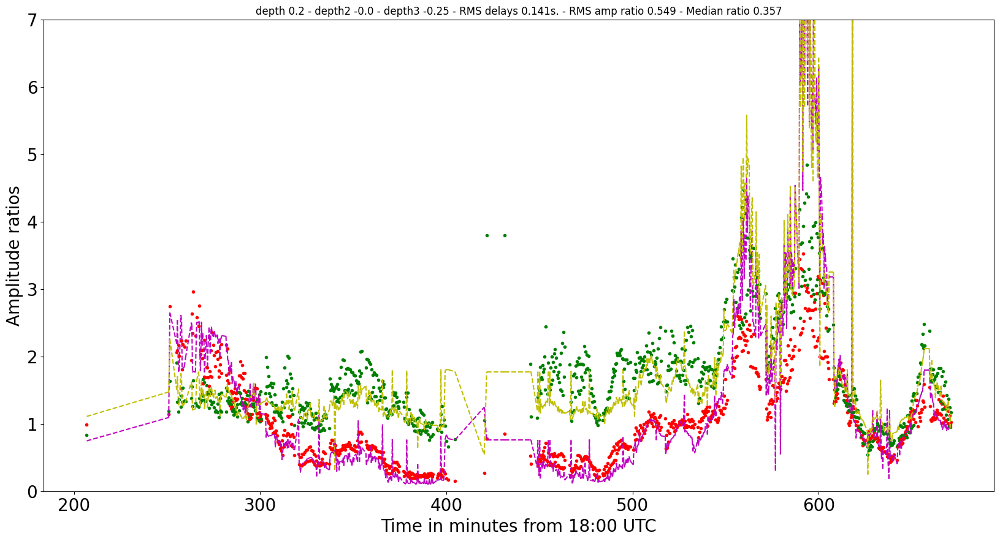

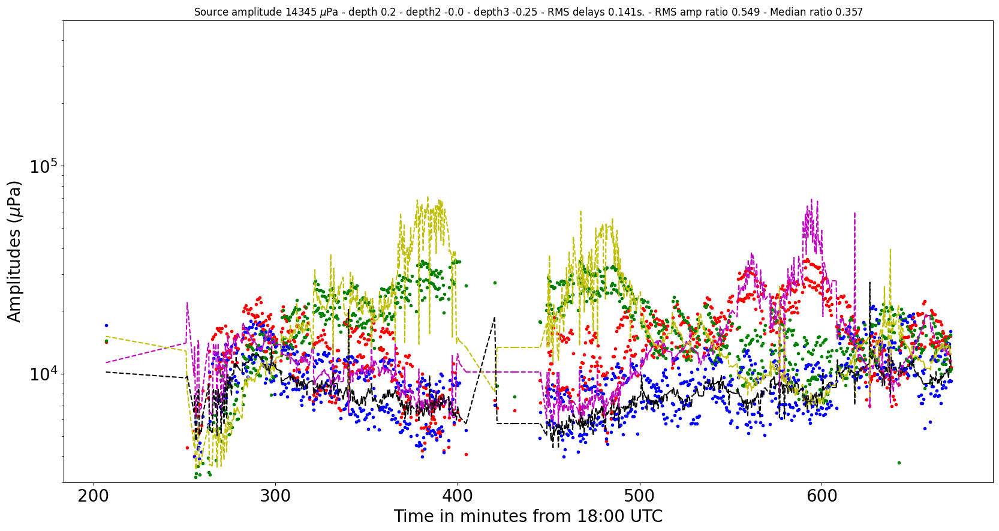

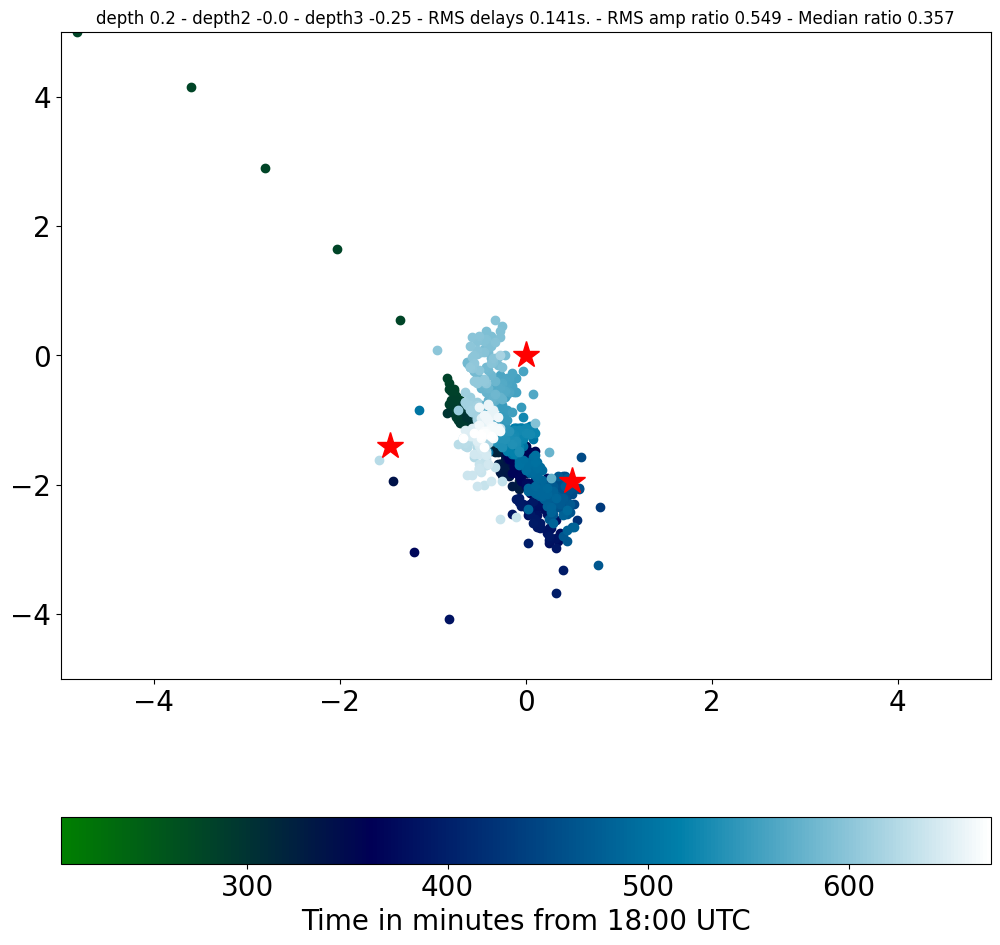

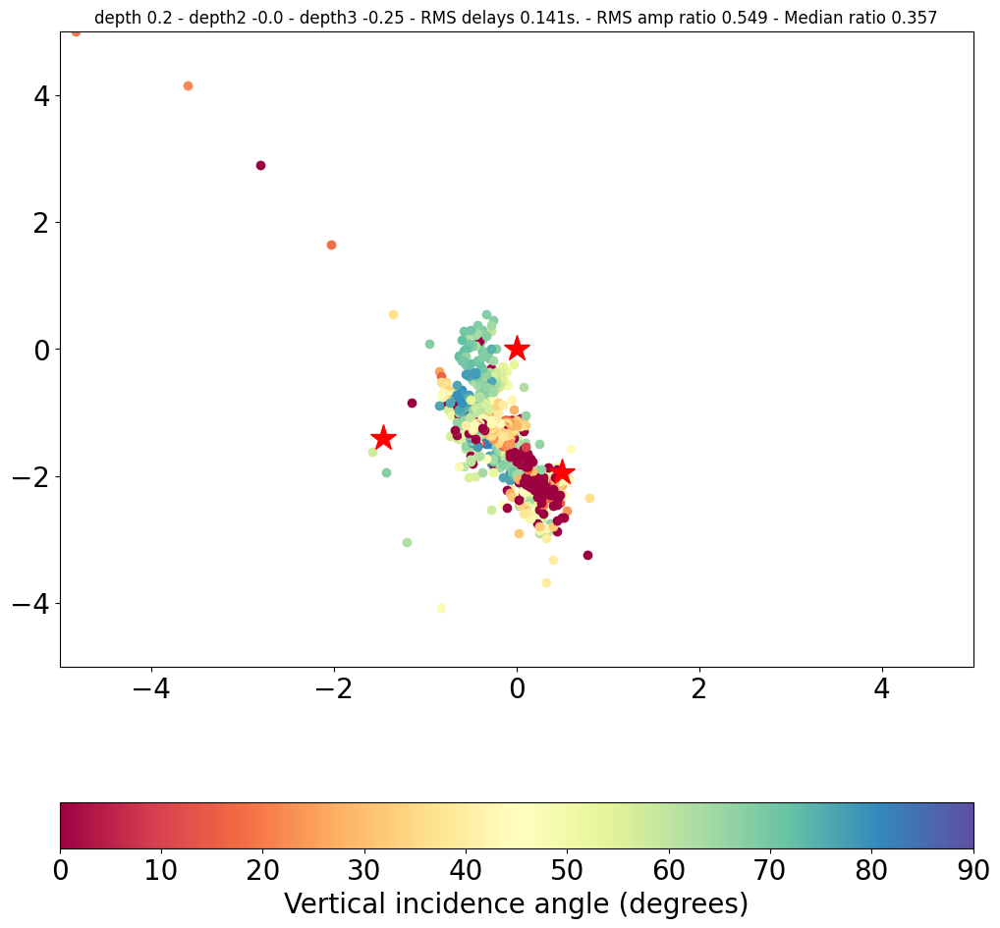

In [ ]:
#MINANG ONLY
# Minimize residual of amplitude ratios for given delays and amplitudes.
# variables are depth of whale and depth differences with H11S1.
# Horizontal position of whales computed from delays for each value
# of whale depth and depth differences with H11S1.
#
delay12 = np.load(path+"delay12"+"_"+timestring+"_"+str(Interval)+".npy")
delay13 = np.load(path+"delay13"+"_"+timestring+"_"+str(Interval)+".npy")
delay23 = np.load(path+"delay23"+"_"+timestring+"_"+str(Interval)+".npy")
amp1 = np.load(path+"amp1"+"_"+timestring+"_"+str(Interval)+".npy")
amp2 = np.load(path+"amp2"+"_"+timestring+"_"+str(Interval)+".npy")
amp3 = np.load(path+"amp3"+"_"+timestring+"_"+str(Interval)+".npy")
apvel = np.load(path+"apvel"+"_"+timestring+"_"+str(Interval)+".npy")
times = np.load(path+"times"+"_"+timestring+"_"+str(Interval)+".npy")
xp = np.load(path+"xp"+"_"+timestring+"_"+str(Interval)+".npy")
yp = np.load(path+"yp"+"_"+timestring+"_"+str(Interval)+".npy")
zp = np.load(path+"zp"+"_"+timestring+"_"+str(Interval)+".npy")
tp = np.load(path+"tp"+"_"+timestring+"_"+str(Interval)+".npy")
#
# Loop around whale depth and the two hydrophone depths
#
nk = len(amp1)
#
# Compute horizontal coordinates of centre of triplet.
#
S0 = ((x2[1]+x3[1])/2., (x2[0]+x3[0])/2., 0.)
#
#
#
minang = 20.
delay_only = True
amp_only = False
mindiff = 9999999999999999999999.
print(len(amp1), len(amp2), len(amp3), len(apvel),
      len (times), len(xp), len(yp))
for wdepth in range (1):
  depthw = -0.539+0.05*wdepth
  for depth2 in range (1):
    ddepth2 = -0.-0.05*depth2
    for depth3 in range (6):
      gc.collect()
      ddepth3 = 0.-0.05*depth3
      print (depthw,ddepth2,ddepth3)
      diff = 0
      resa = np.empty(0)
      resa1 = np.empty(0)
      resa2 = np.empty(0)
      res_all = 0
      vk = 0
      S1 = (0., 0., 0.)
      S2 = (x2[1], x2[0], ddepth2)
      S3 = (x3[1], x3[0], ddepth3)
#
# Loop over all data points
#
      first = True
      xxp = np.empty(0)
      yyp = np.empty(0)
      indp = np.empty(0)
      for k in range(nk):
#        print("Apparent velocity", apvel[k])
        xs = (xp[k], yp[k],0)
        a12 = amp1[k]/amp2[k]
        a13 = amp1[k]/amp3[k]
        if(first and apvel[k] <= minang):
#          print("first and small angle", k, apvel[k], Norm(Diff(S0,xs)))
          continue
        if(not first and apvel[k] <= minang):
#          print("not first and small angle", k, apvel[k], Norm(Diff(S0,xs)))
          first = True
          continue
        if(apvel[k] > minang):
#
          if (first):
            print("first and large angle", k, apvel[k], Norm(Diff(S0,xs)))
            res,xinit,yinit,zinit,resmap = MinRes(delay12[k],delay13[k],a12,a13,depthw,delay_only,amp_only)
            x = (xinit, yinit, zinit)
            res_all += res*res
#            print(res,xinit,yinit,zinit)
            first = False
            vk+=1
            xxp = np.append(xxp, xinit)
            yyp = np.append(yyp, yinit)
            indp = np.append(indp, k)
            at12, at13 = AmpRatios (S1,S2,S3,x)
            resamp1 = (a12-at12)*(a12-at12)
            resa1 = np.append(resa1,math.sqrt(resamp1))
            resamp2 = (a13-at13)*(a13-at13)
            resa2 = np.append(resa2,math.sqrt(resamp2))
            resa = np.append(resa,math.sqrt(resamp1+resamp2))
            diff += resamp1+resamp2
            continue
          vk += 1
          res,xx,yy,zz, resmap = MinResInc(delay12[k],delay13[k],a12,a13,xinit,yinit,
                           depth,delay_only,amp_only)
          print("not first and large angle", k, apvel[k], Norm(Diff(S0,xs)))
#
          res_all += res*res
          x = (xx, yy, depthw)
          xxp = np.append(xxp, xx)
          yyp = np.append(yyp, yy)

          indp = np.append(indp, k)
          at12, at13 = AmpRatios (S1,S2,S3,x)
          resamp1 = (a12-at12)*(a12-at12)
          resa1 = np.append(resa1,math.sqrt(resamp1))
          resamp2 = (a13-at13)*(a13-at13)
          resa2 = np.append(resa2,math.sqrt(resamp2))
          resa = np.append(resa,math.sqrt(resamp1+resamp2))
          diff += resamp1+resamp2
#          diff += resD
      if (diff < mindiff):
        mindiff = diff
        Optwdepth = depthw+0.739
        Optddepth2 = ddepth2
        Optddepth3 = ddepth3
        Optxp = xxp
        Optyp = yyp
        Optindp = indp
        Optresa1 = resa1
        Optresa2 = resa2
        Optresa = resa
        Optdelres = res_all
        Optmed = np.median(resa)
        fig, ax = plt.subplots(figsize=(12, 12), )
        for k in range (0,len(Optxp)):
          plt.plot(Optxp[k],Optyp[k],'g.',markersize=5)
        plt.plot(S1[0],S1[1],'r*',markersize=20)
        plt.plot(S2[0],S2[1],'r*',markersize=20)
        plt.plot(S3[0],S3[1],'r*',markersize=20)
        pstr = "depth {dep} - depth2 {dep2} - depth3 {dep3} - RMS delays {numdel}s. - RMS amp ratio {num} - Median ratio {mmed}".format(dep=round(Optwdepth,3),dep2 = round(Optddepth2,3), dep3 = round(Optddepth3,3),
                                                                                                                numdel = round(math.sqrt(Optdelres/vk),3), num=round(math.sqrt(mindiff/vk),3), mmed = round(Optmed,3))
        print(pstr, math.sqrt(mindiff/vk), round(math.sqrt(mindiff/vk),3),vk)
        plt.title(pstr)
        plt.xlim([-1.75, 1.25])
        plt.ylim([-2.5, 0.5])
        plt.show()

  print("Whale depth:", depthw, Optwdepth, Optddepth2, Optddepth3, mindiff)
#
#
print("Optimal whale depths and differential depths:",
      Optwdepth, Optddepth2, Optddepth3, "computed on", vk)
dp = np.empty(0)
ap = np.empty(0)
xf=np.empty(0)
yf=np.empty(0)
tf=np.empty(0)
nk = len(Optxp)
for k in range(nk):
  S1 = (0., 0., 0.)
  S2 = (x2[1], x2[0], Optddepth2)
  S3 = (x3[1], x3[0], Optddepth3)
  x = (Optxp[k], Optyp[k], Optwdepth)
  d1 = Norm(Diff(S1,x))
  d2 = Norm(Diff(S2,x))
  d3 = Norm(Diff(S3,x))
  dp=np.append(dp,d1)
  dp=np.append(dp,d2)
  dp=np.append(dp,d3)
  ap=np.append(ap,amp1[int(Optindp[k])])
  ap=np.append(ap,amp2[int(Optindp[k])])
  ap=np.append(ap,amp3[int(Optindp[k])])
  xf=np.append(xf,xp[int(Optindp[k])])
  yf=np.append(yf,yp[int(Optindp[k])])
  tf=np.append(tf,tp[int(Optindp[k])])

#onelinx=(0.4,10)
#oneliny=(40000,1600)
onelinx=(0.4,3)
oneliny=(40000,5333.333)
fig, ax = plt.subplots(figsize=(12, 12), )
for k in range (0,len(dp),3):
  plt.plot(dp[k],ap[k],'r.',markersize=5)
for k in range (1,len(dp),3):
  plt.plot(dp[k],ap[k],'g.',markersize=5)
for k in range (2,len(dp),3):
  plt.plot(dp[k],ap[k],'b.',markersize=5)
plt.plot(onelinx,oneliny,'k-')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Distance in km (log scale)', fontsize = 20)
plt.ylabel('Amplitude in Pa (log scale)', fontsize = 20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([0.01,3])
plt.ylim([1000,40000])
plt.title(pstr)
plt.show()
fig, ax = plt.subplots(figsize=(20, 10), )
for k in range (0,len(Optresa)):
  plt.plot(tf[k],Optresa[k],'k.',tf[k],Optresa1[k],'r.',tf[k],Optresa2[k],'g.')
onelinx=(tf.min(), tf.max())
oneliny=(Optmed, Optmed)
plt.plot(onelinx,oneliny,'k-')
plt.ylim([0,2.])
plt.xlabel('Time in minutes from 18:00 UTC',  fontsize = 20)
plt.ylabel('Amplitude ratio residuals', fontsize = 20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title(pstr)
plt.show()
fig, ax = plt.subplots(figsize=(20, 10), )
for k in range (0,len(tf)):
#  plt.plot(tf[k],ap[3*(k-1)]/ap[3*(k-1)+1],'r.', tf[k],ap[3*(k-1)]/ap[3*(k-1)+2],'g.', tf[k], dp[3*(k-1)+1]/dp[3*(k-1)],'m*',tf[k], dp[3*(k-1)+2]/dp[3*(k-1)], 'y*', markersize=5)
  plt.plot(tf[k],ap[3*(k-1)]/ap[3*(k-1)+1],'r.', tf[k],ap[3*(k-1)]/ap[3*(k-1)+2],'g.')
  if(k>0):
    onelinx=(tf[k-1], tf[k])
    oneliny=(dp[3*(k-2)+1]/dp[3*(k-2)],dp[3*(k-1)+1]/dp[3*(k-1)])
    plt.plot(onelinx, oneliny,color='m',linestyle='--')
    onelinx=(tf[k-1], tf[k])
    oneliny=(dp[3*(k-2)+2]/dp[3*(k-2)],dp[3*(k-1)+2]/dp[3*(k-1)])
    plt.plot(onelinx, oneliny,color='y',linestyle='--')
plt.xlabel('Time in minutes from 18:00 UTC', fontsize=20)
plt.ylabel('Amplitude ratios', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim([0,7])
plt.title(pstr)
plt.show()
fig, ax = plt.subplots(figsize=(20, 10), )
av_one_over_d = np.mean(1/dp)
av_amp = np.mean(ap)
SourceAmp = av_amp/av_one_over_d
for k in range (0,len(tf)):
  plt.plot(tf[k],ap[3*(k-1)],'r.', tf[k],ap[3*(k-1)+1], 'g.', tf[k], ap[3*(k-1)+2],'b.')
  if(k>0):
    onelinx=(tf[k-1], tf[k])
    oneliny=(SourceAmp/dp[3*(k-2)], SourceAmp/dp[3*(k-1)])
    plt.plot(onelinx, oneliny,color='m',linestyle='--')
    onelinx=(tf[k-1], tf[k])
    oneliny=(SourceAmp/dp[3*(k-2)+1], SourceAmp/dp[3*(k-1)+1])
    plt.plot(onelinx, oneliny,color='y',linestyle='--')
    oneliny=(SourceAmp/dp[3*(k-2)+2], SourceAmp/dp[3*(k-1)+2])
    plt.plot(onelinx, oneliny,color='k',linestyle='--')
plt.xlabel('Time in minutes from 18:00 UTC', fontsize=20)
plt.ylabel('Amplitudes ($\u03BC$Pa)', fontsize=20)
plt.yscale('log')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim([3000,500000])
#plt.xlim([280,400])
stramp="Source amplitude {am} $\u03BC$Pa - ".format(am=round(SourceAmp))
pstra=stramp+pstr
plt.title(pstra)
plt.show()

fig, ax = plt.subplots(figsize=(12, 12), )
siz = len(xf)
for k in range (0,siz):
  plt.scatter(xf[k],yf[k], marker='o', c=tf[k], vmin=tf[0], vmax=tf[siz-1], cmap="ocean")

cbar = plt.colorbar(orientation="horizontal")
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Time in minutes from 18:00 UTC', fontsize=20)
plt.plot(S1[0],S1[1],'r*',markersize=20)
plt.plot(S2[0],S2[1],'r*',markersize=20)
plt.plot(S3[0],S3[1],'r*',markersize=20)
plt.title(pstr)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([-5, 5])
plt.ylim([-5, 5])
plt.show()
fig, ax = plt.subplots(figsize=(12, 12), )
siz = len(xf)
for k in range (0,siz):
  plt.scatter(xf[k],yf[k], marker='o', c=apvel[k], vmin=0, vmax=90, cmap="Spectral")
cbar = plt.colorbar(orientation="horizontal")
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Vertical incidence angle (degrees)', fontsize=20)
plt.plot(S1[0],S1[1],'r*',markersize=20)
plt.plot(S2[0],S2[1],'r*',markersize=20)
plt.plot(S3[0],S3[1],'r*',markersize=20)
plt.title(pstr)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim([-5, 5])
plt.ylim([-5, 5])
plt.show()

In [92]:
#
# Concatenate data
#
stringlist = ["2024-02-19 21:00:00","2024-02-19 23:00:00","2024-02-20 01:00:00","2024-02-20 03:00:00",
              "2024-02-20 05:00:00","2024-02-20 10:00:00","2024-02-20 12:00:00",
              "2024-02-20 21:00:00"]
delay12 = np.empty(0)
delay13 = np.empty(0)
delay23 = np.empty(0)
amp1 = np.empty(0)
amp2 = np.empty(0)
amp3 = np.empty(0)
apvel = np.empty(0)
times = np.empty(0)
xp = np.empty(0)
yp = np.empty(0)
zp = np.empty(0)
tp = np.empty(0)
Int = 7200
for timestring in stringlist:
  d1 = np.load(path+"delay12"+"_"+timestring+"_"+str(Int)+".npy")
  d2 = np.load(path+"delay13"+"_"+timestring+"_"+str(Int)+".npy")
  d3 = np.load(path+"delay23"+"_"+timestring+"_"+str(Int)+".npy")
  a1 = np.load(path+"amp1"+"_"+timestring+"_"+str(Int)+".npy")
  a2 = np.load(path+"amp2"+"_"+timestring+"_"+str(Int)+".npy")
  a3 = np.load(path+"amp3"+"_"+timestring+"_"+str(Int)+".npy")
  ang = np.load(path+"apvel"+"_"+timestring+"_"+str(Int)+".npy")
  ti = np.load(path+"times"+"_"+timestring+"_"+str(Int)+".npy")
  x = np.load(path+"xp"+"_"+timestring+"_"+str(Int)+".npy")
  y = np.load(path+"yp"+"_"+timestring+"_"+str(Int)+".npy")
  z = np.load(path+"zp"+"_"+timestring+"_"+str(Int)+".npy")
  t = np.load(path+"tp"+"_"+timestring+"_"+str(Int)+".npy")
  delay12 = np.append(delay12,d1)
  delay13 = np.append(delay13,d2)
  delay23 = np.append(delay23,d3)
  amp1 = np.append(amp1,a1)
  amp2 = np.append(amp2,a2)
  amp3 = np.append(amp3,a3)
  apvel = np.append(apvel,ang)
  times = np.append(times,ti)
  xp = np.append(xp,x)
  yp = np.append(yp,y)
  zp = np.append(zp,z)
  tp = np.append(tp,t)
#
#
#
for k in range(len(delay12)):
  print(tp[k])
#
# Save data
#
timestring = "2024-02-19 21:00:00"
Int = 36000
np.save(path+"delay12"+"_"+timestring+"_"+str(Int),delay12)
np.save(path+"delay13"+"_"+timestring+"_"+str(Int),delay13)
np.save(path+"delay23"+"_"+timestring+"_"+str(Int),delay23)
np.save(path+"amp1"+"_"+timestring+"_"+str(Int),amp1)
np.save(path+"amp2"+"_"+timestring+"_"+str(Int),amp2)
np.save(path+"amp3"+"_"+timestring+"_"+str(Int),amp3)
np.save(path+"times"+"_"+timestring+"_"+str(Int),times)
np.save(path+"xp"+"_"+timestring+"_"+str(Int),xp)
np.save(path+"yp"+"_"+timestring+"_"+str(Int),yp)
np.save(path+"zp"+"_"+timestring+"_"+str(Int),zp)
np.save(path+"tp"+"_"+timestring+"_"+str(Int),tp)
np.save(path+"apvel"+"_"+timestring+"_"+str(Int),apvel)




206.88146666666665
213.8548
222.23280000000003
244.78853333333333
246.10219999999998
246.3912
246.75646666666665
247.04873333333333
247.44706666666667
248.08993333333333
248.62106666666665
248.90693333333334
249.57126666666667
249.9684
250.25300000000001
250.9088
251.5192
251.80113333333333
252.1772
252.78220000000002
253.40526666666665
254.09766666666667
254.3842
255.25973333333332
255.5412
256.1848
256.52406666666667
256.81006666666667
257.4592
257.81913333333335
258.10626666666667
258.4938
259.2966
259.6524
259.94126666666665
260.31986666666666
262.4488
263.055
263.3405333333333
263.6983333333333
263.97926666666666
264.33160000000004
264.61926666666665
264.9653333333333
265.2511333333333
265.63460000000003
265.9196
266.2932
266.58340000000004
266.9494666666667
267.2392
267.63213333333334
267.91273333333334
268.51
268.8005333333333
269.16013333333336
269.45046666666667
269.8163333333333
270.1014666666667
270.50866666666667
271.1419333333333
271.7388666666667
272.02406666666667
272.54

[link text](https://)